# Loading the Data

In [1]:
%load_ext rpy2.ipython

In [115]:
import pandas

cpu = pandas.read_csv('./sycl-bench-gold-computecpp-opencl.csv',comment='#')
cpu = pandas.merge(cpu, pandas.read_csv('./sycl-bench-gold-computecpp-cpu.csv',comment='#'),how='outer')
cpu = pandas.merge(cpu, pandas.read_csv('./sycl-bench-gold-dpc++-cpu.csv',comment='#'),how='outer')
cpu = pandas.merge(cpu, pandas.read_csv('./sycl-bench-gold-hipsycl-cpu.csv',comment='#'),how='outer')
cpu = pandas.merge(cpu, pandas.read_csv('./sycl-bench-gold-trisycl-cpu.csv',comment='#'),how='outer')

gpu = pandas.read_csv('./sycl-bench-p100-dpc++-cuda.csv',comment='#')
gpu = pandas.merge(gpu, pandas.read_csv('./sycl-bench-p100-hipsycl-cuda.csv',comment='#'),how='outer')
gpu = pandas.merge(gpu, pandas.read_csv('./sycl-bench-gfx906-hipsycl-rocm.csv',comment='#'),how='outer')

all_res = pandas.merge(gpu,cpu,how='outer')
print("using sample size of:",len(list(map(float,cpu['run-time-samples'][0].split()))),"elements per data-point")    

using sample size of: 50 elements per data-point


Restructure dataframe to split up the `run-time-samples` into separate `run-time-sample` by duplicating each row with a unique sample -- this is for `R` to do the heavy-lifting by generating the box-and-whisker plots and summary statistics.

In [116]:

from tqdm import tqdm

import os.path
from os import path
if path.exists("./outdat.pkl"):
    # read previously created pickle file if it exists
    outdat = pandas.read_pickle("./outdat.pkl")
else:
    outdat = pandas.DataFrame()

    for index, row in tqdm(all_res.iterrows(),total=all_res.shape[0]):
        samples = row['run-time-samples']
        x = samples.split(' ')
        for y in x:
            tmprow = row
            tmprow['run-time-sample'] = float(y)
            outdat = outdat.append(tmprow)
    
    outdat = outdat.drop(columns=['run-time-samples'])
    outdat.to_pickle("./outdat.pkl")

all_res = outdat



100%|██████████| 1342/1342 [12:51<00:00,  1.74it/s]


In [117]:
all_res

,Benchmark name,Verification,device-name,kernel-time-mean,kernel-time-median,kernel-time-min,kernel-time-samples,kernel-time-stddev,kernel-time-throughput,local-size,problem-size,run-time-mean,run-time-median,run-time-min,run-time-sample,run-time-stddev,run-time-throughput,sycl-implementation,throughput-metric
0,MicroBench_HostDeviceBandwidth_1D_H2D_Contiguous,PASS,Tesla P100-PCIE-12GB,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1024.0,0.230399,0.224118,0.223125,0.223125,0.018842,4.481796,LLVM CUDA (Codeplay),1.0
0,MicroBench_HostDeviceBandwidth_1D_H2D_Contiguous,PASS,Tesla P100-PCIE-12GB,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1024.0,0.230399,0.224118,0.223125,0.223125,0.018842,4.481796,LLVM CUDA (Codeplay),1.0
0,MicroBench_HostDeviceBandwidth_1D_H2D_Contiguous,PASS,Tesla P100-PCIE-12GB,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1024.0,0.230399,0.224118,0.223125,0.223144,0.018842,4.481796,LLVM CUDA (Codeplay),1.0
0,MicroBench_HostDeviceBandwidth_1D_H2D_Contiguous,PASS,Tesla P100-PCIE-12GB,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1024.0,0.230399,0.224118,0.223125,0.223151,0.018842,4.481796,LLVM CUDA (Codeplay),1.0
0,MicroBench_HostDeviceBandwidth_1D_H2D_Contiguous,PASS,Tesla P100-PCIE-12GB,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1024.0,0.230399,0.224118,0.223125,0.223216,0.018842,4.481796,LLVM CUDA (Codeplay),1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1341,MicroBench_DRAM_fp32_1,PASS,unknown,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1024.0,1.005815,1.001539,0.982869,1.034844,0.019687,2.034859,triSYCL,2.0
1341,MicroBench_DRAM_fp32_1,PASS,unknown,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1024.0,1.005815,1.001539,0.982869,1.035934,0.019687,2.034859,triSYCL,2.0
1341,MicroBench_DRAM_fp32_1,PASS,unknown,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1024.0,1.005815,1.001539,0.982869,1.038609,0.019687,2.034859,triSYCL,2.0
1341,MicroBench_DRAM_fp32_1,PASS,unknown,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1024.0,1.005815,1.001539,0.982869,1.045763,0.019687,2.034859,triSYCL,2.0


We also add the `Runtime` variable which is named according to the `sycl-implementation` and `device-name`. This is needed because all CPU backends cannot query the device name.

In [207]:
def clear_up_runtime (row):
    if row['device-name'] == "Device 66af" and row['sycl-implementation'] == "hipSYCL":
        return "hipSYCL ROCm - gfx906" # (gfx906)
    elif row['device-name'] == "Tesla P100-PCIE-12GB" and row['sycl-implementation'] == "hipSYCL":
        return "hipSYCL CUDA - P100"
    elif row['device-name'] == "hipCPU OpenMP host device" and row['sycl-implementation'] == "hipSYCL":
        return "hipSYCL OpenMP - Gold"    
    elif row['device-name'] == "Tesla P100-PCIE-12GB" and row['sycl-implementation'] == "LLVM CUDA (Codeplay)":
        return "DPC++ CUDA - P100"
    elif row['device-name'] == "SYCL host device" and row['sycl-implementation'] == 'LLVM (Intel DPC++)':
        return "DPC++ pthreads - Gold"

    
    #todo: generate and check this one:
    elif row['device-name'] == "Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz" and row['sycl-implementation'] == 'LLVM (Intel DPC++)':
        return "DPC++ OpenCL - Gold"
    
    
    elif row['device-name'] == "Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz" and row['sycl-implementation'] == 'ComputeCpp':
        return "ComputeCpp OpenCL - Gold"
    elif row['device-name'] == "Host Device" and row['sycl-implementation'] == 'ComputeCpp':
        return "ComputeCpp pthreads - Gold"
    elif row['device-name'] == 'unknown' and row['sycl-implementation'] == 'triSYCL':
        return "triSYCL OpenMP - Gold"
    
all_res['Runtime'] = all_res.apply (lambda row: clear_up_runtime(row), axis=1)

Convert these runtimes to factors.

In [208]:
%%R -i all_res -o all_res

all_res$Runtime <- as.factor(all_res$Runtime)

/usr/local/lib/python3.6/dist-packages/rpy2/robjects/pandas2ri.py:63: UserWarning: Error while trying to convert the column "Verification". Fall back to string conversion. The error is: Series can only be of one type, or None (and here we have <class 'str'> and <class 'rpy2.rinterface_lib.sexp.NACharacterType'>).
  % (name, str(e)))


Permanently assign colour to each runtime -- to avoid confusion and colour reuse when plots are broken down into types of accelerator.

In [209]:
%%R -i all_res -o colour_scale -o all_res

# While viridis is a great colour palette, we need high contrast between neighouring elements --like the rainbow palette-- but still need to be colour-blind friendly.
#library('viridisLite')
#colours <- viridisLite::viridis(length(unique(all_res$Runtime)))

#library(RColorBrewer)
#colours <- brewer.pal(length(unique(all_res$Runtime)),'Dark2')

#assign an order to the way SYCL runtimes are presented
all_res$Runtime <- factor(all_res$Runtime, levels = c(
  "ComputeCpp pthreads - Gold",
  "DPC++ pthreads - Gold",
  "hipSYCL OpenMP - Gold",
  "triSYCL OpenMP - Gold",
  "ComputeCpp OpenCL - Gold",
  "DPC++ CUDA - P100",
  "hipSYCL CUDA - P100",
  "hipSYCL ROCm - gfx906"
 ))

#all_res$Runtime <- factor(all_res$Runtime, levels = c("ComputeCPP pthreads - Gold", "DPC++ pthreads - Gold", "hipSYCL OpenMP - Gold", "triSYCL OpenMP - Gold",  "ComputeCPP OpenCL - Gold", "DPC++ OpenCL - Gold", "DPC++ CUDA - P100","hipSYCL CUDA - P100", "hipSYCL ROCm - gfx906"))

library(scales)
colours <- hue_pal()(length(unique(all_res$Runtime)))

names(colours) <- levels(all_res$Runtime)
colour_scale <- scale_colour_manual(name = "Runtime",values = colours)

# Overview of Results

In [153]:
indat = all_res

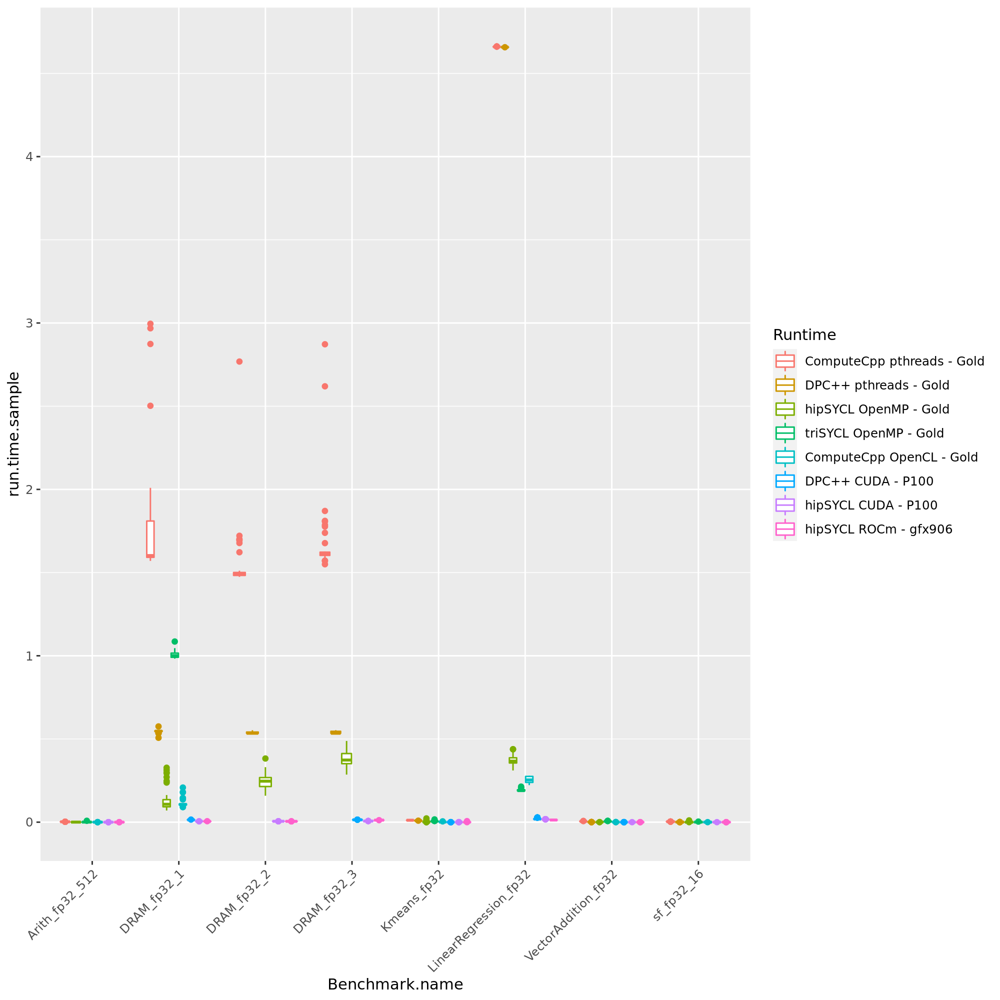

In [210]:
%%R -i indat -i colour_scale -w 10 -h 10 --units in -r 200

library('ggplot2')
library('cowplot')
names(indat) <- make.names(names(indat), unique = FALSE, allow_ = TRUE)

p1 <- ggplot(indat, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + expand_limits(y = 0) + geom_boxplot() + colour_scale

p1


This is obviously too crowded to make any sense of, so let's divide according to SYCL execution construct.

In [155]:
#list all available benchmark names
all_res['Benchmark name'].unique()

roi_wgp = all_res['Benchmark name'].isin(['LinearRegressionCoeff_fp32','LinearRegressionCoeff_fp64','MicroBench_LocalMem_int32_4096','MicroBench_LocalMem_fp32_4096','MicroBench_LocalMem_fp64_4096','NBody_NDRange_fp32','NBody_NDRange_fp64','Pattern_Reduction_NDRange_int32','Pattern_Reduction_NDRange_int64','Pattern_Reduction_NDRange_fp32','Pattern_Reduction_NDRange_fp64','Pattern_SegmentedReduction_NDRange_int16','Pattern_SegmentedReduction_NDRange_int32','Pattern_SegmentedReduction_NDRange_int64','Pattern_SegmentedReduction_NDRange_fp32','Pattern_SegmentedReduction_NDRange_fp64','ScalarProduct_NDRange_int32','ScalarProduct_NDRange_int64','ScalarProduct_NDRange_fp32','ScalarProduct_NDRange_fp64','Runtime_DAGTaskThroughput_NDRangeParallelFor','Runtime_IndependentDAGTaskThroughput_NDRangeParallelFor'])
wgp = all_res[roi_wgp]

roi_hdp = all_res['Benchmark name'].isin(['Runtime_IndependentDAGTaskThroughput_HierarchicalParallelFor','Runtime_DAGTaskThroughput_HierarchicalParallelFor','NBody_Hierarchical_fp32','NBody_Hierarchical_fp64','Pattern_Reduction_Hierarchical_int32','Pattern_Reduction_Hierarchical_int64','Pattern_Reduction_Hierarchical_fp32','Pattern_Reduction_Hierarchical_fp64','Pattern_SegmentedReduction_Hierarchical_int16','Pattern_SegmentedReduction_Hierarchical_int32','Pattern_SegmentedReduction_Hierarchical_int64','Pattern_SegmentedReduction_Hierarchical_fp32','Pattern_SegmentedReduction_Hierarchical_fp64','ScalarProduct_Hierarchical_int32','ScalarProduct_Hierarchical_int64','ScalarProduct_Hierarchical_fp32','ScalarProduct_Hierarchical_fp64'])
hdp = all_res[roi_hdp]

roi_task = all_res['Benchmark name'].isin(['Runtime_IndependentDAGTaskThroughput_SingleTask','Runtime_DAGTaskThroughput_SingleTask'])
task = all_res[roi_task]

roi_sync = all_res['Benchmark name'].isin(['LinearRegressionCoeff_fp32','LinearRegressionCoeff_fp64','MicroBench_LocalMem_int32_4096','MicroBench_LocalMem_fp32_4096','MicroBench_LocalMem_fp64_4096','NBody_NDRange_fp32','NBody_NDRange_fp64','Pattern_Reduction_NDRange_int32','Pattern_Reduction_NDRange_int64','Pattern_Reduction_NDRange_fp32','Pattern_Reduction_NDRange_fp64','Pattern_SegmentedReduction_NDRange_int16','Pattern_SegmentedReduction_NDRange_int32','Pattern_SegmentedReduction_NDRange_int64','Pattern_SegmentedReduction_NDRange_fp32','Pattern_SegmentedReduction_NDRange_fp64','ScalarProduct_NDRange_int32','ScalarProduct_NDRange_int64', 'ScalarProduct_NDRange_fp32','ScalarProduct_NDRange_fp64'])
sync = all_res[roi_sync]

roi_wgp =  [ not x for x in roi_wgp]
roi_hdp =  [ not x for x in roi_hdp]
roi_task = [ not x for x in roi_task]
roi_sync = [ not x for x in roi_sync]
roi_bkp =  [a and b and c and d for a, b, c, d in zip(roi_wgp, roi_hdp, roi_task, roi_sync)]
bkp = all_res[roi_bkp]


Now also chomp of the leading `MicroBench_`, `Runtime_` and `Pattern_` -- since the type of computation only lengthens the variable names in the plots

In [156]:
def chompLeadingSYCLBenchExperimentType(_dataframe):
    _dataframe['Benchmark name'] = _dataframe['Benchmark name'].str.replace("MicroBench_","")
    _dataframe['Benchmark name'] = _dataframe['Benchmark name'].str.replace("Runtime_","")
    _dataframe['Benchmark name'] = _dataframe['Benchmark name'].str.replace("Pattern_","")
    return(_dataframe)

bkp = chompLeadingSYCLBenchExperimentType(bkp)
bkp

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

,Benchmark name,Verification,device-name,kernel-time-mean,kernel-time-median,kernel-time-min,kernel-time-samples,kernel-time-stddev,kernel-time-throughput,local-size,problem-size,run-time-mean,run-time-median,run-time-min,run-time-sample,run-time-stddev,run-time-throughput,sycl-implementation,throughput-metric,Runtime
1,HostDeviceBandwidth_1D_H2D_Contiguous,PASS,Tesla P100-PCIE-12GB,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1024.0,0.230399,0.224118,0.223125,0.223125,0.018842,4.481796,LLVM CUDA (Codeplay),1.0,DPC++ CUDA - P100
2,HostDeviceBandwidth_1D_H2D_Contiguous,PASS,Tesla P100-PCIE-12GB,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1024.0,0.230399,0.224118,0.223125,0.223125,0.018842,4.481796,LLVM CUDA (Codeplay),1.0,DPC++ CUDA - P100
3,HostDeviceBandwidth_1D_H2D_Contiguous,PASS,Tesla P100-PCIE-12GB,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1024.0,0.230399,0.224118,0.223125,0.223144,0.018842,4.481796,LLVM CUDA (Codeplay),1.0,DPC++ CUDA - P100
4,HostDeviceBandwidth_1D_H2D_Contiguous,PASS,Tesla P100-PCIE-12GB,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1024.0,0.230399,0.224118,0.223125,0.223151,0.018842,4.481796,LLVM CUDA (Codeplay),1.0,DPC++ CUDA - P100
5,HostDeviceBandwidth_1D_H2D_Contiguous,PASS,Tesla P100-PCIE-12GB,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1024.0,0.230399,0.224118,0.223125,0.223216,0.018842,4.481796,LLVM CUDA (Codeplay),1.0,DPC++ CUDA - P100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63684,DRAM_fp32_1,PASS,unknown,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1024.0,1.005815,1.001539,0.982869,1.034844,0.019687,2.034859,triSYCL,2.0,triSYCL OpenMP - Gold
63685,DRAM_fp32_1,PASS,unknown,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1024.0,1.005815,1.001539,0.982869,1.035934,0.019687,2.034859,triSYCL,2.0,triSYCL OpenMP - Gold
63686,DRAM_fp32_1,PASS,unknown,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1024.0,1.005815,1.001539,0.982869,1.038609,0.019687,2.034859,triSYCL,2.0,triSYCL OpenMP - Gold
63687,DRAM_fp32_1,PASS,unknown,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1024.0,1.005815,1.001539,0.982869,1.045763,0.019687,2.034859,triSYCL,2.0,triSYCL OpenMP - Gold


# BKP -- Basic Data-Parallel Kernels

First we extract the kernels which utilize BKP.
There are too many results to present in a single plot.

In [157]:
indat = bkp

/usr/local/lib/python3.6/dist-packages/rpy2/robjects/pandas2ri.py:63: UserWarning: Error while trying to convert the column "Verification". Fall back to string conversion. The error is: Series can only be of one type, or None (and here we have <class 'str'> and <class 'rpy2.rinterface_lib.sexp.NACharacterType'>).
  % (name, str(e)))


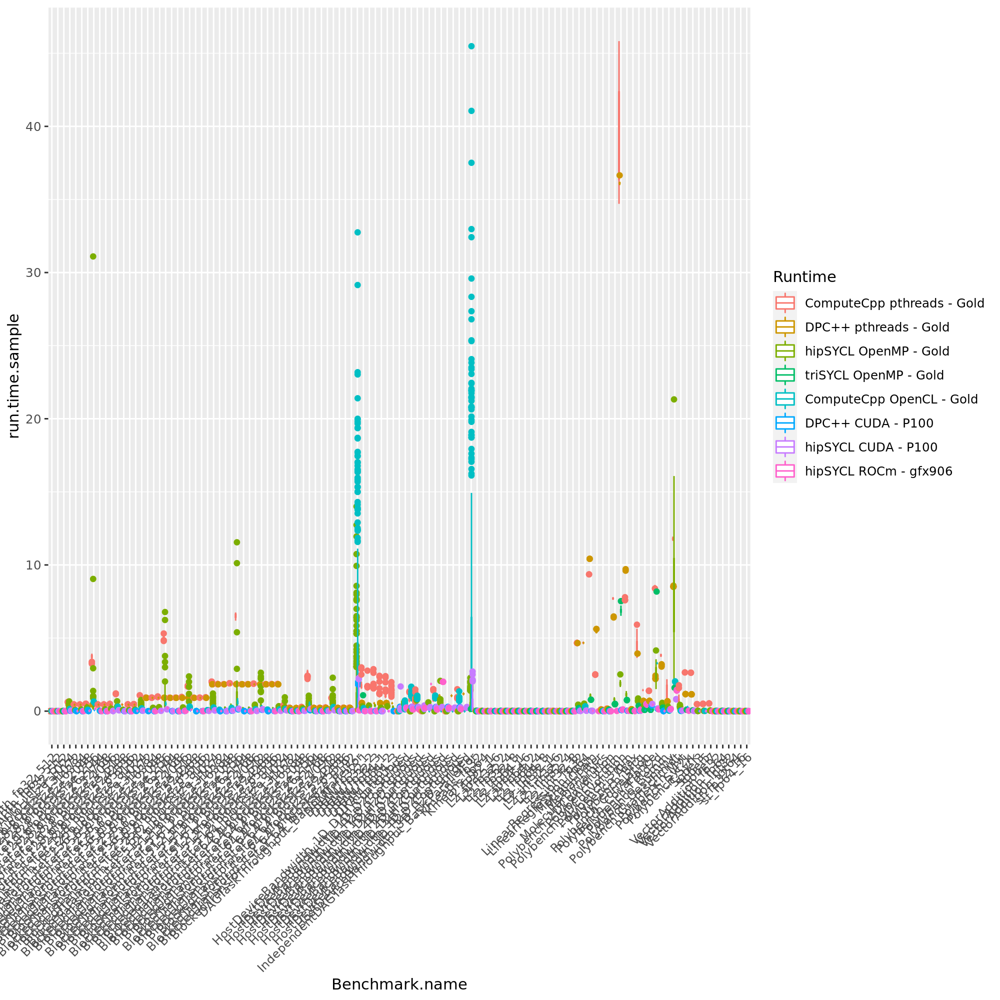

In [158]:
%%R -i indat -i colour_scale -w 10 -h 10 --units in -r 200

library('ggplot2')
library('cowplot')
names(indat) <- make.names(names(indat), unique = FALSE, allow_ = TRUE)

p1 <- ggplot(indat, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + expand_limits(y = 0) + geom_boxplot() + colour_scale

p1


Still too busy... let's break it down to data-type each benchmark operates on.

In [159]:
#subset just kernels with a verified passing result.
bkp = bkp[bkp['Verification'] == "PASS"]

bkp['Benchmark name'].unique()

array(['HostDeviceBandwidth_1D_H2D_Contiguous',
       'HostDeviceBandwidth_2D_H2D_Contiguous',
       'HostDeviceBandwidth_3D_H2D_Contiguous',
       'HostDeviceBandwidth_1D_D2H_Contiguous',
       'HostDeviceBandwidth_3D_D2H_Contiguous',
       'HostDeviceBandwidth_1D_H2D_Strided',
       'BlockedTransform_iter_64_blocksize_256',
       'BlockedTransform_iter_128_blocksize_256',
       'BlockedTransform_iter_256_blocksize_256',
       'BlockedTransform_iter_512_blocksize_256',
       'BlockedTransform_iter_64_blocksize_512',
       'BlockedTransform_iter_128_blocksize_512',
       'BlockedTransform_iter_256_blocksize_512',
       'BlockedTransform_iter_512_blocksize_512',
       'BlockedTransform_iter_64_blocksize_1024',
       'BlockedTransform_iter_128_blocksize_1024',
       'BlockedTransform_iter_256_blocksize_1024',
       'BlockedTransform_iter_512_blocksize_1024',
       'BlockedTransform_iter_64_blocksize_2048',
       'BlockedTransform_iter_128_blocksize_2048',
       'Block

### BKP Divided by Data-Type

#### Float

In [211]:
#subset just kernels with a verified passing result.
bkp = bkp[bkp['Verification'] == "PASS"]

#we could divide this data-set either by the number of invocations used in application or by the data-type worked with -- we choose the latter.
bkp_fp32 = bkp[bkp['Benchmark name'].str.contains("fp32")]
bkp_fp64 = bkp[bkp['Benchmark name'].str.contains("fp64")]
bkp_int32 = bkp[bkp['Benchmark name'].str.contains("int32")]
bkp_int64 = bkp[bkp['Benchmark name'].str.contains("int64")]

indat = bkp_fp32

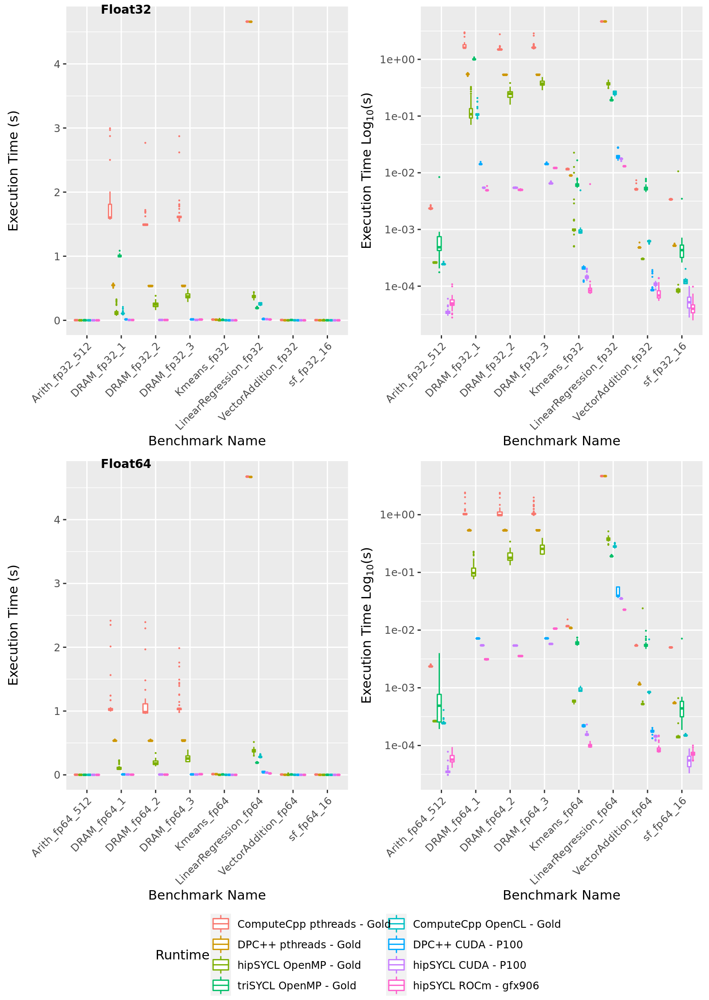

In [212]:
%%R -i bkp_fp32 -i bkp_fp64 -i colour_scale -w 8.3 -h 11.7 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(bkp_fp32) <- make.names(names(bkp_fp32), unique = FALSE, allow_ = TRUE)

p1 <- ggplot(bkp_fp32, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark Name", y="Execution Time (s)") + geom_boxplot(outlier.size = outlier_size) + colour_scale
p2 <- ggplot(bkp_fp32, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark Name", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale

names(bkp_fp64) <- make.names(names(bkp_fp64), unique = FALSE, allow_ = TRUE)

p3 <- ggplot(bkp_fp64, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark Name", y="Execution Time (s)") + geom_boxplot(outlier.size = outlier_size) + colour_scale
p4 <- ggplot(bkp_fp64, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark Name", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale

library('cowplot')
pg <- plot_grid(p1 + theme(legend.position="none"),
                p2 + theme(legend.position="none"),
                p3 + theme(legend.position="none"),
                p4 + theme(legend.position="none"),
                labels = c('Float32', '','Float64',''), label_size = 10, align = 'vh', hjust = -2, nrow = 2)

#side legend
#legend <- get_legend(p1 + theme(legend.box.margin = margin(0, 0, 0, 0)))
#plot_grid(pg, legend, rel_widths = c(3, .85))

#bottom legend
legend <- get_legend(p1 + guides(color = guide_legend(nrow = 4)) + theme(legend.position = "bottom"))
plot_grid(pg, legend, rel_heights = c(1, .1),nrow=2)


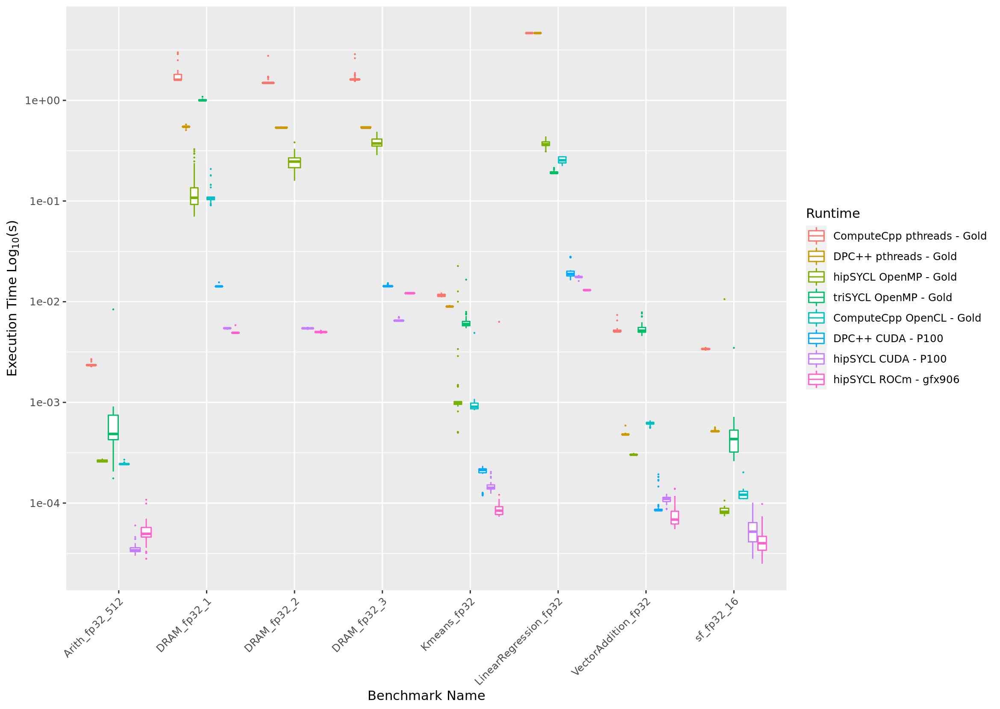

In [215]:
%%R -i bkp_fp32 -i colour_scale -w 11.7 -h 8.3 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(bkp_fp32) <- make.names(names(bkp_fp32), unique = FALSE, allow_ = TRUE)
p1 <- ggplot(bkp_fp32, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark Name", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale
ggsave('bkp-float.pdf', p1, device="pdf",width=11.7, height=8.3, units="in",dpi=320)
print(p1)

#### Int

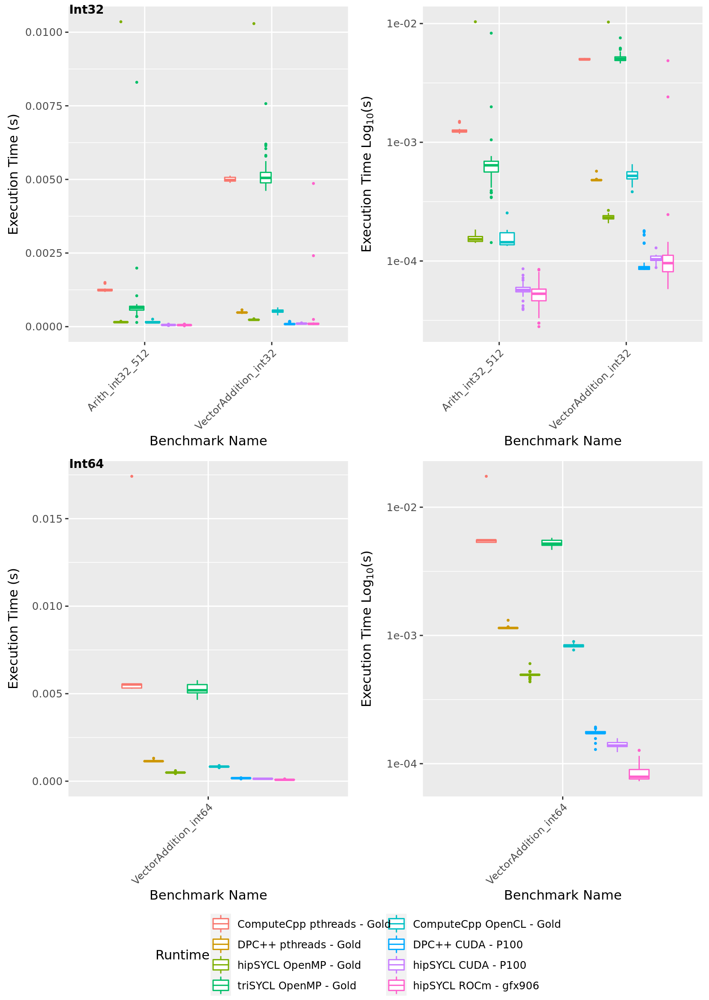

In [178]:
%%R -i bkp_int32 -i bkp_int64 -i colour_scale -w 8.3 -h 11.7 --units in -r 200

outlier_size = 0.50

library('ggplot2')
library('latex2exp')

names(bkp_int32) <- make.names(names(bkp_int32), unique = FALSE, allow_ = TRUE)

p5 <- ggplot(bkp_int32, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark Name", y="Execution Time (s)") + geom_boxplot(outlier.size = outlier_size) + colour_scale
p6 <- ggplot(bkp_int32, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark Name", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale

names(bkp_int64) <- make.names(names(bkp_int64), unique = FALSE, allow_ = TRUE)

p7 <- ggplot(bkp_int64, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark Name", y="Execution Time (s)") + geom_boxplot(outlier.size = outlier_size)  + colour_scale
p8 <- ggplot(bkp_int64, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark Name", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale



library('cowplot')
pg <- plot_grid(p5 + theme(legend.position="none"),
                p6 + theme(legend.position="none"),
                p7 + theme(legend.position="none"),
                p8 + theme(legend.position="none"),
                labels = c('Int32','','Int64',''), label_size = 10, align = 'vh', hjust = -2, nrow = 2)

#side legend
#legend <- get_legend(p1 + theme(legend.box.margin = margin(0, 0, 0, 0)))
#plot_grid(pg, legend, rel_widths = c(3, .85))

#bottom legend
legend <- get_legend(p5 + guides(color = guide_legend(nrow = 4)) + theme(legend.position = "bottom"))
plot_grid(pg, legend, rel_heights = c(1, .1),nrow=2)


## Other BKP Kernels without data-types

In [187]:
#subset just kernels with a verified passing result.
bkp = bkp[bkp['Verification'] == "PASS"]

bkp_block = bkp[bkp['Benchmark name'].str.contains("BlockedTransform_iter_")]
bkp_bandw = bkp[bkp['Benchmark name'].str.contains("HostDeviceBandwidth_")]

#we could divide this data-set either by the number of invocations used in application or by the data-type worked with -- we choose the latter.
bkp_other = bkp[~(bkp['Benchmark name'].str.contains("fp32") | bkp['Benchmark name'].str.contains("fp64") | bkp['Benchmark name'].str.contains("int32") | bkp['Benchmark name'].str.contains("int64") | bkp['Benchmark name'].str.contains("BlockedTransform_iter_") | bkp['Benchmark name'].str.contains("HostDeviceBandwidth_"))]

In [180]:
#discard all but the largest problem size for DagTaskThroughput kernels
bkp_other = bkp_other[ (~ bkp_other['Benchmark name'].str.contains('DAGTaskThroughput')) | (bkp_other['Benchmark name'].str.contains('DAGTaskThroughput') & (bkp_other['problem-size'] == 65536))]

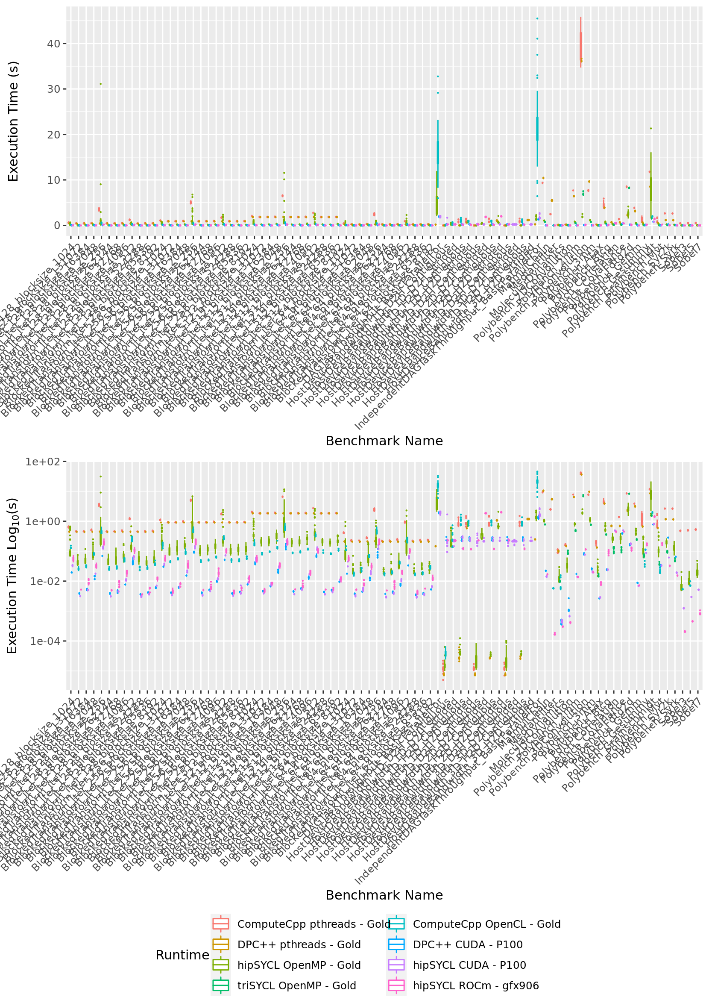

In [181]:
%%R -i bkp_other -i colour_scale -w 8.3 -h 11.7 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(bkp_other) <- make.names(names(bkp_other), unique = FALSE, allow_ = TRUE)

p1 <- ggplot(bkp_other, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark Name", y="Execution Time (s)") + geom_boxplot(outlier.size = outlier_size)  + colour_scale
p2 <- ggplot(bkp_other, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark Name", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size)  + colour_scale

library('cowplot')
pg <- plot_grid(p1 + theme(legend.position="none"),
                p2 + theme(legend.position="none"),
                align = 'vh', hjust = -2, nrow = 2)

#bottom legend
legend <- get_legend(p1 + guides(color = guide_legend(nrow = 4)) + theme(legend.position = "bottom"))
plot_grid(pg, legend, rel_heights = c(1, .1),nrow=2)


This is still too noisy to readily compare, so let's separate the results by each device thereby we can directly compare the SYCL runtimes (implementation paired with backend) on the same hardware.

In [184]:
bkp_other_gpu = bkp_other[bkp_other['Runtime'].str.contains("P100") | bkp_other['Runtime'].str.contains("gfx906")]
bkp_other_cpu = bkp_other[bkp_other['Runtime'].str.contains("Gold")]

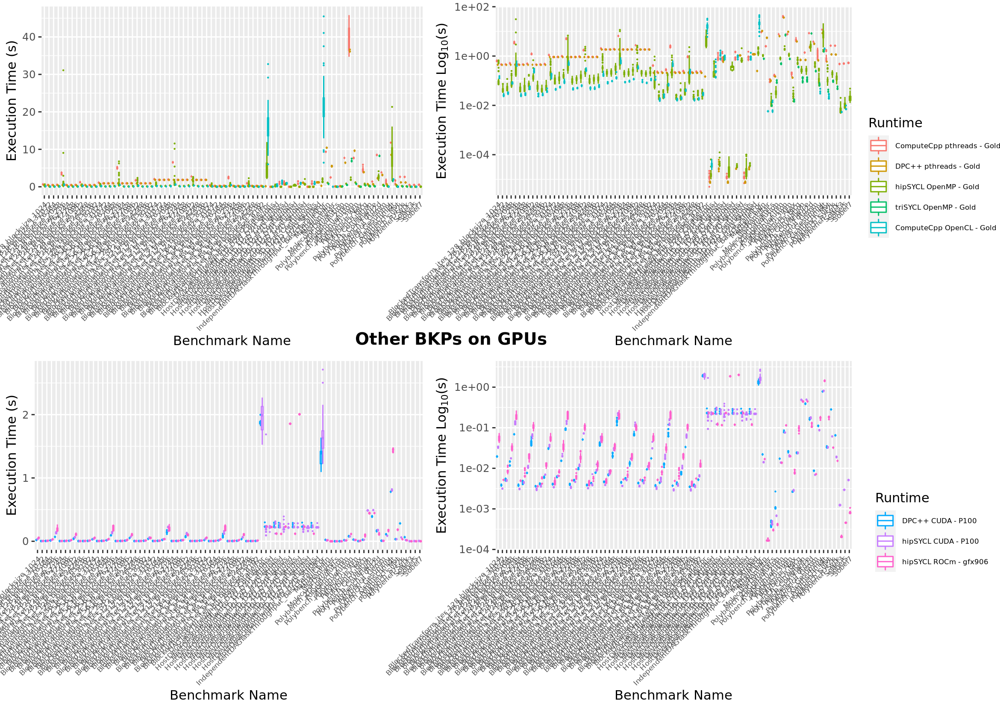

In [185]:
%%R -i bkp_other_gpu -i colour_scale -i bkp_other_cpu -w 11.7 -h 8.3 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(bkp_other_cpu) <- make.names(names(bkp_other_cpu), unique = FALSE, allow_ = TRUE)

p1 <- ggplot(bkp_other_cpu, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6), legend.text = element_text(size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark Name", y="Execution Time (s)") + geom_boxplot(outlier.size = outlier_size) + colour_scale
p2 <- ggplot(bkp_other_cpu, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6), legend.text = element_text(size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark Name", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale

names(bkp_other_gpu) <- make.names(names(bkp_other_gpu), unique = FALSE, allow_ = TRUE)

p3 <- ggplot(bkp_other_gpu, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6), legend.text = element_text(size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark Name", y="Execution Time (s)") + geom_boxplot(outlier.size = outlier_size) + colour_scale
p4 <- ggplot(bkp_other_gpu, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6), legend.text = element_text(size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark Name", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale

library('cowplot')
pg <- plot_grid(p1 + theme(legend.position="none"),
                p2 + theme(legend.position="none"),
                get_legend(p1 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right")),
                p3 + theme(legend.position="none"),
                p4 + theme(legend.position="none"),
                get_legend(p3 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right")),
                labels = c("Other BKP on CPUs","","","Other BKPs on GPUs","",""),
                align = 'hv', hjust = -1.85, vjust = -.8, nrow = 2,
                rel_widths = c(1,1,.33))

pg

### BKP -- Blocked Transform

From the source-code (`runtime/blocked_transform.cpp:39-49`): (The blocked transform) performs a blocked transform operation using the mandelbrot sequence as kernels. The number of iterations of the sequence -- and hence the runtime of the kernel can be adjusted using `Num_iterations`.
This benchmark processes the data in chunks that are assigned to independent kernels, therefore this benchmark tests

* Overlapping of compute and data transfers
* concurrent kernel execution
* if the implementation of ranged accessors creates independent accesses if accessed ranges are non-overlapping.

In order for the benchmark to stress these aspects, `Num_iterations` should be tuned such that the kernel runtime is similar to the data transfer time of one block.


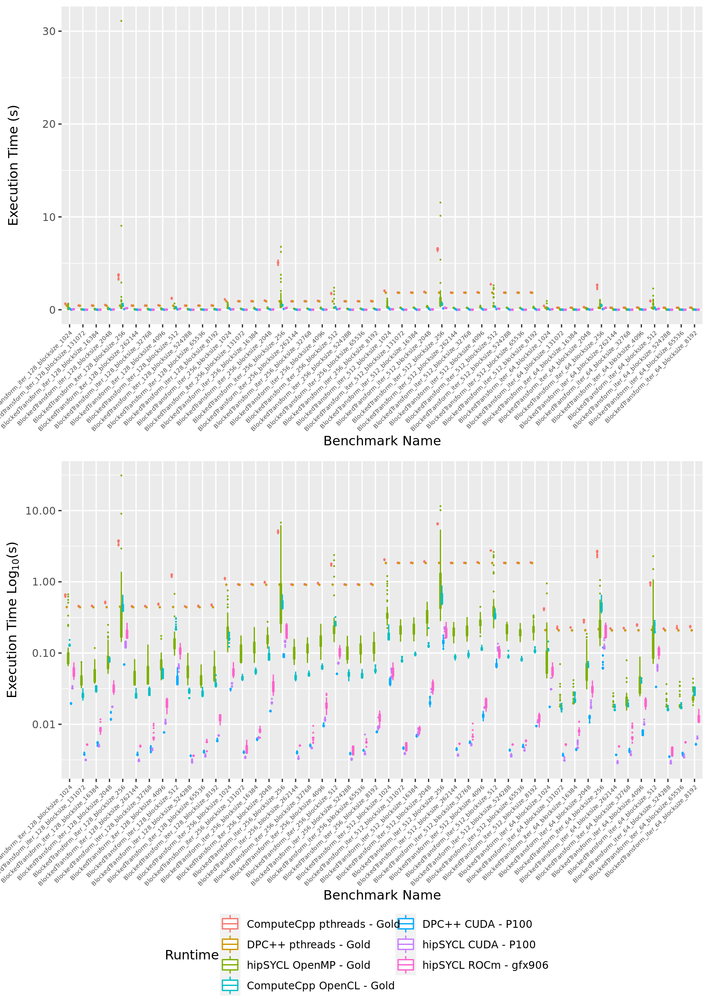

In [188]:
%%R -i bkp_block -i colour_scale -w 8.3 -h 11.7 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(bkp_block) <- make.names(names(bkp_block), unique = FALSE, allow_ = TRUE)

p1 <- ggplot(bkp_block, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 5)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark Name", y="Execution Time (s)") + geom_boxplot(outlier.size = outlier_size) + colour_scale
p2 <- ggplot(bkp_block, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 5)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark Name", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale

library('cowplot')
pg <- plot_grid(p1 + theme(legend.position="none"),
                p2 + theme(legend.position="none"),
                align = 'vh', hjust = -2, nrow = 2)

#bottom legend
legend <- get_legend(p1 + guides(color = guide_legend(nrow = 4)) + theme(legend.position = "bottom"))
plot_grid(pg, legend, rel_heights = c(1, .1),nrow=2)


Sorted by iteration and block-size -- and shorten the name

In [189]:
bkp_block['Benchmark name']

bkp_block['iter'] = bkp_block['Benchmark name'].str.extract(r'iter_(\d+)_')
bkp_block['blocksize'] = bkp_block['Benchmark name'].str.extract(r'blocksize_(\d+)')

bkp_block

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


,Benchmark name,Verification,device-name,kernel-time-mean,kernel-time-median,kernel-time-min,kernel-time-samples,kernel-time-stddev,kernel-time-throughput,local-size,...,run-time-median,run-time-min,run-time-sample,run-time-stddev,run-time-throughput,sycl-implementation,throughput-metric,Runtime,iter,blocksize
304,BlockedTransform_iter_64_blocksize_256,PASS,Tesla P100-PCIE-12GB,NaN,NaN,NaN,NaN,NaN,NaN,256.0,...,0.061605,0.058476,0.058476,0.012554,NaN,LLVM CUDA (Codeplay),NaN,DPC++ CUDA - P100,64,256
305,BlockedTransform_iter_64_blocksize_256,PASS,Tesla P100-PCIE-12GB,NaN,NaN,NaN,NaN,NaN,NaN,256.0,...,0.061605,0.058476,0.058760,0.012554,NaN,LLVM CUDA (Codeplay),NaN,DPC++ CUDA - P100,64,256
306,BlockedTransform_iter_64_blocksize_256,PASS,Tesla P100-PCIE-12GB,NaN,NaN,NaN,NaN,NaN,NaN,256.0,...,0.061605,0.058476,0.058920,0.012554,NaN,LLVM CUDA (Codeplay),NaN,DPC++ CUDA - P100,64,256
307,BlockedTransform_iter_64_blocksize_256,PASS,Tesla P100-PCIE-12GB,NaN,NaN,NaN,NaN,NaN,NaN,256.0,...,0.061605,0.058476,0.059056,0.012554,NaN,LLVM CUDA (Codeplay),NaN,DPC++ CUDA - P100,64,256
308,BlockedTransform_iter_64_blocksize_256,PASS,Tesla P100-PCIE-12GB,NaN,NaN,NaN,NaN,NaN,NaN,256.0,...,0.061605,0.058476,0.059061,0.012554,NaN,LLVM CUDA (Codeplay),NaN,DPC++ CUDA - P100,64,256
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53955,BlockedTransform_iter_512_blocksize_524288,PASS,hipCPU OpenMP host device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,...,0.205413,0.146830,0.260136,0.035568,NaN,hipSYCL,NaN,hipSYCL OpenMP - Gold,512,524288
53956,BlockedTransform_iter_512_blocksize_524288,PASS,hipCPU OpenMP host device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,...,0.205413,0.146830,0.263489,0.035568,NaN,hipSYCL,NaN,hipSYCL OpenMP - Gold,512,524288
53957,BlockedTransform_iter_512_blocksize_524288,PASS,hipCPU OpenMP host device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,...,0.205413,0.146830,0.269154,0.035568,NaN,hipSYCL,NaN,hipSYCL OpenMP - Gold,512,524288
53958,BlockedTransform_iter_512_blocksize_524288,PASS,hipCPU OpenMP host device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,...,0.205413,0.146830,0.270207,0.035568,NaN,hipSYCL,NaN,hipSYCL OpenMP - Gold,512,524288


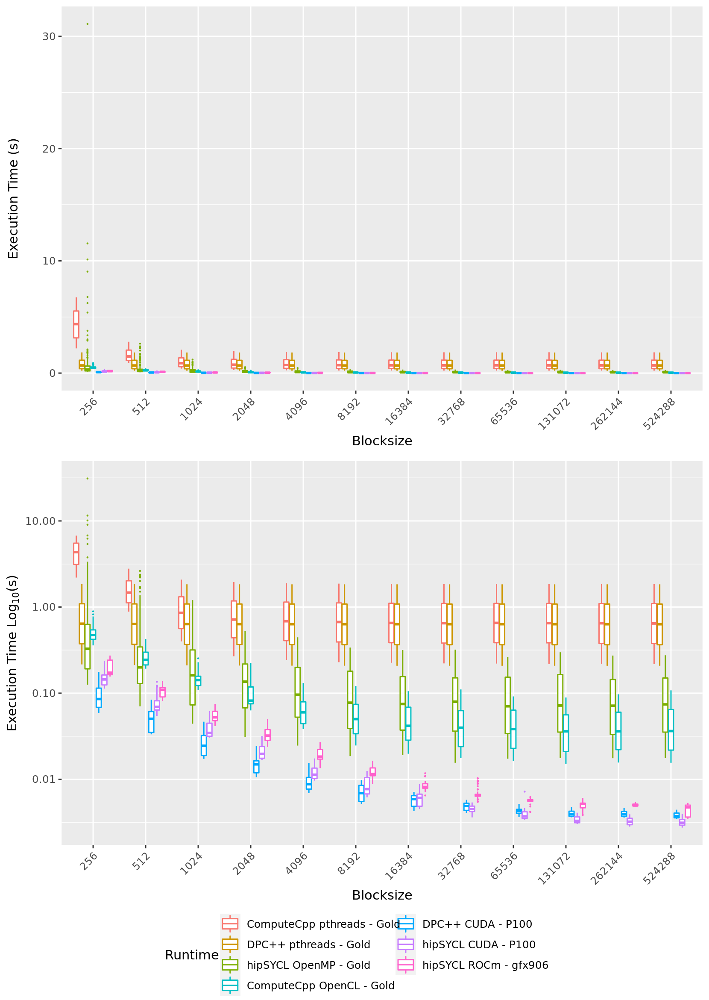

In [190]:
%%R -i bkp_block -i colour_scale -w 8.3 -h 11.7 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(bkp_block) <- make.names(names(bkp_block), unique = FALSE, allow_ = TRUE)
bkp_block$blocksize <- reorder(bkp_block$blocksize, as.numeric(bkp_block$blocksize))


p1 <- ggplot(bkp_block, aes(x=blocksize, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Blocksize", y="Execution Time (s)") + geom_boxplot(outlier.size = outlier_size) + colour_scale
p2 <- ggplot(bkp_block, aes(x=blocksize, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Blocksize", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale

library('cowplot')
pg <- plot_grid(p1 + theme(legend.position="none"),
                p2 + theme(legend.position="none"),
                align = 'vh', hjust = -2, nrow = 2)

#bottom legend
legend <- get_legend(p1 + guides(color = guide_legend(nrow = 4)) + theme(legend.position = "bottom"))
plot_grid(pg, legend, rel_heights = c(1, .1),nrow=2)


It appears GPU devices perform better over larger blocksizes whereas CPU devices are more affected by increasing the blocksize.

The use of the common CPU backend limits the performance on the Xeon Gold --shown in both the ComputeCpp/CPU and DPC++/CPU runtimes-- which were equally ~an order of magnitude worse than the OpenMP and OpenCL backends.
OpenCL had the best performance of any of the backends on the Xeon Gold device -- shown in the ComputeCpp/OpenCL runtime.
The hipSYCL/OpenMP has the most variance was the 2nd best performer over all blocksizes.

On the Tesla P100 the CUDA backend performs well in general, as the blocksize increases the hipSYCL implementation slightly wins out over DPC++.
The Vega performs worse out the GPUs on this benchmark, however, the performance gap between the common hipSYCL implementation stays the same as the block-sizes increase -- so we can credit this to comparing unequal hardware (with different specifications).

We now also perform a breakdown to examine whether the other variable `iter` affects the difference in performance on blocksize.

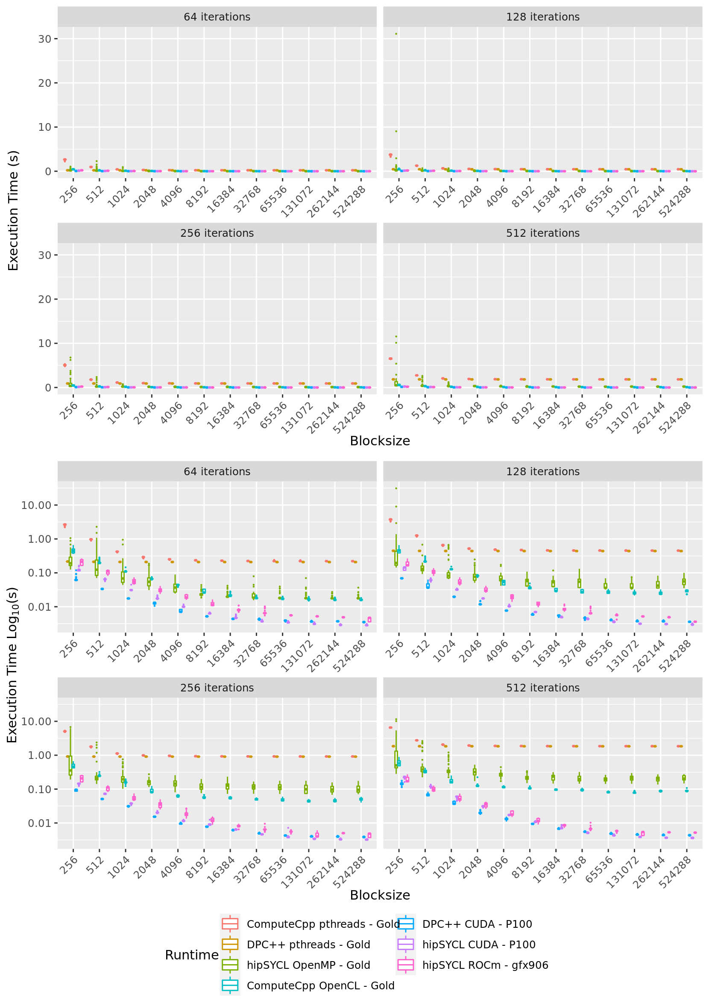

In [191]:
%%R -i bkp_block -i colour_scale -w 8.3 -h 11.7 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(bkp_block) <- make.names(names(bkp_block), unique = FALSE, allow_ = TRUE)
bkp_block$blocksize <- reorder(bkp_block$blocksize, as.numeric(bkp_block$blocksize))
bkp_block$iter <- reorder(bkp_block$iter, as.numeric(bkp_block$iter))
#rename for plotting
levels(bkp_block$iter) <- paste(levels(bkp_block$iter),"iterations")

p1 <- ggplot(bkp_block, aes(x=blocksize, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Blocksize", y="Execution Time (s)") + geom_boxplot(outlier.size = outlier_size) + facet_wrap( ~ iter, strip.position = "top", scales = "free_x") + colour_scale
p2 <- ggplot(bkp_block, aes(x=blocksize, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Blocksize", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + facet_wrap( ~ iter, strip.position = "top", scales = "free_x") + colour_scale

library('cowplot')
pg <- plot_grid(p1 + theme(legend.position="none"),
                p2 + theme(legend.position="none"),
                align = 'vh', hjust = -2, nrow = 2)

#bottom legend
legend <- get_legend(p1 + guides(color = guide_legend(nrow = 4)) + theme(legend.position = "bottom"))
plot_grid(pg, legend, rel_heights = c(1, .1),nrow=2)


As expected by increasing the number of iterations of each test that is run, the execution time also increases. This has the largest impact on the CPU backends because these were the worst performing devices -- thus the penalty they incur is highlighted by increasing the amount of work required in each test.

By breaking this down into their respective iterations we can remove a large amount of variance from the previous plot -- this is shown by the much smaller range of the upper and lower quartiles in the box-plots. We also see less variance with the increased sample size.

As such we select the maximum number of iterations to present in our final results.

In [192]:
bkp_block512 = bkp_block[bkp_block['Benchmark name'].str.contains("iter_512")]

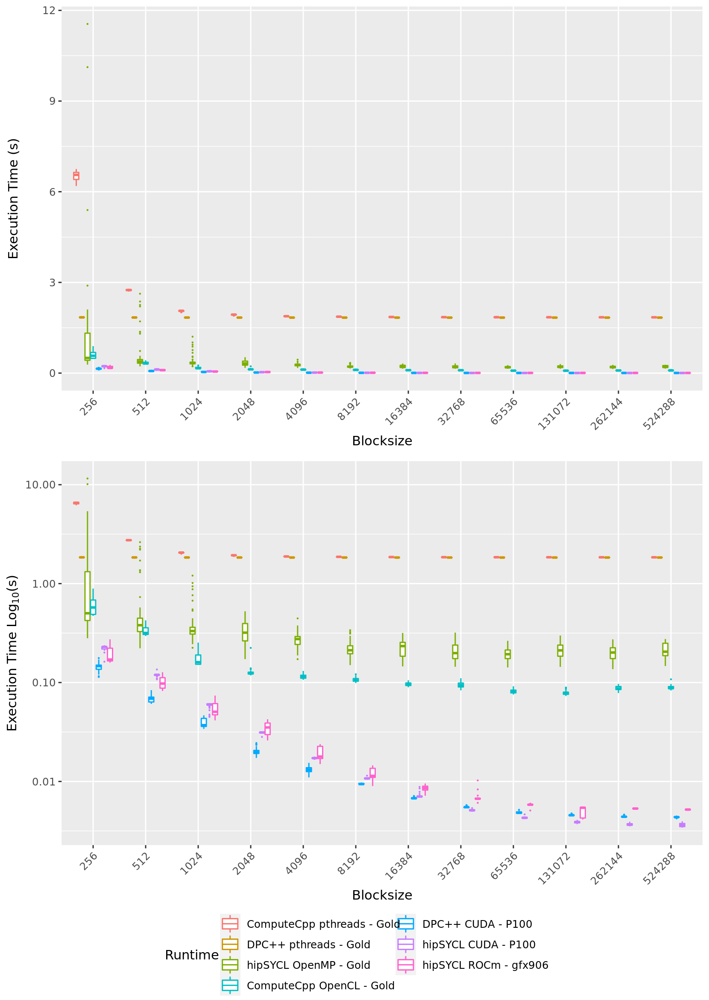

In [193]:
%%R -i bkp_block512 -i colour_scale -w 8.3 -h 11.7 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(bkp_block512) <- make.names(names(bkp_block512), unique = FALSE, allow_ = TRUE)
bkp_block512$blocksize <- reorder(bkp_block512$blocksize, as.numeric(bkp_block512$blocksize))


p1 <- ggplot(bkp_block512, aes(x=blocksize, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Blocksize", y="Execution Time (s)") + geom_boxplot(outlier.size = outlier_size) + colour_scale
p2 <- ggplot(bkp_block512, aes(x=blocksize, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Blocksize", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale

library('cowplot')
pg <- plot_grid(p1 + theme(legend.position="none"),
                p2 + theme(legend.position="none"),
                align = 'vh', hjust = -2, nrow = 2)

#bottom legend
legend <- get_legend(p1 + guides(color = guide_legend(nrow = 4)) + theme(legend.position = "bottom"))
pgw <- plot_grid(pg, legend, rel_heights = c(1, .1),nrow=2)
print(pgw)

ggsave('figs/bkp_block512.pdf',pgw, width = 8.3, height = 11.7, dpi = 300, units = "in")

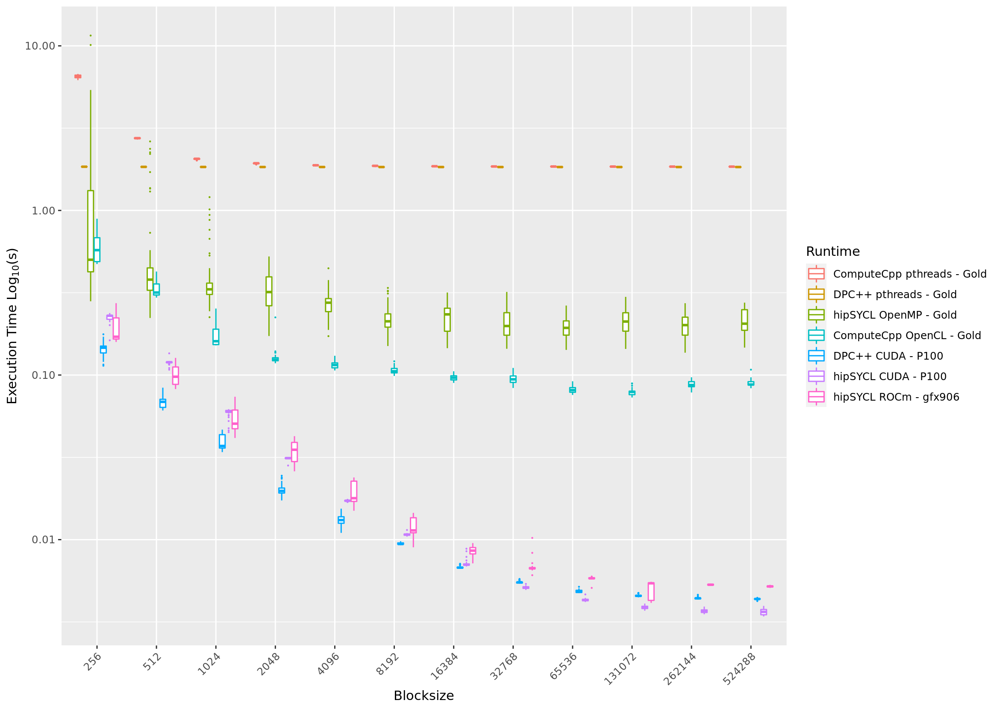

In [217]:
%%R -i bkp_block512 -i colour_scale -w 11.7 -h 8.3 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(bkp_block512) <- make.names(names(bkp_block512), unique = FALSE, allow_ = TRUE)
bkp_block512$blocksize <- reorder(bkp_block512$blocksize, as.numeric(bkp_block512$blocksize))

p1 <- ggplot(bkp_block512, aes(x=blocksize, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Blocksize", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale
ggsave('blocked-transform.pdf', p1, device="pdf",width=11.7, height=8.3, units="in",dpi=320)
print(p1)

This figure presents the performance of the Blocksize test on two GPU devices --the Nvidia Tesla P100 and AMD Vega 20-- and the Xeon Gold CPU.
The test measures concurrent kernel execution and overlapping of compute and data transfers.
The number of iterations was selected to be 512.
The blocksize increases over the x-axis.
It appears GPU devices perform better over larger blocksizes whereas CPU devices are more affected by increasing the blocksize.

The use of the common CPU backend limits the performance on the Xeon Gold --shown in both the ComputeCpp/CPU and DPC++/CPU runtimes-- which were equally ~an order of magnitude worse than the OpenMP and OpenCL backends.
OpenCL had the best performance of any of the backends on the Xeon Gold device -- shown in the ComputeCpp/OpenCL runtime.
The hipSYCL/OpenMP has the most variance was the 2nd best performer over all blocksizes.

On the Tesla P100 the CUDA backend performs well in general, as the blocksize increases the hipSYCL implementation slightly wins out over DPC++.
The Vega performs worse out the GPUs on this benchmark, however, the performance gap between the common hipSYCL implementation stays the same as the block-sizes increase, and stays in the same order of magnitude -- so we can credit this to comparing unequal hardware (with different specifications of the P100 and the Vega 20).

**TODO:** investigate block performance difference between CPU (pthreads?) vs Other backends Too heavyweight to be suited to this SYCL test?.

### BKP -- Bandwidth

From the source-code (`micro/host_device_bandwidth.cpp:53-64`):

Microbenchmark measuring host<->device bandwidth for contiguous and strided copies.
For non-strided copies we use a dummy kernel, as explicit copy operations are not fully supported by some SYCL implementations.
Strided copies use a larger SYCL buffer and copy a portion out of the middle.
For example, a (512, 512) element 2D-copy at offset (1, 1) out of a (514, 514)
element SYCL buffer. The host buffer is never strided (as this is not supported by SYCL 1.2.1).

To avoid SYCL implementations to just copy the entire buffer when using a strided accessor we use explicit copy operations for strided copies.


In [194]:
#shorten kernel names
bkp_bandw = bkp[bkp['Benchmark name'].str.contains("HostDeviceBandwidth_")]

bkp_bandw['Benchmark name'] = bkp_bandw['Benchmark name'].str.replace('HostDeviceBandwidth_','')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


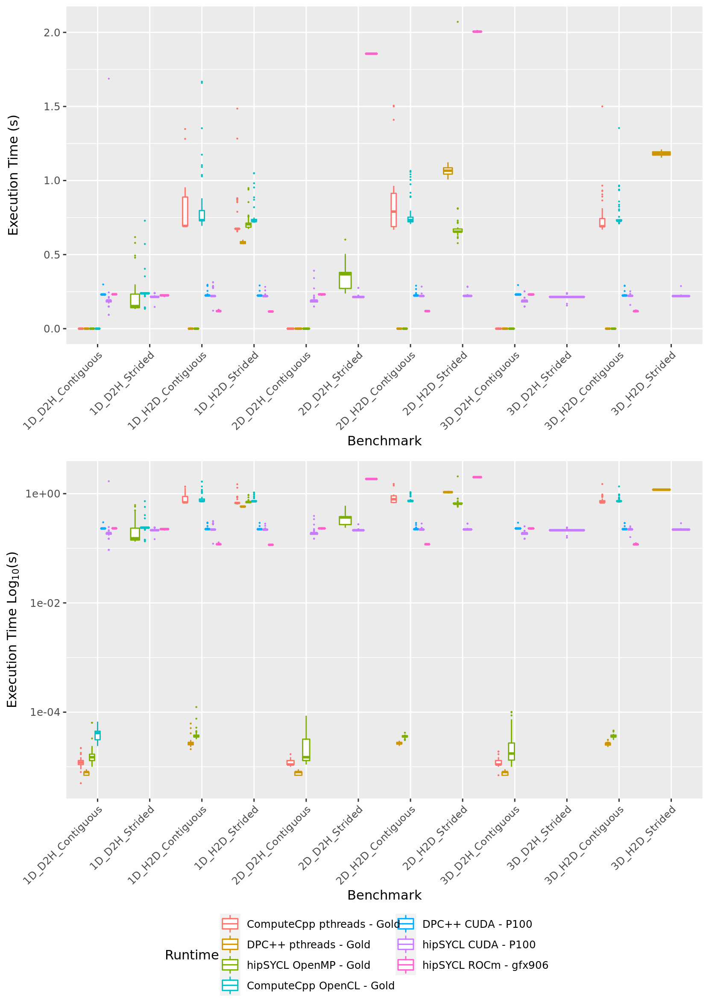

In [206]:
%%R -i bkp_bandw -i colour_scale -w 8.3 -h 11.7 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(bkp_bandw) <- make.names(names(bkp_bandw), unique = FALSE, allow_ = TRUE)
#bkp_bandw$Benchmark.name <- reorder(bkp_bandw$Benchmark.name, as.numeric(bkp_bandw$blocksize))


p1 <- ggplot(bkp_bandw, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y="Execution Time (s)") + geom_boxplot(outlier.size = outlier_size) + colour_scale
p2 <- ggplot(bkp_bandw, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale

library('cowplot')
pg <- plot_grid(p1 + theme(legend.position="none"),
                p2 + theme(legend.position="none"),
                align = 'vh', hjust = -2, nrow = 2)

#bottom legend
legend <- get_legend(p1 + guides(color = guide_legend(nrow = 4)) + theme(legend.position = "bottom"))
plot_grid(pg, legend, rel_heights = c(1, .1),nrow=2)


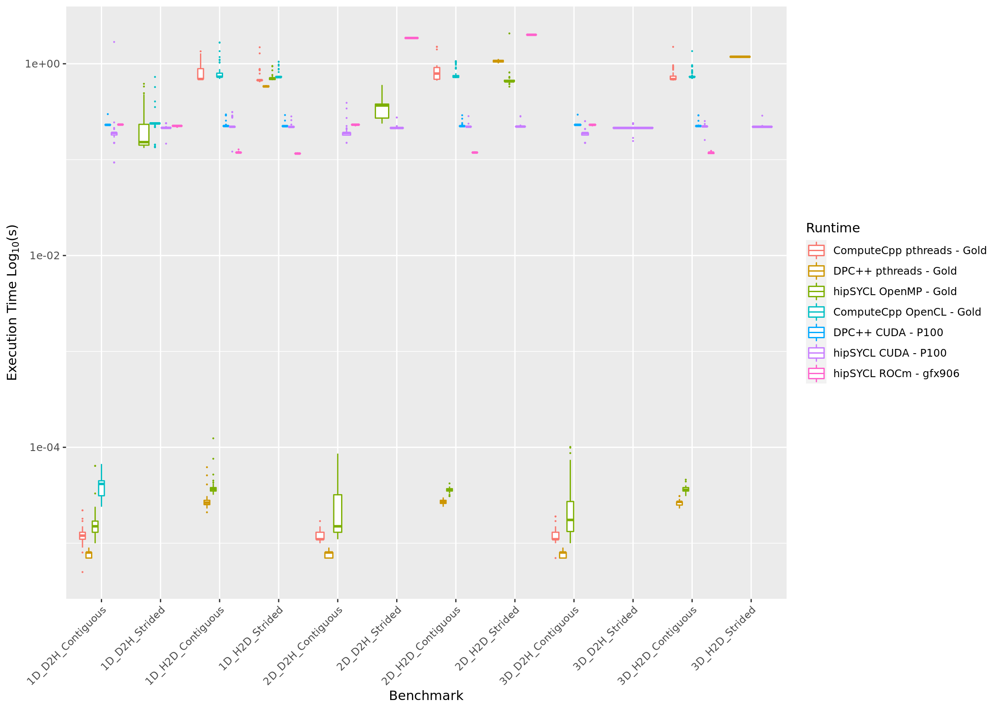

In [219]:
%%R -i bkp_bandw -i colour_scale -w 11.7 -h 8.3 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(bkp_bandw) <- make.names(names(bkp_bandw), unique = FALSE, allow_ = TRUE)

p1 <- ggplot(bkp_bandw, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale
ggsave('bandwidth.pdf', p1, device="pdf",width=11.7, height=8.3, units="in",dpi=320)
print(p1)

It appears that communication takes 4 orders of magnitude longer on the GPU than the CPU -- this is unsurprising since it should only be a SYCL API call on the CPU host to transfer to the CPU device whereas the GPU has to go over PCI-E.
Let's split the data by device.

In [196]:
bkp_bandw_gpu = bkp_bandw[bkp_bandw['Runtime'].str.contains("P100") | bkp_bandw['Runtime'].str.contains("gfx906")]
bkp_bandw_cpu = bkp_bandw[bkp_bandw['Runtime'].str.contains("Gold")]

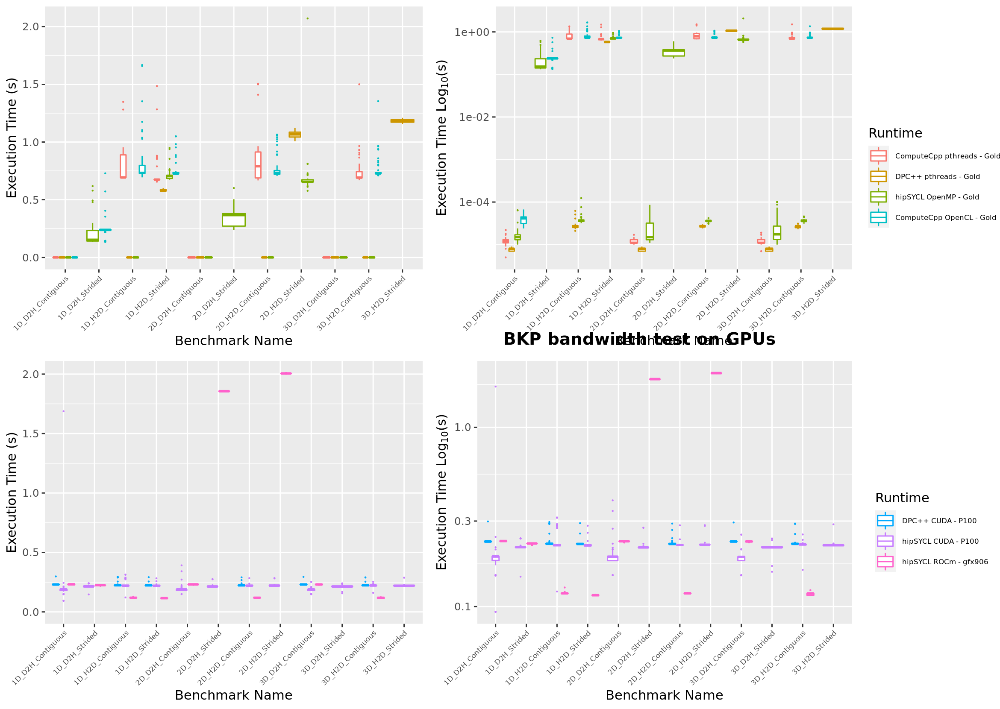

In [197]:
%%R -i bkp_bandw_gpu -i bkp_bandw_cpu -i colour_scale -w 11.7 -h 8.3 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(bkp_bandw_cpu) <- make.names(names(bkp_bandw_cpu), unique = FALSE, allow_ = TRUE)

p1 <- ggplot(bkp_bandw_cpu, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6), legend.text = element_text(size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark Name", y="Execution Time (s)") + geom_boxplot(outlier.size = outlier_size) + colour_scale
p2 <- ggplot(bkp_bandw_cpu, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6), legend.text = element_text(size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark Name", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale

names(bkp_bandw_gpu) <- make.names(names(bkp_bandw_gpu), unique = FALSE, allow_ = TRUE)

p3 <- ggplot(bkp_bandw_gpu, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6), legend.text = element_text(size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark Name", y="Execution Time (s)") + geom_boxplot(outlier.size = outlier_size) + colour_scale
p4 <- ggplot(bkp_bandw_gpu, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6), legend.text = element_text(size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark Name", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale

library('cowplot')
pg <- plot_grid(p1 + theme(legend.position="none"),
                p2 + theme(legend.position="none"),
                get_legend(p1 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right")),
                p3 + theme(legend.position="none"),
                p4 + theme(legend.position="none"),
                get_legend(p3 + guides(color = guide_legend(ncol = 1)) + theme(legend.position = "right")),
                labels = c("BKP bandwidth test on CPUs","","","BKP bandwidth test on GPUs","",""),
                align = 'hv', hjust = -1.85, vjust = -.8, nrow = 2,
                rel_widths = c(1,1,.33))

pg

A direct comparison on the GPU architectures can be made based on suitability of SYCL implementations. For instance,

When we consider

**TODO:** Summary.

# WGP -- Work-Group Data-Parallel Kernels

In [242]:
wgp = chompLeadingSYCLBenchExperimentType(wgp)

#subset just kernels with a verified passing result.
wgp = wgp[wgp['Verification'] == "PASS"]
#discard all but the largest problem size for DagTaskThroughput kernels
wgp_sub = wgp[ (~ wgp['Benchmark name'].str.contains('DAGTaskThroughput')) | (wgp['Benchmark name'].str.contains('DAGTaskThroughput') & (wgp['problem-size'] == 65536))]

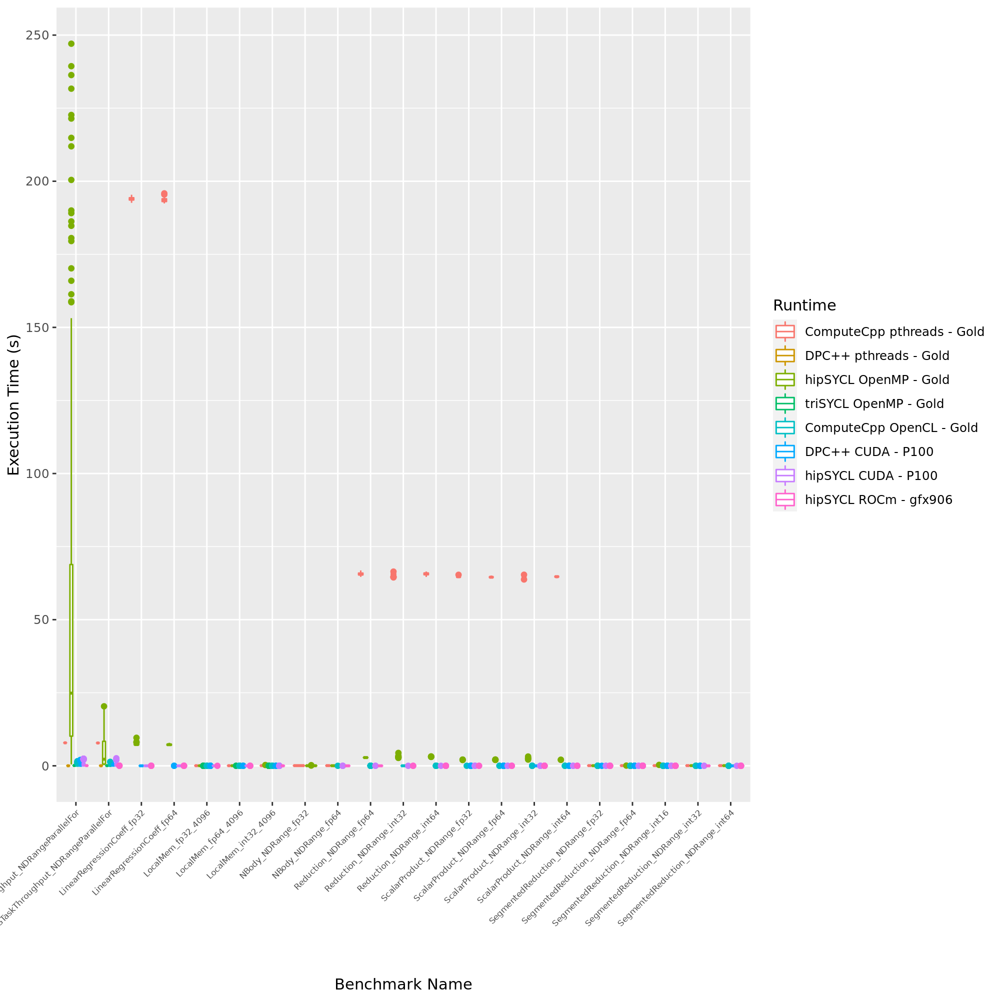

In [243]:
%%R -i wgp -i wgp_sub -i colour_scale -w 10 -h 10 --units in -r 200

library('ggplot2')
library('cowplot')
names(wgp) <- make.names(names(wgp), unique = FALSE, allow_ = TRUE)

p1 <- ggplot(wgp, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark Name", y="Execution Time (s)") + geom_boxplot() + colour_scale

p1


In [244]:
#subset just kernels with a verified passing result.
wgp = wgp[wgp['Verification'] == "PASS"]

wgp['Benchmark name'].unique()

array(['IndependentDAGTaskThroughput_NDRangeParallelFor',
       'LocalMem_int32_4096', 'LocalMem_fp32_4096', 'LocalMem_fp64_4096',
       'SegmentedReduction_NDRange_int16',
       'SegmentedReduction_NDRange_int32',
       'SegmentedReduction_NDRange_int64',
       'SegmentedReduction_NDRange_fp32',
       'SegmentedReduction_NDRange_fp64', 'LinearRegressionCoeff_fp32',
       'LinearRegressionCoeff_fp64', 'ScalarProduct_NDRange_int32',
       'ScalarProduct_NDRange_int64', 'ScalarProduct_NDRange_fp32',
       'ScalarProduct_NDRange_fp64',
       'DAGTaskThroughput_NDRangeParallelFor', 'NBody_NDRange_fp64',
       'Reduction_NDRange_int32', 'Reduction_NDRange_int64',
       'Reduction_NDRange_fp64', 'NBody_NDRange_fp32'], dtype=object)

All datum, except for DAGTask applications, can be presented according to their data-type so this seems like a logical way to break-down and interpret the data.

### WGP Divided by Data-Type

#### Float

In [245]:
#subset just kernels with a verified passing result.
wgp = wgp[wgp['Verification'] == "PASS"]

#we could divide this data-set either by the number of invocations used in application or by the data-type worked with -- we choose the latter.
wgp_fp = wgp[wgp['Benchmark name'].str.contains("_fp")]
wgp_fp['data.type.width'] = wgp_fp['Benchmark name'].str.extract(r'_fp(\d+)')
wgp_fp['Benchmark name'] = wgp_fp['Benchmark name'].str.replace(r'_fp(\d+)','')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


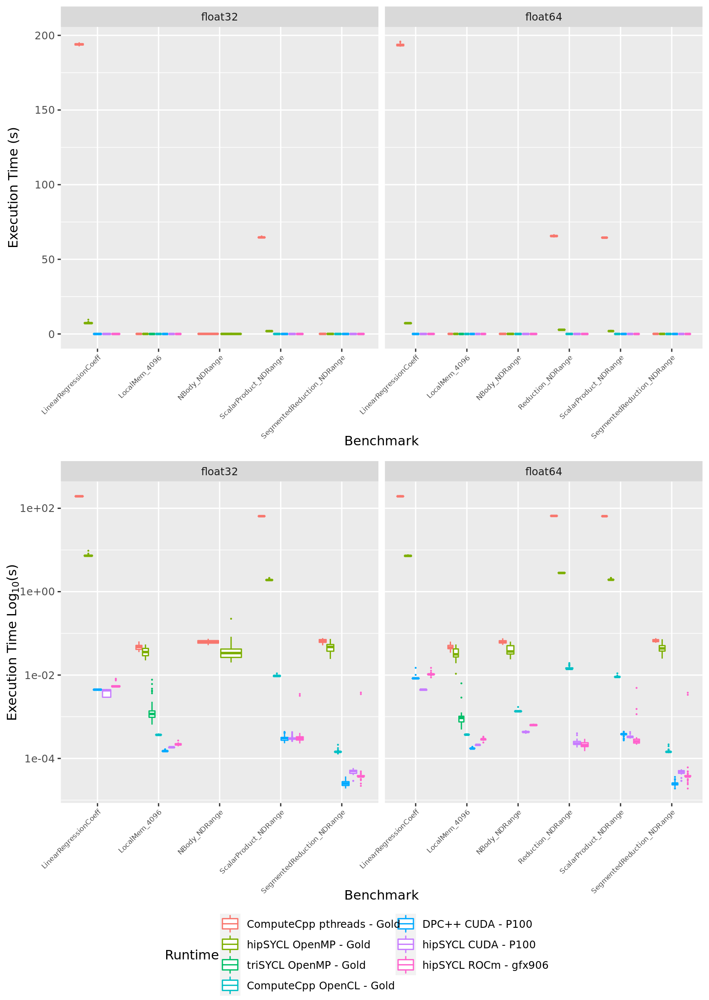

In [246]:
%%R -i wgp_fp -i colour_scale -w 8.3 -h 11.7 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(wgp_fp) <- make.names(names(wgp_fp), unique = FALSE, allow_ = TRUE)
wgp_fp$data.type.width <- reorder(wgp_fp$data.type.width, as.numeric(wgp_fp$data.type.width))
#rename for plotting
levels(wgp_fp$data.type.width) <- paste("float",levels(wgp_fp$data.type.width),sep='')

p1 <- ggplot(wgp_fp, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y="Execution Time (s)") + geom_boxplot(outlier.size = outlier_size) + facet_wrap( ~ data.type.width, strip.position = "top", scales = "free_x") + colour_scale
p2 <- ggplot(wgp_fp, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + facet_wrap( ~ data.type.width, strip.position = "top", scales = "free_x") + colour_scale

library('cowplot')
pg <- plot_grid(p1 + theme(legend.position="none"),
                p2 + theme(legend.position="none"),
                align = 'vh', hjust = -2, nrow = 2)

#bottom legend
legend <- get_legend(p1 + guides(color = guide_legend(nrow = 4)) + theme(legend.position = "bottom"))
plot_grid(pg, legend, rel_heights = c(1, .1),nrow=2)


#### Int

In [247]:
#subset just kernels with a verified passing result.
wgp = wgp[wgp['Verification'] == "PASS"]

#we could divide this data-set either by the number of invocations used in application or by the data-type worked with -- we choose the latter.
wgp_int = wgp[wgp['Benchmark name'].str.contains("_int")]
wgp_int['data.type.width'] = wgp_int['Benchmark name'].str.extract(r'_int(\d+)')
wgp_int['Benchmark name'] = wgp_int['Benchmark name'].str.replace(r'_int(\d+)','')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


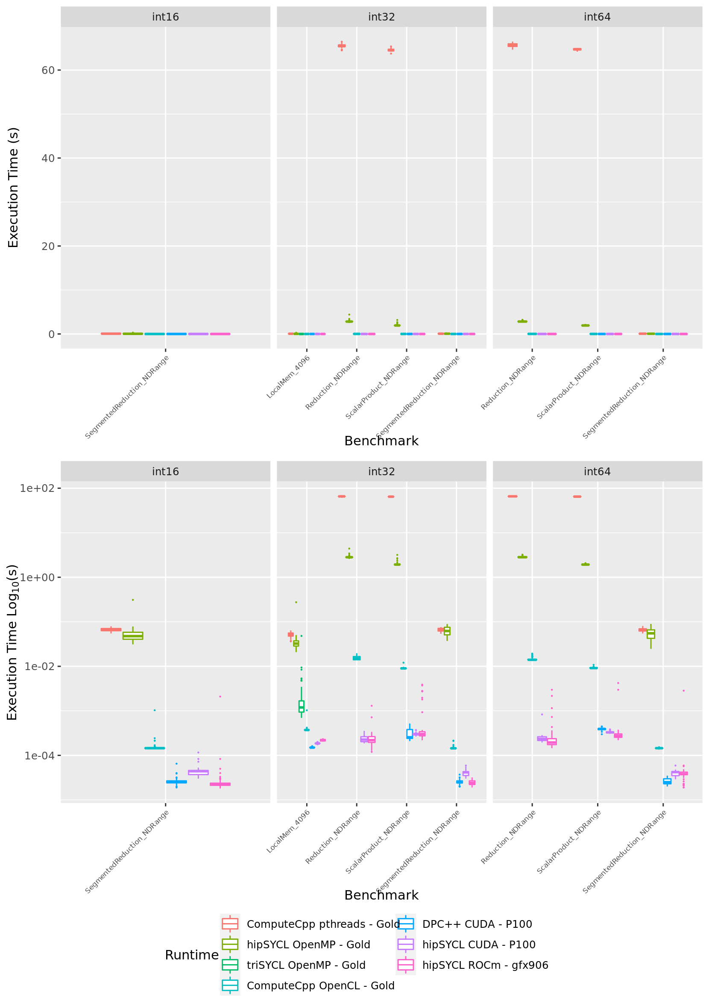

In [248]:
%%R -i wgp_int -i colour_scale -w 8.3 -h 11.7 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(wgp_int) <- make.names(names(wgp_int), unique = FALSE, allow_ = TRUE)
wgp_int$data.type.width <- reorder(wgp_int$data.type.width, as.numeric(wgp_int$data.type.width))
#rename for plotting
levels(wgp_int$data.type.width) <- paste("int",levels(wgp_int$data.type.width),sep='')

p1 <- ggplot(wgp_int, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y="Execution Time (s)") + geom_boxplot(outlier.size = outlier_size) + facet_wrap( ~ data.type.width, strip.position = "top", scales = "free_x") + colour_scale
p2 <- ggplot(wgp_int, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + facet_wrap( ~ data.type.width, strip.position = "top", scales = "free_x") + colour_scale

library('cowplot')
pg <- plot_grid(p1 + theme(legend.position="none"),
                p2 + theme(legend.position="none"),
                align = 'vh', hjust = -2, nrow = 2)

#bottom legend
legend <- get_legend(p1 + guides(color = guide_legend(nrow = 4)) + theme(legend.position = "bottom"))
plot_grid(pg, legend, rel_heights = c(1, .1),nrow=2)


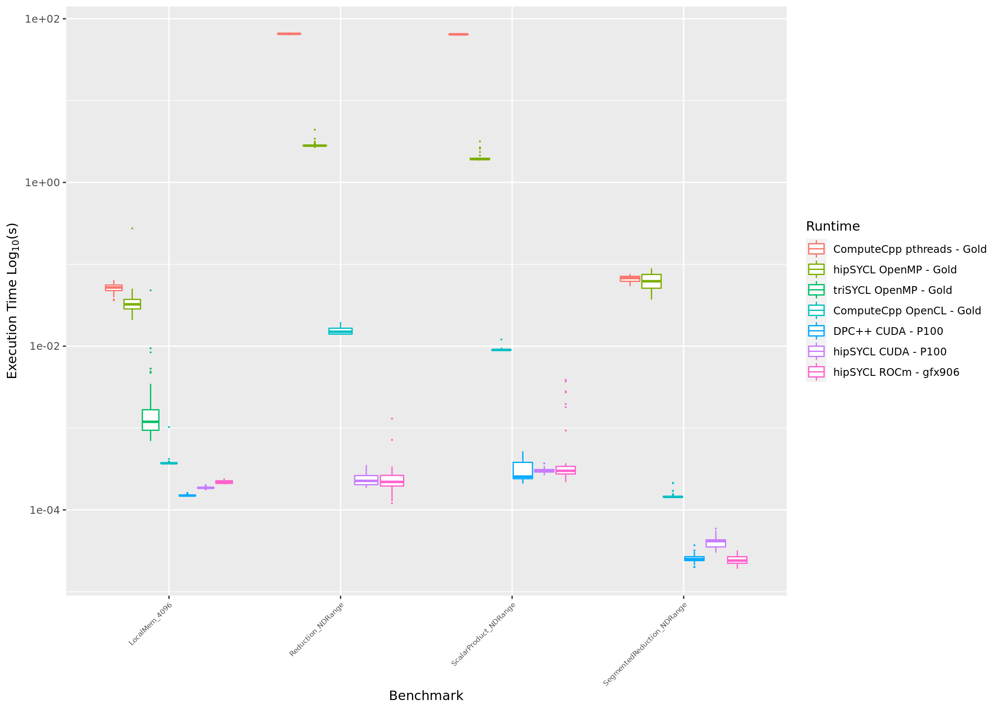

In [249]:
%%R -i wgp_int -i colour_scale -w 11.7 -h 8.3 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(wgp_int) <- make.names(names(wgp_int), unique = FALSE, allow_ = TRUE)
wgp_int$data.type.width <- reorder(wgp_int$data.type.width, as.numeric(wgp_int$data.type.width))
wgp_int <- subset(wgp_int, data.type.width=="32")
#rename for plotting
levels(wgp_int$data.type.width) <- paste("int",levels(wgp_int$data.type.width),sep='')

p1 <- ggplot(wgp_int, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale
ggsave('wgp-int.pdf', p1, device="pdf",width=11.7, height=8.3, units="in",dpi=320)
print(p1)

In [245]:
#subset just kernels with a verified passing result.
wgp = wgp[wgp['Verification'] == "PASS"]

#we could divide this data-set either by the number of invocations used in application or by the data-type worked with -- we choose the latter.
wgp_fp = wgp[wgp['Benchmark name'].str.contains("_fp")]
wgp_fp['data.type.width'] = wgp_fp['Benchmark name'].str.extract(r'_fp(\d+)')
wgp_fp['Benchmark name'] = wgp_fp['Benchmark name'].str.replace(r'_fp(\d+)','')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


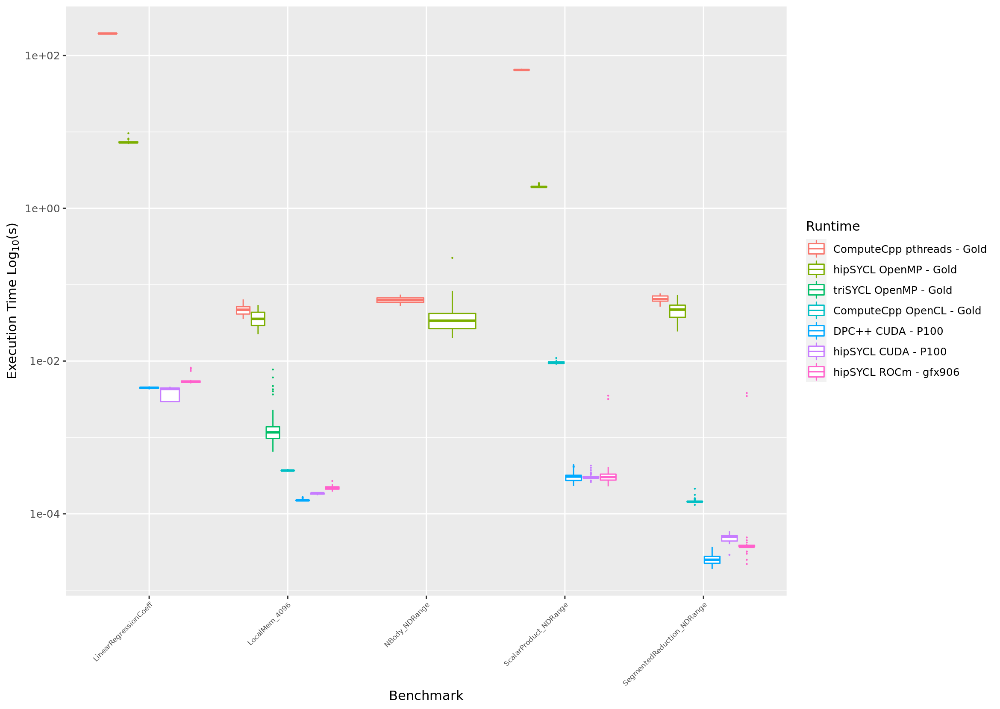

In [271]:
%%R -i wgp_fp -i colour_scale -w 11.7 -h 8.3 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(wgp_fp) <- make.names(names(wgp_fp), unique = FALSE, allow_ = TRUE)
wgp_fp$data.type.width <- reorder(wgp_fp$data.type.width, as.numeric(wgp_fp$data.type.width))
wgp_fp <- subset(wgp_fp, data.type.width=="32")
#rename for plotting
levels(wgp_fp$data.type.width) <- paste("fp",levels(wgp_fp$data.type.width),sep='')

p1 <- ggplot(wgp_fp, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale
ggsave('wgp-float.pdf', p1, device="pdf",width=11.7, height=8.3, units="in",dpi=320)
print(p1)

#### DAGTask

Let's plot the last couple of kernels without explicit data-types:

`Runtime_IndependentDAGTaskThroughput_NDRangeParallelFor` and `Runtime_DAGTaskThroughput_NDRangeParallelFor`.

In [250]:
#subset just kernels with a verified passing result.
wgp = wgp[wgp['Verification'] == "PASS"]

#we could divide this data-set either by the number of invocations used in application or by the data-type worked with -- we choose the latter.
wgp_dag = wgp[wgp['Benchmark name'].str.contains("DAGTaskThroughput")]

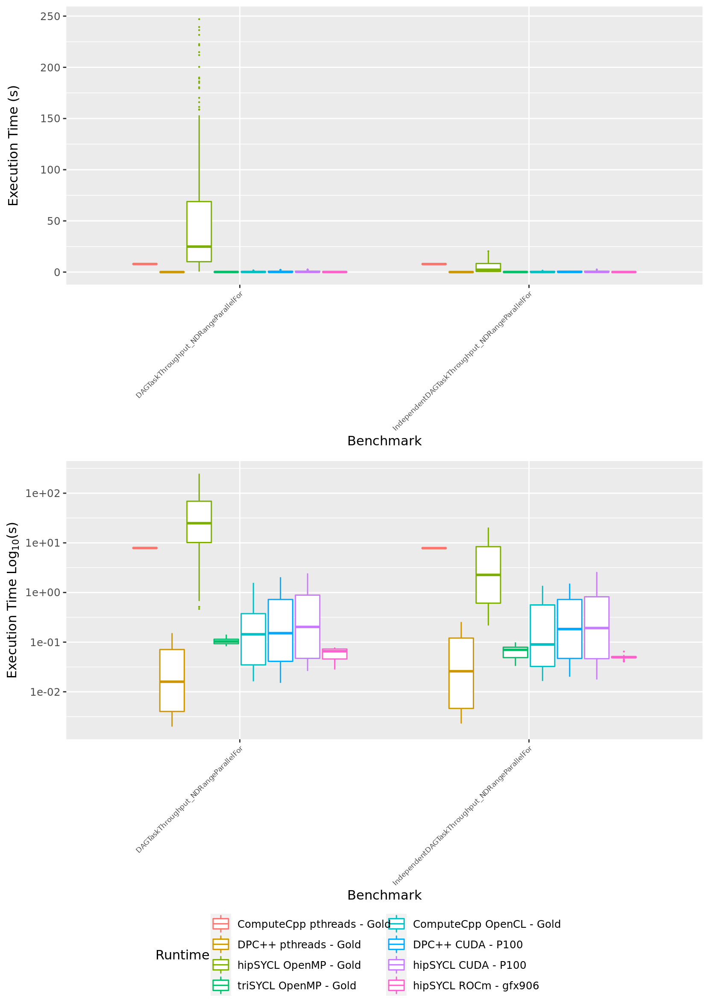

In [251]:
%%R -i wgp_dag -i colour_scale -w 8.3 -h 11.7 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(wgp_dag) <- make.names(names(wgp_dag), unique = FALSE, allow_ = TRUE)

p1 <- ggplot(wgp_dag, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y="Execution Time (s)") + geom_boxplot(outlier.size = outlier_size) + colour_scale
p2 <- ggplot(wgp_dag, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale

library('cowplot')
pg <- plot_grid(p1 + theme(legend.position="none"),
                p2 + theme(legend.position="none"),
                align = 'vh', hjust = -2, nrow = 2)

#bottom legend
legend <- get_legend(p1 + guides(color = guide_legend(nrow = 4)) + theme(legend.position = "bottom"))
plot_grid(pg, legend, rel_heights = c(1, .1),nrow=2)


From the box-and-whisker plots, we notice there is a large variation in performance on most SYCL Runtimes --with exceptions on the Xeon Gold ComputeCpp/CPU and Vega 20 hipSYCL/ROCm-- and merits additional investigation.

In [252]:
wgp_dag['problem-size'].unique()

array([ 1024.,  2048.,  4096.,  8192., 16384., 32768., 65536.])

Eureka! The data is amalgamated over several different problem sizes. Let's present these results separately.

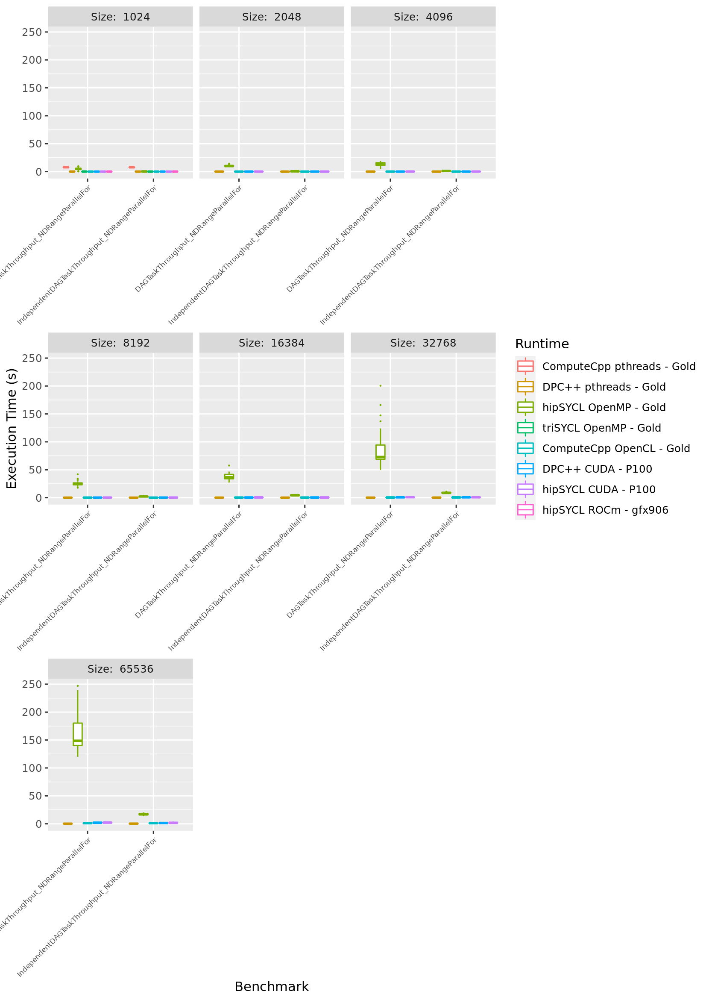

In [253]:
%%R -i wgp_dag -i colour_scale -w 8.3 -h 11.7 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(wgp_dag) <- make.names(names(wgp_dag), unique = FALSE, allow_ = TRUE)

wgp_dag$problem.size <- reorder(wgp_dag$problem.size, as.numeric(wgp_dag$problem.size))

#rename for plotting
levels(wgp_dag$problem.size) <- paste("Size: ",levels(wgp_dag$problem.size))

p1 <- ggplot(wgp_dag, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y="Execution Time (s)") + geom_boxplot(outlier.size = outlier_size) + facet_wrap( ~ problem.size, strip.position = "top", scales = "free_x") + colour_scale
p1
#p2 <- ggplot(wgp_dag, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + facet_wrap( ~ problem.size, strip.position = "top", scales = "free_x") + colour_scale

#library('cowplot')
#pg <- plot_grid(p1 + theme(legend.position="none"),
#                p2 + theme(legend.position="none"),
#                align = 'vh', hjust = -2, nrow = 2)

#bottom legend
#legend <- get_legend(p1 + guides(color = guide_legend(nrow = 4)) + theme(legend.position = "bottom"))
#plot_grid(pg, legend, rel_heights = c(1, .1),nrow=2)


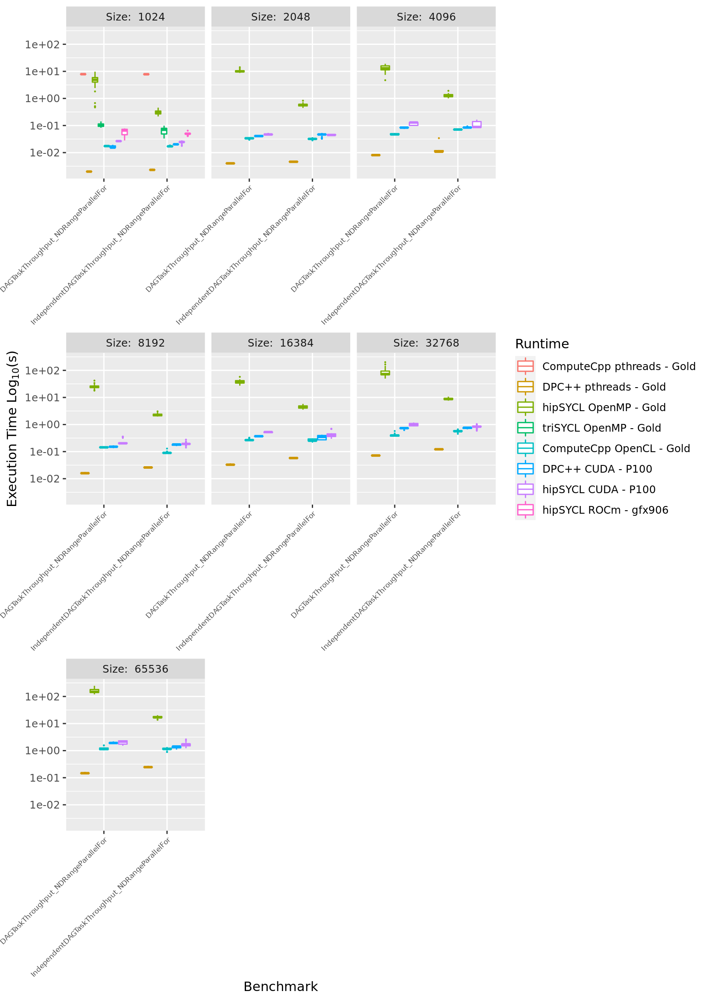

In [254]:
%%R -i wgp_dag -i colour_scale -w 8.3 -h 11.7 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(wgp_dag) <- make.names(names(wgp_dag), unique = FALSE, allow_ = TRUE)

wgp_dag$problem.size <- reorder(wgp_dag$problem.size, as.numeric(wgp_dag$problem.size))

#rename for plotting
levels(wgp_dag$problem.size) <- paste("Size: ",levels(wgp_dag$problem.size))

p2 <- ggplot(wgp_dag, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + facet_wrap( ~ problem.size, strip.position = "top", scales = "free_x") + colour_scale
p2
#library('cowplot')
#pg <- plot_grid(p1 + theme(legend.position="none"),
#                p2 + theme(legend.position="none"),
#                align = 'vh', hjust = -2, nrow = 2)

#bottom legend
#legend <- get_legend(p1 + guides(color = guide_legend(nrow = 4)) + theme(legend.position = "bottom"))
#plot_grid(pg, legend, rel_heights = c(1, .1),nrow=2)


As the problem size increases, we see the overall magnitudes of execution time also increase. This is most apparent when examining the hipSYCL/OpenMP runtime on the Xeon Gold -- especially on the TaskThroughput kernel. However the relative ordering remains the same. With the DPC++/CPU runtime performing the best on all problem sizes, followed by the ComputeCpp/OpenCL runtime, then the CUDA backends performing equally regardless of wether hipSYCL or DPC++ is used as the implementation. Since we have the data, we subset the data by solely selecting the largest problem size (65536 or 2^16) whenever these DAG kernels are presented.

In [257]:
#subset just kernels with a verified passing result.
wgp = wgp[wgp['Verification'] == "PASS"]

wgp_sub_dag = wgp[wgp['Benchmark name'].str.contains("DAGTaskThroughput")]
#select just the largest problem size
wgp_sub_dag = wgp_sub_dag[wgp_sub_dag['problem-size'] == 65536]
#rename/shorten names
wgp_sub_dag['Benchmark name'] = wgp_sub_dag['Benchmark name'].str.extract(r'(\w+)_')

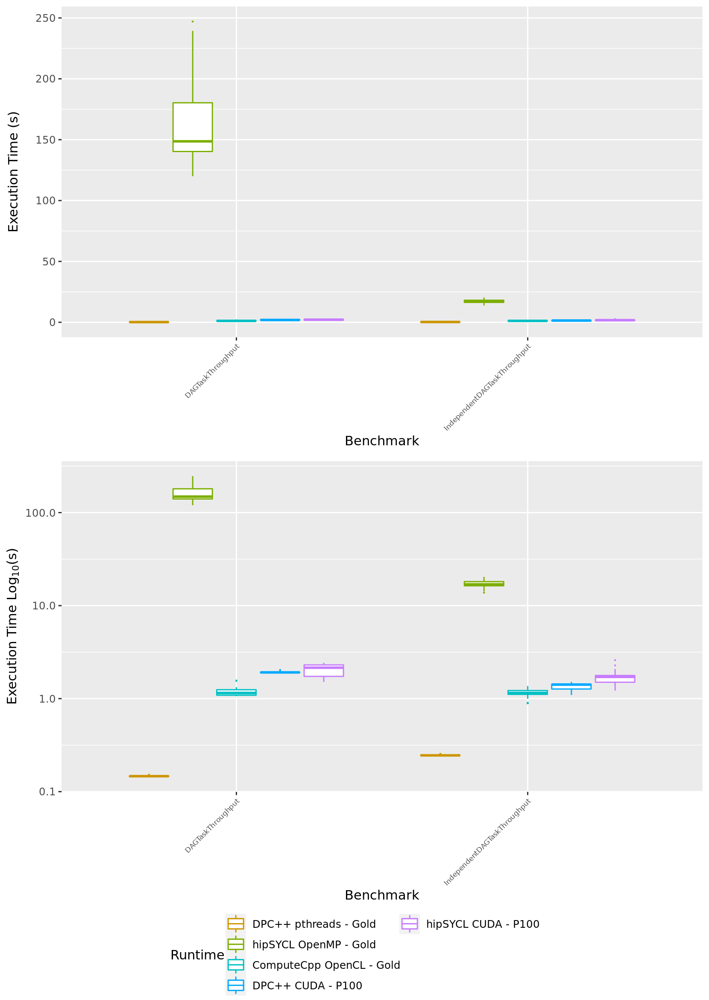

In [258]:
%%R -i wgp_sub_dag -i colour_scale -w 8.3 -h 11.7 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(wgp_sub_dag) <- make.names(names(wgp_sub_dag), unique = FALSE, allow_ = TRUE)

p1 <- ggplot(wgp_sub_dag, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y="Execution Time (s)") + geom_boxplot(outlier.size = outlier_size) + colour_scale
p2 <- ggplot(wgp_sub_dag, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale

library('cowplot')
pg <- plot_grid(p1 + theme(legend.position="none"),
                p2 + theme(legend.position="none"),
                align = 'vh', hjust = -2, nrow = 2)

#bottom legend
legend <- get_legend(p1 + guides(color = guide_legend(nrow = 4)) + theme(legend.position = "bottom"))
plot_grid(pg, legend, rel_heights = c(1, .1),nrow=2)


# HDP – Hierarchical data-parallel kernels

SYCL offers compiler level support –doesn’t change the underlying execution model of the kernel– for expressing the hierarchical nature of data-parallelism –such as work-groups– and can be used for performance tuning.
A range is provided into the enqueuing functions to specify the number of work-groups to launch and an optional size of each work-group.


`parallel_for_work_item`: Use of this function in the suite indicates there has been an attempt made to optimize the application to use private memory. This corresponds to the lowest level cache / smallest-faster memory on the accelerator. 6 of the 37 applications examined make use of enqueuing via `parallel_for_work_item`, namely,`dag_task_throughput_independent` (1), `dag_task_throughput_sequential` (1), `nbody` (4), `scalar_prod` (4), `segmentedreduction` (3) and `reduction` (3).


`parallel_for_work_group`:  Presents  a  degree  of  optimization  around  the  use  of  local  memory,  because all  variables  declared  in  this  scope  are  allocated  in  workgroup  local  memory.   The  same  applications  that  use `parallel_for_work_item` also use `parallel_for_work_group`. The number of times they are used differ; `dag_task_throughput_independent` (1), `dag_task_throughput_sequential` (1), `n-body` (1), `scalar_prod` (2), `segmentedreduction` (1) and `reduction` (1).

In [259]:
hdp = chompLeadingSYCLBenchExperimentType(hdp)
#subset just kernels with a verified passing result.
hdp = hdp[hdp['Verification'] == "PASS"]
#discard all but the largest problem size for DagTaskThroughput kernels
hdp = hdp[ (~ hdp['Benchmark name'].str.contains('DAGTaskThroughput')) | (hdp['Benchmark name'].str.contains('DAGTaskThroughput') & (hdp['problem-size'] == 65536))]

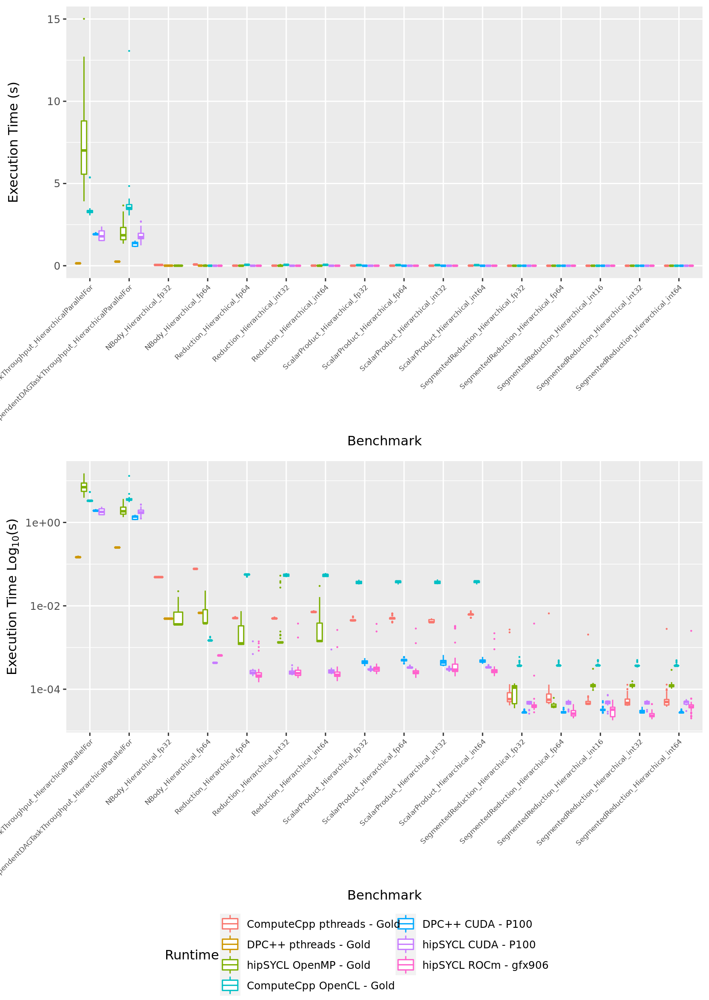

In [260]:
%%R -i hdp -i colour_scale -w 8.3 -h 11.7 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(hdp) <- make.names(names(hdp), unique = FALSE, allow_ = TRUE)

p1 <- ggplot(hdp, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y="Execution Time (s)") + geom_boxplot(outlier.size = outlier_size) + colour_scale
p2 <- ggplot(hdp, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale

library('cowplot')
pg <- plot_grid(p1 + theme(legend.position="none"),
                p2 + theme(legend.position="none"),
                align = 'vh', hjust = -2, nrow = 2)

#bottom legend
legend <- get_legend(p1 + guides(color = guide_legend(nrow = 4)) + theme(legend.position = "bottom"))
plot_grid(pg, legend, rel_heights = c(1, .1),nrow=2)


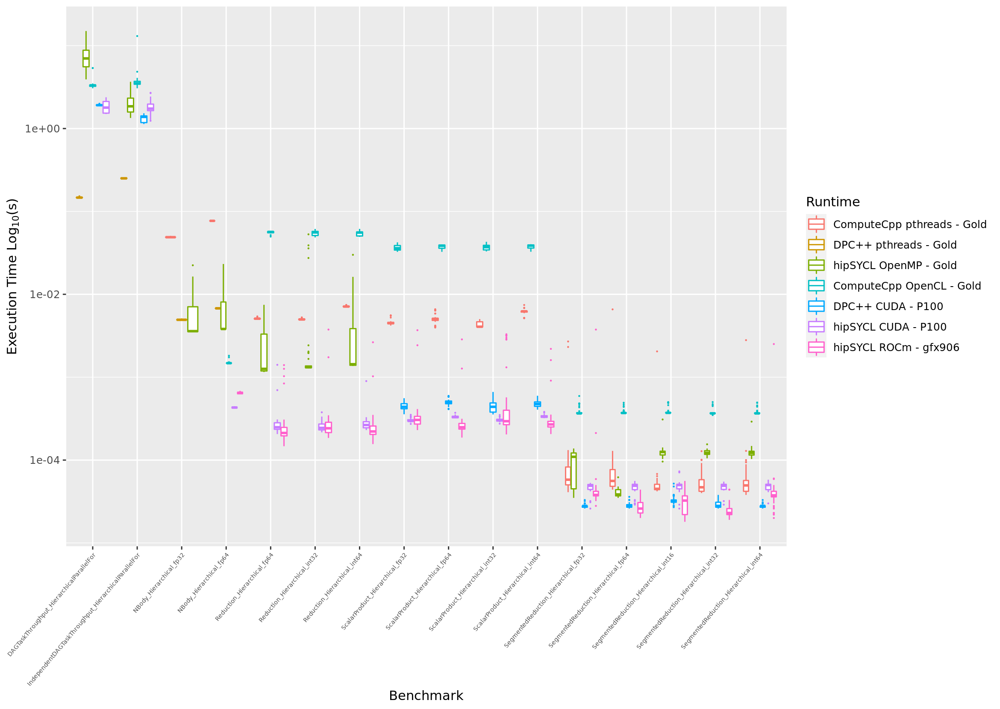

In [263]:
%%R -i hdp -i colour_scale -w 11.7 -h 8.3 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(hdp) <- make.names(names(hdp), unique = FALSE, allow_ = TRUE)

p1 <- ggplot(hdp, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 50, hjust = 1, size = 5)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale
ggsave('hdp-dt.pdf', p1, device="pdf",width=11.7, height=8.3, units="in",dpi=320)
print(p1)

# Task – Single-Task Kernels

A kernel is executed once,  conceptually,  on a single compute-unit,  in one work-group,  as one work-item;  these kernels can be executed on multiple devices and queues and encompass task-based parallelism. 
It is used with the `single_task` function. In the suite, 3 applications use this construct; `dag_task_throughput_sequential` (1), `dag_task_throughput_independent` (1) and `host_device_bandwidth` (1). However, `host_device_bandwidth` submits a non-operation `single_task` to force a read-only buffer to be copied in the micro-benchmark, since this kernel does nowork it is omitted from the evaluation.

In [264]:
task = chompLeadingSYCLBenchExperimentType(task)

#subset just kernels with a verified passing result.
task = task[task['Verification'] == "PASS"]

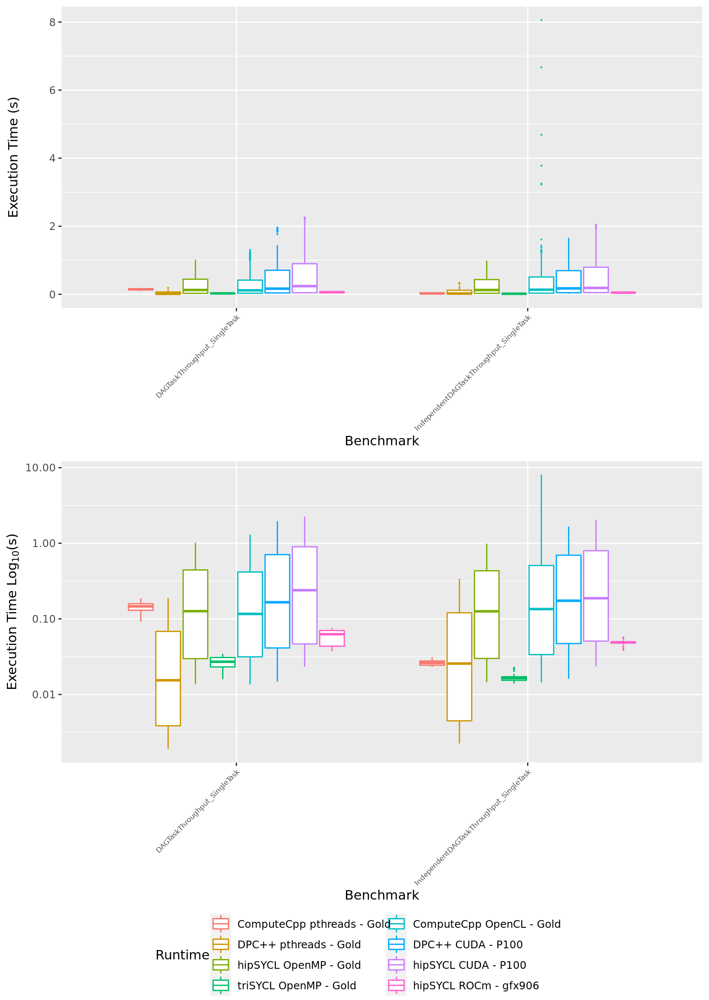

In [265]:
%%R -i task -i colour_scale -w 8.3 -h 11.7 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(task) <- make.names(names(task), unique = FALSE, allow_ = TRUE)

p1 <- ggplot(task, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y="Execution Time (s)") + geom_boxplot(outlier.size = outlier_size) + colour_scale
p2 <- ggplot(task, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale

library('cowplot')
pg <- plot_grid(p1 + theme(legend.position="none"),
                p2 + theme(legend.position="none"),
                align = 'vh', hjust = -2, nrow = 2)

#bottom legend
legend <- get_legend(p1 + guides(color = guide_legend(nrow = 4)) + theme(legend.position = "bottom"))
plot_grid(pg, legend, rel_heights = c(1, .1),nrow=2)


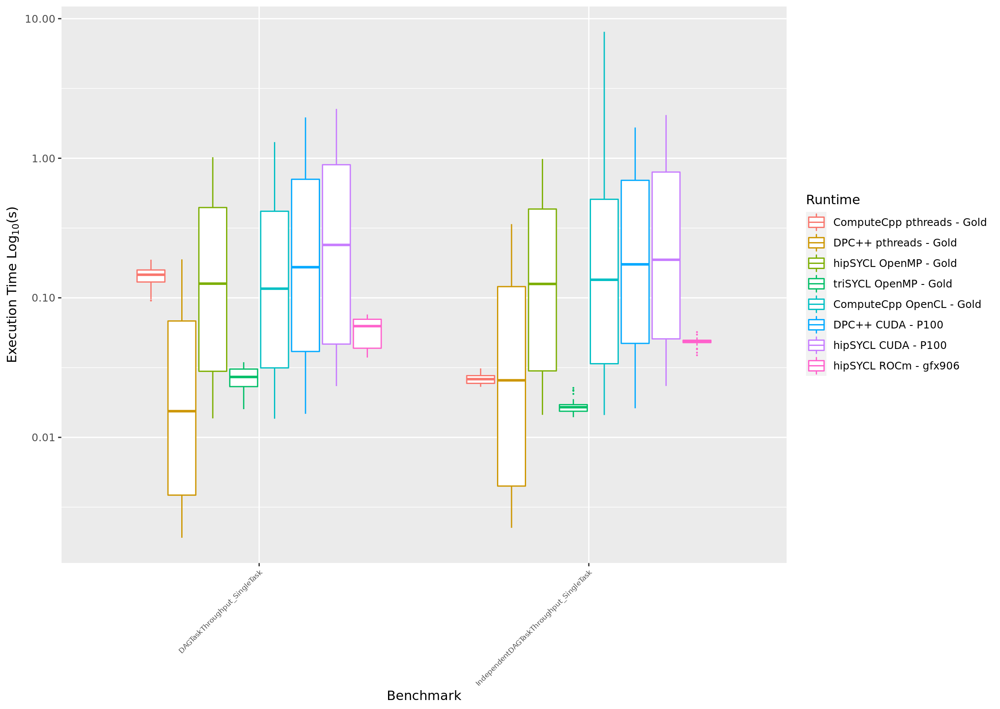

In [266]:
%%R -i task -i colour_scale -w 11.7 -h 8.3 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(task) <- make.names(names(task), unique = FALSE, allow_ = TRUE)
p1 <- ggplot(task, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale
ggsave('task.pdf', p1, device="pdf",width=11.7, height=8.3, units="in",dpi=320)
print(p1)

# Sync – Synchronization

In general, operations between the host and the device(s) will require synchronization; such as buffer destruction, host accessors, command group enqueue, queue operations etc.
Instead, we focus on user-controllable synchronization events: those that occur within a kernels execution, either globally or locally – within a work-group.
The `barrier` function is used inside kernels to synchronize between work-items in a work-group.
It is used in 7 of the 37 kernels, namely, `reduction` (1), `segmentedreduction` (1), `lin_reg_coeff` (2), `scalar_prod` (2), `nbody` (2), `local_mem` (2). `lin_reg_coeff`, `scalar_prod` and `local_mem` request a `local_space` fence synchronization within a work-group whereas `reduction`, `segmented_reduction` and `nbody` use the default `global` `barrier`.
NDRange versions of these kernels are the ones which contain barriers – the hierarchical variations do not.
The `nbody` kernel contains two barriers in the same invocation, as does the `local_mem` benchmark. `Reduction` contains one barrier in the inner-most loop of the NDRange implementation.

In [267]:
sync = chompLeadingSYCLBenchExperimentType(sync)

#subset just kernels with a verified passing result.
sync = sync[sync['Verification'] == "PASS"]

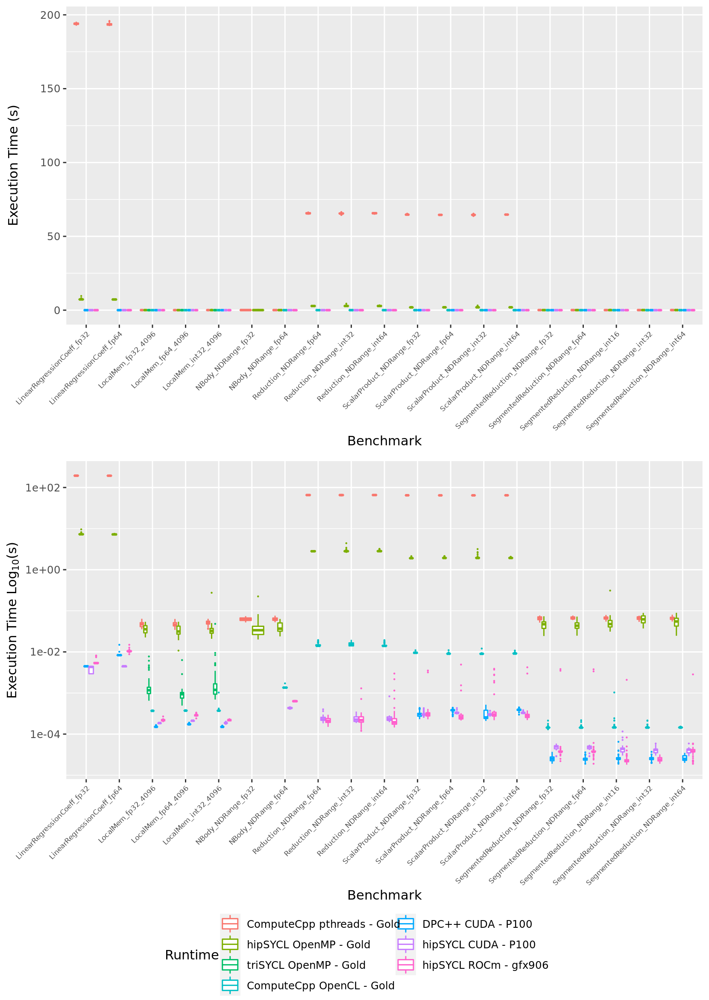

In [268]:
%%R -i sync -i colour_scale -w 8.3 -h 11.7 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(sync) <- make.names(names(sync), unique = FALSE, allow_ = TRUE)

p1 <- ggplot(sync, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y="Execution Time (s)") + geom_boxplot(outlier.size = outlier_size) + colour_scale
p2 <- ggplot(sync, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale

library('cowplot')
pg <- plot_grid(p1 + theme(legend.position="none"),
                p2 + theme(legend.position="none"),
                align = 'vh', hjust = -2, nrow = 2)

#bottom legend
legend <- get_legend(p1 + guides(color = guide_legend(nrow = 4)) + theme(legend.position = "bottom"))
plot_grid(pg, legend, rel_heights = c(1, .1),nrow=2)


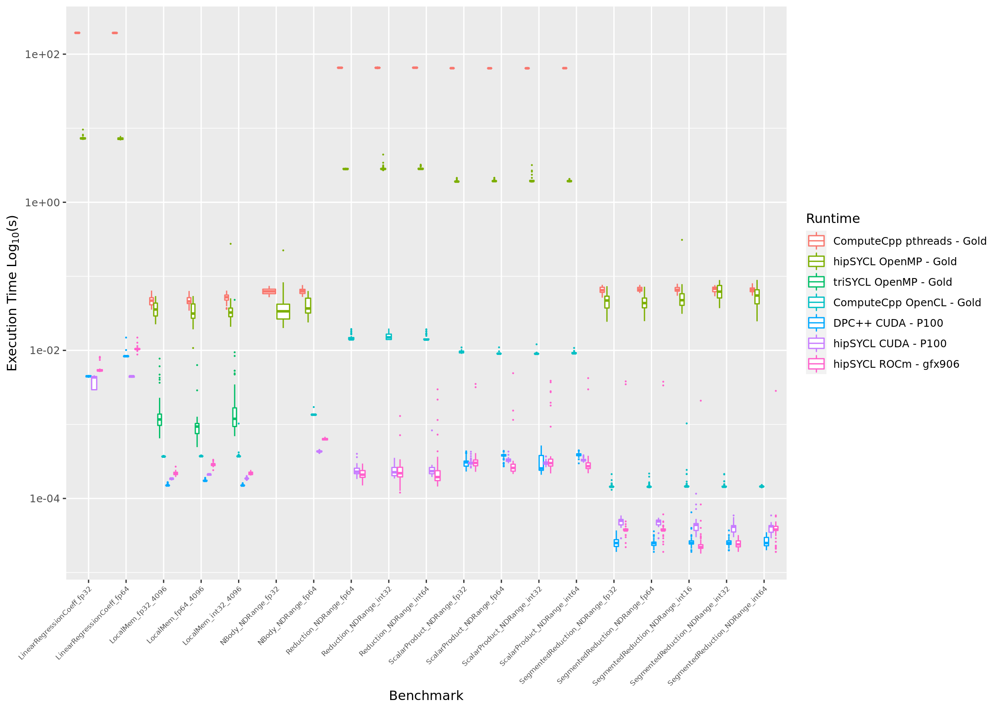

In [269]:
%%R -i sync -i colour_scale -w 11.7 -h 8.3 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(sync) <- make.names(names(sync), unique = FALSE, allow_ = TRUE)

p1 <- ggplot(sync, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale

ggsave('sync.pdf', p1, device="pdf",width=11.7, height=8.3, units="in",dpi=320)
print(p1)

# Generating Results

This is a good opportunity to record how the results were compiled and collected.

#### ComputeCPP
Compile with ComputeCPP and remove non-applications from the final build.

In [33]:
! rm -r ./computecpp-benchmarks
! mkdir ./computecpp-benchmarks && cd ./computecpp-benchmarks && cmake ../.. -DSYCL_IMPL=ComputeCpp -DCMAKE_PREFIX_PATH=/tmp/ComputeCpp-latest && make -j16 && rm -r Makefile CMakeCache.txt CMakeFiles && cd ..

-- The C compiler identification is Clang 9.0.1
-- The CXX compiler identification is Clang 9.0.1
-- Check for working C compiler: /llvm-9.0.1/bin/clang
-- Check for working C compiler: /llvm-9.0.1/bin/clang -- works
-- Detecting C compiler ABI info
-- Detecting C compiler ABI info - done
-- Detecting C compile features
-- Detecting C compile features - done
-- Check for working CXX compiler: /llvm-9.0.1/bin/clang++
-- Check for working CXX compiler: /llvm-9.0.1/bin/clang++ -- works
-- Detecting CXX compiler ABI info
-- Detecting CXX compiler ABI info - done
-- Detecting CXX compile features
-- Detecting CXX compile features - done
-- Looking for CL_VERSION_2_2
-- Looking for CL_VERSION_2_2 - found
-- Found OpenCL: /usr/lib/x86_64-linux-gnu/libOpenCL.so (found version "2.2") 
-- platform - your system can support ComputeCpp
-- Found ComputeCpp: /tmp/ComputeCpp-latest (found version "CE 1.3.0") 
-- compute++ flags - -O2;-mllvm;-inline-threshold=1000;-intelspirmetadata;-sycl-target;spir6

[ 20%] Building ComputeCpp integration header file /workspace/codes/sycl-bench/bin/computecpp-kt-benchmarks/host_device_bandwidth_host_device_bandwidth.cpp.sycl
[ 20%] Built target sf_sf.cpp_0_ih
Scanning dependencies of target lin_reg_error_lin_reg_error.cpp_0_ih
[ 21%] Building ComputeCpp integration header file /workspace/codes/sycl-bench/bin/computecpp-kt-benchmarks/lin_reg_error_lin_reg_error.cpp.sycl
remark: [Computecpp:CC0027]: Some memcpy/memset intrinsics added by the llvm
      optimizer were replaced by serial functions. This is a workaround for
      OpenCL drivers that do not support those intrinsics. This may impact
      performance, consider using -no-serial-memop. [-Rsycl-serial-memop]
remark: [Computecpp:CC0027]: Some memcpy/memset intrinsics added by the llvm
      optimizer were replaced by serial functions. This is a workaround for
      OpenCL drivers that do not support those intrinsics. This may impact
      performance, consider using -no-serial-memop. [-Rsycl-

remark: [Computecpp:CC0027]: Some memcpy/memset intrinsics added by the llvm
      optimizer were replaced by serial functions. This is a workaround for
      OpenCL drivers that do not support those intrinsics. This may impact
      performance, consider using -no-serial-memop. [-Rsycl-serial-memop]
[ 34%] Built target kmeans_kmeans.cpp_0_ih
remark: [Computecpp:CC0027]: Some memcpy/memset intrinsics added by the llvm
      optimizer were replaced by serial functions. This is a workaround for
      OpenCL drivers that do not support those intrinsics. This may impact
      performance, consider using -no-serial-memop. [-Rsycl-serial-memop]
Scanning dependencies of target mvt
[ 34%] Built target DRAM_DRAM.cpp_0_ih
Scanning dependencies of target gramschmidt
[ 35%] Building CXX object CMakeFiles/mvt.dir/polybench/mvt.cpp.o
[ 35%] Building CXX object CMakeFiles/gramschmidt.dir/polybench/gramschmidt.cpp.o
remark: [Computecpp:CC0027]: Some memcpy/memset intrinsics added by the llvm
      opt

[ 51%] Built target gemm
Scanning dependencies of target nbody
[ 51%] Built target gesummv
Scanning dependencies of target median
[ 51%] Built target mvt
Scanning dependencies of target arith
[ 52%] Building CXX object CMakeFiles/median.dir/single-kernel/median.cpp.o
[ 52%] Built target gramschmidt
Scanning dependencies of target local_mem
[ 53%] Building CXX object CMakeFiles/arith.dir/micro/arith.cpp.o
[ 54%] Building CXX object CMakeFiles/nbody.dir/single-kernel/nbody.cpp.o
[ 55%] Building CXX object CMakeFiles/local_mem.dir/micro/local_mem.cpp.o
[ 56%] Linking CXX executable 3DConvolution
[ 56%] Built target 3DConvolution
Scanning dependencies of target DRAM
[ 57%] Building CXX object CMakeFiles/DRAM.dir/micro/DRAM.cpp.o
[ 57%] Linking CXX executable fdtd2d
[ 58%] Linking CXX executable 2mm
[ 58%] Built target fdtd2d
Scanning dependencies of target covariance
[ 58%] Built target 2mm
[ 59%] Building CXX object CMakeFiles/covariance.dir/polybench/covariance.cpp.o
Scanning dependencie

Update the default symlink for the running suite to operate on.

In [34]:
! rm -r ./benchmarks
! ln -s ./computecpp-benchmarks ./benchmarks

Run the benchmarks on CPU:

In [41]:
! ./run-suite cpu

Using test profile: cpu


##################################################
Processing host_device_bandwidth
##################################################
0.0 10800.0
__________________________________________________

host_device_bandwidth --num-runs=50 --output=./sycl-bench.csv --device=cpu --size=1024 --local=256
==> Benchmark run finished in 471.2177422650002 s


##################################################
Processing sf
##################################################
0.0 10800.0
__________________________________________________

sf --num-runs=50 --output=./sycl-bench.csv --device=cpu --size=1024 --local=256
==> Benchmark run finished in 0.4263444839998556 s


##################################################
Processing blocked_transform
##################################################
0.0 10800.0
__________________________________________________

blocked_transform --num-runs=50 --output=./sycl-bench.csv --device=cpu --size=1048576 --local=256
==> Benchmark run 

==> Benchmark run finished in 41.13749555400136 s


##################################################
Processing kmeans
##################################################
0.0 10800.0
__________________________________________________

kmeans --num-runs=50 --output=./sycl-bench.csv --device=cpu --size=1048576 --local=256
==> Benchmark run finished in 3.6586995469988324 s


##################################################
Processing pattern_L2
##################################################
0.0 10800.0
__________________________________________________

pattern_L2 --num-runs=50 --output=./sycl-bench.csv --device=cpu --size=1048576 --local=256
==> Benchmark run finished in 4.306664562998776 s


##################################################
Processing 3mm
##################################################
0.0 10800.0
__________________________________________________

3mm --num-runs=50 --output=./sycl-bench.csv --device=cpu --size=1024 --local=256
==> Benchmark FAILED: /workspac

Rename the results to something more descriptive.

In [42]:
! tail -c +1 sycl-bench.csv > sycl-bench.csv
! mv ./sycl-bench.csv ./sycl-bench-gold-computecpp.csv

**Note:** ComputeCPP's support on Nvidia GPUs is expermental -- it uses a PTX backend. Most benchmarks fail to compile with it so it is omitted.

#### DPC++

Compile with OpenCL, CPU and CUDA/PTX backends. 

**Note:** We expect some benchmarks to fail to build as at the time of investigation (May 2020) [SYCL on CUDA](https://github.com/intel/llvm/projects) in DPC++ had ~60% of features implemented.

**Note:** We cannot collect individual kernel times with DPC++ because the benchmark suite uses they SYCL profiling info construct which is not supported on host device.


##### OpenCL


##### CPU

We must hide the OpenCL ICDs during compilation time to force the CPU backend.

In [56]:
! mv /etc/OpenCL/vendors/amd.icd /etc/OpenCL/vendors/amd.icdX
! mv /etc/OpenCL/vendors/nvidia.icd /etc/OpenCL/vendors/nvidia.icdX
! rm -r ./dpc++-cpu-benchmarks
! mkdir ./dpc++-cpu-benchmarks && cd ./dpc++-cpu-benchmarks && cmake ../.. -DSYCL_IMPL=LLVM -DDPC++_INSTALL_DIR=/tmp/llvm-sycl/build/install && make -j16 --keep-going
! cd ./dpc++-cpu-benchmarks && rm -r Makefile CMakeCache.txt CMakeFiles cmake_install.cmake && cd ..
! mv /etc/OpenCL/vendors/amd.icdX /etc/OpenCL/vendors/amd.icd
! mv /etc/OpenCL/vendors/nvidia.icdX /etc/OpenCL/vendors/nvidia.icd

-- The C compiler identification is Clang 9.0.1
-- The CXX compiler identification is Clang 9.0.1
-- Check for working C compiler: /llvm-9.0.1/bin/clang
-- Check for working C compiler: /llvm-9.0.1/bin/clang -- works
-- Detecting C compiler ABI info
-- Detecting C compiler ABI info - done
-- Detecting C compile features
-- Detecting C compile features - done
-- Check for working CXX compiler: /llvm-9.0.1/bin/clang++
-- Check for working CXX compiler: /llvm-9.0.1/bin/clang++ -- works
-- Detecting CXX compiler ABI info
-- Detecting CXX compiler ABI info - done
-- Detecting CXX compile features
-- Detecting CXX compile features - done
-- SYCL-LLVM sycl-post-link found at: /tmp/llvm-sycl/build/install/bin/sycl-post-link
-- Configuring done
-- Generating done
-- Build files have been written to: /workspace/codes/sycl-bench/bin/dpc++-opencl-kt-benchmarks
Scanning dependencies of target syrk
Scanning dependencies of target gramschmidt
Scanning dependencies of target fdtd2d
Scanning dependenci

clang-11: error: unable to execute command: Aborted (core dumped)
clang-11: error: clang frontend command failed due to signal (use -v to see invocation)
clang version 11.0.0 
Target: x86_64-unknown-linux-gnu
Thread model: posix
InstalledDir: /tmp/llvm-sycl/build/install/bin
clang-11: note: diagnostic msg: Error generating preprocessed source(s).
CMakeFiles/sobel5.dir/build.make:62: recipe for target 'CMakeFiles/sobel5.dir/single-kernel/sobel5.cpp.o' failed
make[2]: *** [CMakeFiles/sobel5.dir/single-kernel/sobel5.cpp.o] Error 254
make[2]: Target 'CMakeFiles/sobel5.dir/build' not remade because of errors.
CMakeFiles/Makefile2:590: recipe for target 'CMakeFiles/sobel5.dir/all' failed
make[1]: *** [CMakeFiles/sobel5.dir/all] Error 2
Scanning dependencies of target reduction
[ 22%] Building CXX object CMakeFiles/reduction.dir/pattern/reduction.cpp.o
[ 23%] Linking CXX executable syr2k
[ 25%] Linking CXX executable 3DConvolution
[ 26%] Linking CXX executable gemm
[ 26%] Built target syr2k
S

clang-11: /tmp/llvm-sycl/clang/lib/CodeGen/CGExprAgg.cpp:1862: void clang::CodeGen::CodeGenFunction::EmitAggExpr(const clang::Expr*, clang::CodeGen::AggValueSlot): Assertion `E && hasAggregateEvaluationKind(E->getType()) && "Invalid aggregate expression to emit"' failed.
PLEASE submit a bug report to https://bugs.llvm.org/ and include the crash backtrace, preprocessed source, and associated run script.
Stack dump:
0.	Program arguments: /tmp/llvm-sycl/build/install/bin/clang-11 -cc1 -triple spir64-unknown-unknown-sycldevice -fsycl -fsycl-is-device -fdeclare-spirv-builtins -aux-triple x86_64-unknown-linux-gnu -Wno-sycl-strict -sycl-std=2017 -emit-llvm-bc -emit-llvm-uselists -disable-free -main-file-name sobel7.cpp -mrelocation-model static -mthread-model posix -mframe-pointer=all -fmath-errno -fno-rounding-math -fno-verbose-asm -mconstructor-aliases -aux-target-cpu x86-64 -dwarf-column-info -fno-split-dwarf-inlining -debugger-tuning=gdb -resource-dir /tmp/llvm-sycl/build/install/lib/clan

clang-11: error: unable to execute command: Aborted (core dumped)
clang-11: error: clang frontend command failed due to signal (use -v to see invocation)
clang version 11.0.0 
Target: x86_64-unknown-linux-gnu
Thread model: posix
InstalledDir: /tmp/llvm-sycl/build/install/bin
clang-11: note: diagnostic msg: Error generating preprocessed source(s).
CMakeFiles/sobel.dir/build.make:62: recipe for target 'CMakeFiles/sobel.dir/single-kernel/sobel.cpp.o' failed
make[2]: *** [CMakeFiles/sobel.dir/single-kernel/sobel.cpp.o] Error 254
make[2]: Target 'CMakeFiles/sobel.dir/build' not remade because of errors.
CMakeFiles/Makefile2:849: recipe for target 'CMakeFiles/sobel.dir/all' failed
make[1]: *** [CMakeFiles/sobel.dir/all] Error 2
Scanning dependencies of target lin_reg_coeff
[ 60%] Building CXX object CMakeFiles/lin_reg_coeff.dir/single-kernel/lin_reg_coeff.cpp.o
clang-11: note: diagnostic msg: Error generating preprocessed source(s).
CMakeFiles/sobel7.dir/build.make:62: recipe for target 'CMa

Update the default symlink for the running suite to operate on.

In [57]:
! rm -r ./benchmarks
! ln -s ./dpc++-benchmarks ./benchmarks

Run the benchmarks on CPU:

In [59]:
! rm -r ./sycl-bench.csv
! LD_LIBRARY_PATH=${LD_LIBARARY_PATH}:/tmp/llvm-sycl/build/install/lib ./run-suite cpu

rm: cannot remove './sycl-bench.csv': No such file or directory
Using test profile: cpu


##################################################
Processing host_device_bandwidth
##################################################
0.0 10800.0
__________________________________________________

host_device_bandwidth --num-runs=50 --output=./sycl-bench.csv --device=cpu --size=1024 --local=256
SYCL error: OpenCL API failed. OpenCL API returns: -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT)
SYCL error: OpenCL API failed. OpenCL API returns: -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT)
SYCL error: OpenCL API failed. OpenCL API returns: -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT)
SYCL error: OpenCL API failed. OpenCL API returns: -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT)
SYCL error: OpenCL API failed. OpenCL API returns: -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT)
SYCL er

SYCL error: OpenCL API failed. OpenCL API returns: -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT)
SYCL error: OpenCL API failed. OpenCL API returns: -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT)
==> Benchmark run finished in 0.7253465630055871 s


##################################################
Processing correlation
##################################################
0.0 10800.0
__________________________________________________

correlation --num-runs=50 --output=./sycl-bench.csv --device=cpu --size=1024 --local=256
SYCL error: OpenCL API failed. OpenCL API returns: -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT)
==> Benchmark run finished in 0.05386332700436469 s


##################################################
Processing mvt
##################################################
0.0 10800.0
__________________________________________________

mvt --num-runs=50 --output=./sycl-bench.csv --device=cpu --size=16384 --local=256

SYCL error: OpenCL API failed. OpenCL API returns: -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT)
SYCL error: OpenCL API failed. OpenCL API returns: -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT)
SYCL error: OpenCL API failed. OpenCL API returns: -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT)
SYCL error: OpenCL API failed. OpenCL API returns: -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT)
==> Benchmark run finished in 0.05708987099933438 s
0.057712604000698775 10800.0
__________________________________________________

dag_task_throughput_independent --num-runs=50 --output=./sycl-bench.csv --device=cpu --size=16384 --local=256
SYCL error: OpenCL API failed. OpenCL API returns: -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT)
SYCL error: OpenCL API failed. OpenCL API returns: -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT)
SYCL error: OpenCL API failed. OpenCL API returns: 

SYCL error: OpenCL API failed. OpenCL API returns: -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT)
==> Benchmark run finished in 0.06403369100007694 s


##################################################
Processing reduction
##################################################
0.0 10800.0
__________________________________________________

reduction --num-runs=50 --output=./sycl-bench.csv --device=cpu --size=1048576 --local=256
SYCL error: OpenCL API failed. OpenCL API returns: -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT)
SYCL error: OpenCL API failed. OpenCL API returns: -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT)
SYCL error: OpenCL API failed. OpenCL API returns: -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT)
SYCL error: OpenCL API failed. OpenCL API returns: -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT)
SYCL error: OpenCL API failed. OpenCL API returns: -34 (CL_INVALID_CONTEXT) -34 (CL_INVAL

SYCL error: OpenCL API failed. OpenCL API returns: -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT)
SYCL error: OpenCL API failed. OpenCL API returns: -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT)
==> Benchmark run finished in 9.000205347008887 s


##################################################
Processing median
##################################################
0.0 10800.0
__________________________________________________

median --num-runs=50 --output=./sycl-bench.csv --device=cpu --size=1024 --local=256
SYCL error: OpenCL API failed. OpenCL API returns: -34 (CL_INVALID_CONTEXT) -34 (CL_INVALID_CONTEXT)
==> Benchmark run finished in 0.48677783699531574 s
All benchmarks were executed successfully


Rename the results to something more descriptive.

In [42]:
! tail -c +1 sycl-bench.csv > sycl-bench.csv
! mv ./sycl-bench.csv ./sycl-bench-gold-kt-dpc++-cpu.csv

##### CUDA

**Note** if running this from within the docker image you may need to rebuild the DPC++ CUDA backend in the running Docker instance -- I believe this may be due to missing CUDA runtime stubs missing during the docker build phase but haven't investigated further.
To rebuild the backend:

```
    cd /tmp
    wget https://github.com/intel/llvm/archive/sycl.zip -O /tmp/llvm-sycl.zip
    unzip /tmp/llvm-sycl.zip -d /tmp
    mv /tmp/llvm-sycl /tmp/llvm-sycl-cuda
    mkdir /tmp/llvm-sycl-cuda/build
    cd /tmp/llvm-sycl-cuda/build
    CC=gcc CXX=g++ CMAKE_LIBRARY_PATH=/usr/local/cuda/lib64/stubs python /tmp/llvm-sycl-cuda/buildbot/configure.py --cuda
    python /tmp/llvm-sycl-cuda/buildbot/compile.py
```


Build the suite against the DPC++ CUDA backend.

In [60]:
! rm -r ./dpc++-cuda-benchmarks
! mkdir ./dpc++-cuda-benchmarks && cd ./dpc++-cuda-benchmarks && cmake ../.. -DSYCL_IMPL=LLVM-CUDA -DDPC++_INSTALL_DIR=/tmp/llvm-sycl-cuda/build/install && make -j16 --keep-going
! cd ./dpc++-cuda-benchmarks && rm -r Makefile CMakeCache.txt CMakeFiles && cd ..

-- The C compiler identification is Clang 9.0.1
-- The CXX compiler identification is Clang 9.0.1
-- Check for working C compiler: /llvm-9.0.1/bin/clang
-- Check for working C compiler: /llvm-9.0.1/bin/clang -- works
-- Detecting C compiler ABI info
-- Detecting C compiler ABI info - done
-- Detecting C compile features
-- Detecting C compile features - done
-- Check for working CXX compiler: /llvm-9.0.1/bin/clang++
-- Check for working CXX compiler: /llvm-9.0.1/bin/clang++ -- works
-- Detecting CXX compiler ABI info
-- Detecting CXX compiler ABI info - done
-- Detecting CXX compile features
-- Detecting CXX compile features - done
-- SYCL-LLVM sycl-post-link found at: /tmp/llvm-sycl-cuda/build/install/bin/sycl-post-link
-- Configuring done
-- Generating done
-- Build files have been written to: /workspace/codes/sycl-bench/bin/dpc++-cuda-kt-benchmarks
Scanning dependencies of target syrk
Scanning dependencies of target mvt
Scanning dependencies of target gramschmidt
Scanning dependenci

clang-11: error: unable to execute command: Aborted (core dumped)
clang-11: error: clang frontend command failed due to signal (use -v to see invocation)
clang version 11.0.0 
Target: x86_64-unknown-linux-gnu
Thread model: posix
InstalledDir: /tmp/llvm-sycl-cuda/build/install/bin
clang-11: note: diagnostic msg: Error generating preprocessed source(s).
CMakeFiles/sobel5.dir/build.make:62: recipe for target 'CMakeFiles/sobel5.dir/single-kernel/sobel5.cpp.o' failed
make[2]: *** [CMakeFiles/sobel5.dir/single-kernel/sobel5.cpp.o] Error 254
make[2]: Target 'CMakeFiles/sobel5.dir/build' not remade because of errors.
CMakeFiles/Makefile2:590: recipe for target 'CMakeFiles/sobel5.dir/all' failed
make[1]: *** [CMakeFiles/sobel5.dir/all] Error 2
Scanning dependencies of target reduction
[ 22%] Building CXX object CMakeFiles/reduction.dir/pattern/reduction.cpp.o
[ 23%] Linking CXX executable gemm
[ 25%] Linking CXX executable 3DConvolution
[ 26%] Linking CXX executable syr2k
[ 27%] Linking CXX exe

clang-11: error: unable to execute command: Aborted (core dumped)
clang-11: error: clang frontend command failed due to signal (use -v to see invocation)
clang version 11.0.0 
Target: x86_64-unknown-linux-gnu
Thread model: posix
InstalledDir: /tmp/llvm-sycl-cuda/build/install/bin
clang-11: /tmp/llvm-sycl-cuda/clang/lib/CodeGen/CGExprAgg.cpp:1862: void clang::CodeGen::CodeGenFunction::EmitAggExpr(const clang::Expr*, clang::CodeGen::AggValueSlot): Assertion `E && hasAggregateEvaluationKind(E->getType()) && "Invalid aggregate expression to emit"' failed.
PLEASE submit a bug report to https://bugs.llvm.org/ and include the crash backtrace, preprocessed source, and associated run script.
Stack dump:
0.	Program arguments: /tmp/llvm-sycl-cuda/build/install/bin/clang-11 -cc1 -triple nvptx64-nvidia-cuda-sycldevice -fsycl -fsycl-is-device -fdeclare-spirv-builtins -aux-triple x86_64-unknown-linux-gnu -Wno-sycl-strict -sycl-std=2017 -emit-llvm-bc -emit-llvm-uselists -disable-free -main-file-name s

clang-11: error: unable to execute command: Aborted (core dumped)
clang-11: error: clang frontend command failed due to signal (use -v to see invocation)
clang version 11.0.0 
Target: x86_64-unknown-linux-gnu
Thread model: posix
InstalledDir: /tmp/llvm-sycl-cuda/build/install/bin
clang-11: note: diagnostic msg: Error generating preprocessed source(s).
CMakeFiles/sobel.dir/build.make:62: recipe for target 'CMakeFiles/sobel.dir/single-kernel/sobel.cpp.o' failed
make[2]: *** [CMakeFiles/sobel.dir/single-kernel/sobel.cpp.o] Error 254
make[2]: Target 'CMakeFiles/sobel.dir/build' not remade because of errors.
CMakeFiles/Makefile2:849: recipe for target 'CMakeFiles/sobel.dir/all' failed
make[1]: *** [CMakeFiles/sobel.dir/all] Error 2
Scanning dependencies of target lin_reg_coeff
[ 60%] Building CXX object CMakeFiles/lin_reg_coeff.dir/single-kernel/lin_reg_coeff.cpp.o
clang-11: note: diagnostic msg: Error generating preprocessed source(s).
CMakeFiles/sobel7.dir/build.make:62: recipe for target

Update the default symlink for the running suite to operate on.

In [61]:
! rm -r ./benchmarks
! ln -s ./dpc++-cuda-benchmarks ./benchmarks

Run the benchmarks on GPU:

In [ ]:
! rm -r ./sycl-bench.csv
! LD_LIBRARY_PATH=${LD_LIBARARY_PATH}:/tmp/llvm-sycl-cuda/build/install/lib ./run-suite gpu

Using test profile: gpu


##################################################
Processing host_device_bandwidth
##################################################
0.0 10800.0
__________________________________________________

host_device_bandwidth --num-runs=50 --output=./sycl-bench.csv --device=gpu --size=1024 --local=256
==> Benchmark FAILED: /workspace/codes/sycl-bench/bin/dpc++-cuda-kt-benchmarks/host_device_bandwidth with args ['--num-runs=50', '--output=./sycl-bench.csv', '--device=gpu', '--size=1024', '--local=256']
Benchmark failed, aborting run


##################################################
Processing blocked_transform
##################################################
0.0 10800.0
__________________________________________________

blocked_transform --num-runs=50 --output=./sycl-bench.csv --device=gpu --size=1048576 --local=256
==> Benchmark FAILED: /workspace/codes/sycl-bench/bin/dpc++-cuda-kt-benchmarks/blocked_transform with args ['--num-runs=50', '--output=./sycl-benc

Rename the results to something more descriptive.

In [1]:
! tail -c +1 sycl-bench.csv > sycl-bench.csv
! mv ./sycl-bench.csv ./sycl-bench-p100-kt-dpc++-cuda.csv

#### hipSYCL

##### CPU

Compile with hipSYCL-CPU and remove non-applications from the final build.

In [5]:
! rm -r ./hipsycl-cpu-kt-benchmarks
! mkdir ./hipsycl-cpu-kt-benchmarks && cd ./hipsycl-cpu-kt-benchmarks && cmake ../.. -DSYCL_IMPL=hipSYCL -DhipSYCL_DIR=/opt/hipSYCL/lib/cmake -DHIPSYCL_PLATFORM=cpu && make -j16 --keep-going && rm -r Makefile CMakeCache.txt CMakeFiles && cd ..

-- The C compiler identification is Clang 9.0.1
-- The CXX compiler identification is Clang 9.0.1
-- Check for working C compiler: /llvm-9.0.1/bin/clang
-- Check for working C compiler: /llvm-9.0.1/bin/clang -- works
-- Detecting C compiler ABI info
-- Detecting C compiler ABI info - done
-- Detecting C compile features
-- Detecting C compile features - done
-- Check for working CXX compiler: /llvm-9.0.1/bin/clang++
-- Check for working CXX compiler: /llvm-9.0.1/bin/clang++ -- works
-- Detecting CXX compiler ABI info
-- Detecting CXX compiler ABI info - done
-- Detecting CXX compile features
-- Detecting CXX compile features - done
-- Configuring done
-- Generating done
-- Build files have been written to: /workspace/codes/sycl-bench/bin/hipsycl-cpu-kt-benchmarks
Scanning dependencies of target syrk
Scanning dependencies of target mvt
Scanning dependencies of target gramschmidt
Scanning dependencies of target gemm
Scanning dependencies of target covariance
Scanning dependencies of targ

/workspace/codes/sycl-bench/pattern/reduction.cpp:160:9: warning: loop not vectorized: the optimizer was unable to perform the requested transformation; the transformation might be disabled or specified as part of an unsupported transformation ordering [-Wpass-failed=transform-warning]
        [=](sycl::group<1> grp) {
        ^
/workspace/codes/sycl-bench/pattern/reduction.cpp:160:9: warning: loop not vectorized: the optimizer was unable to perform the requested transformation; the transformation might be disabled or specified as part of an unsupported transformation ordering [-Wpass-failed=transform-warning]
/workspace/codes/sycl-bench/pattern/reduction.cpp:160:9: warning: loop not vectorized: the optimizer was unable to perform the requested transformation; the transformation might be disabled or specified as part of an unsupported transformation ordering [-Wpass-failed=transform-warning]
/workspace/codes/sycl-bench/pattern/reduction.cpp:160:9: warning: loop not vectorized: the opti

[ 65%] Built target sobel7
Scanning dependencies of target gesummv
[ 67%] Building SYCL object CMakeFiles/gesummv.dir/polybench/gesummv.cpp.o
[ 68%] Linking SYCL executable correlation
[ 68%] Built target correlation
Scanning dependencies of target 2mm
[ 69%] Building SYCL object CMakeFiles/2mm.dir/polybench/2mm.cpp.o
[ 71%] Linking SYCL executable lin_reg_error
[ 72%] Linking SYCL executable dag_task_throughput_independent
[ 73%] Linking SYCL executable blocked_transform
[ 73%] Built target lin_reg_error
Scanning dependencies of target sf
[ 75%] Building SYCL object CMakeFiles/sf.dir/micro/sf.cpp.o
[ 75%] Built target dag_task_throughput_independent
Scanning dependencies of target nbody
[ 76%] Building SYCL object CMakeFiles/nbody.dir/single-kernel/nbody.cpp.o
[ 76%] Built target blocked_transform
Scanning dependencies of target dag_task_throughput_sequential
[ 77%] Building SYCL object CMakeFiles/dag_task_throughput_sequential.dir/runtime/dag_task_throughput_sequential.cpp.o
[ 78%] L

/workspace/codes/sycl-bench/single-kernel/nbody.cpp:231:11: warning: loop not vectorized: the optimizer was unable to perform the requested transformation; the transformation might be disabled or specified as part of an unsupported transformation ordering [-Wpass-failed=transform-warning]
          [=, dt = this->dt, gravitational_softening = this->gravitational_softening](sycl::group<1> grp) {
          ^
15 warnings generated.
[ 96%] Linking SYCL executable segmentedreduction
[ 96%] Built target segmentedreduction
[ 97%] Linking SYCL executable pattern_L2
[ 97%] Built target pattern_L2
3 warnings generated.
[ 98%] Linking SYCL executable nbody
[ 98%] Built target nbody
make[1]: Target 'all' not remade because of errors.
Makefile:129: recipe for target 'all' failed
make: *** [all] Error 2
make: Target 'default_target' not remade because of errors.


Update the default symlink for the running suite to operate on.

In [6]:
! rm -r ./benchmarks
! ln -s ./hipsycl-cpu-kt-benchmarks ./benchmarks

Run the benchmarks on CPU:

In [7]:
! ./run-suite cpu

Using test profile: cpu


##################################################
Processing host_device_bandwidth
##################################################
0.0 10800.0
__________________________________________________

host_device_bandwidth --num-runs=50 --output=./sycl-bench.csv --device=cpu --size=1024 --local=256
SYCL error: 3D copy() is currently not supported on this platform
SYCL error: 3D copy() is currently not supported on this platform
==> Benchmark run finished in 473.6365746310039 s


##################################################
Processing sf
##################################################
0.0 10800.0
__________________________________________________

sf --num-runs=50 --output=./sycl-bench.csv --device=cpu --size=1024 --local=256
==> Benchmark run finished in 0.05814825801644474 s


##################################################
Processing blocked_transform
##################################################
0.0 10800.0
___________________________________

Rename the results to something more descriptive.

In [42]:
! tail -c +1 sycl-bench.csv > sycl-bench.csv
! mv ./sycl-bench.csv ./sycl-bench-gold-kt-hipsycl-cpu.csv

##### ROCm

Compile with hipSYCL-rocm and remove non-applications from the final build.

In [5]:
! rm -r ./hipsycl-rocm-benchmarks
! mkdir ./hipsycl-rocm-benchmarks && cd ./hipsycl-rocm-benchmarks && cmake .. -DSYCL_IMPL=hipSYCL -DhipSYCL_DIR=/opt/hipSYCL/lib/cmake -DHIPSYCL_PLATFORM=rocm -DHIPSYCL_GPU_ARCH=gfx906 && make -j16 && rm -r Makefile CMakeCache.txt CMakeFiles && cd ..

-- The C compiler identification is Clang 9.0.1
-- The CXX compiler identification is Clang 9.0.1
-- Check for working C compiler: /llvm-9.0.1/bin/clang
-- Check for working C compiler: /llvm-9.0.1/bin/clang -- works
-- Detecting C compiler ABI info
-- Detecting C compiler ABI info - done
-- Detecting C compile features
-- Detecting C compile features - done
-- Check for working CXX compiler: /llvm-9.0.1/bin/clang++
-- Check for working CXX compiler: /llvm-9.0.1/bin/clang++ -- works
-- Detecting CXX compiler ABI info
-- Detecting CXX compiler ABI info - done
-- Detecting CXX compile features
-- Detecting CXX compile features - done
-- Configuring done
-- Generating done
-- Build files have been written to: /workspace/codes/sycl-bench/bin/hipsycl-cpu-kt-benchmarks
Scanning dependencies of target syrk
Scanning dependencies of target mvt
Scanning dependencies of target gramschmidt
Scanning dependencies of target gemm
Scanning dependencies of target covariance
Scanning dependencies of targ

/workspace/codes/sycl-bench/pattern/reduction.cpp:160:9: warning: loop not vectorized: the optimizer was unable to perform the requested transformation; the transformation might be disabled or specified as part of an unsupported transformation ordering [-Wpass-failed=transform-warning]
        [=](sycl::group<1> grp) {
        ^
/workspace/codes/sycl-bench/pattern/reduction.cpp:160:9: warning: loop not vectorized: the optimizer was unable to perform the requested transformation; the transformation might be disabled or specified as part of an unsupported transformation ordering [-Wpass-failed=transform-warning]
/workspace/codes/sycl-bench/pattern/reduction.cpp:160:9: warning: loop not vectorized: the optimizer was unable to perform the requested transformation; the transformation might be disabled or specified as part of an unsupported transformation ordering [-Wpass-failed=transform-warning]
/workspace/codes/sycl-bench/pattern/reduction.cpp:160:9: warning: loop not vectorized: the opti

[ 65%] Built target sobel7
Scanning dependencies of target gesummv
[ 67%] Building SYCL object CMakeFiles/gesummv.dir/polybench/gesummv.cpp.o
[ 68%] Linking SYCL executable correlation
[ 68%] Built target correlation
Scanning dependencies of target 2mm
[ 69%] Building SYCL object CMakeFiles/2mm.dir/polybench/2mm.cpp.o
[ 71%] Linking SYCL executable lin_reg_error
[ 72%] Linking SYCL executable dag_task_throughput_independent
[ 73%] Linking SYCL executable blocked_transform
[ 73%] Built target lin_reg_error
Scanning dependencies of target sf
[ 75%] Building SYCL object CMakeFiles/sf.dir/micro/sf.cpp.o
[ 75%] Built target dag_task_throughput_independent
Scanning dependencies of target nbody
[ 76%] Building SYCL object CMakeFiles/nbody.dir/single-kernel/nbody.cpp.o
[ 76%] Built target blocked_transform
Scanning dependencies of target dag_task_throughput_sequential
[ 77%] Building SYCL object CMakeFiles/dag_task_throughput_sequential.dir/runtime/dag_task_throughput_sequential.cpp.o
[ 78%] L

/workspace/codes/sycl-bench/single-kernel/nbody.cpp:231:11: warning: loop not vectorized: the optimizer was unable to perform the requested transformation; the transformation might be disabled or specified as part of an unsupported transformation ordering [-Wpass-failed=transform-warning]
          [=, dt = this->dt, gravitational_softening = this->gravitational_softening](sycl::group<1> grp) {
          ^
15 warnings generated.
[ 96%] Linking SYCL executable segmentedreduction
[ 96%] Built target segmentedreduction
[ 97%] Linking SYCL executable pattern_L2
[ 97%] Built target pattern_L2
3 warnings generated.
[ 98%] Linking SYCL executable nbody
[ 98%] Built target nbody
make[1]: Target 'all' not remade because of errors.
Makefile:129: recipe for target 'all' failed
make: *** [all] Error 2
make: Target 'default_target' not remade because of errors.


Update the default symlink for the running suite to operate on.

In [6]:
! rm -r ./benchmarks
! ln -s ./hipsycl-rocm-benchmarks ./benchmarks

Run the benchmarks on CPU:

In [7]:
! ./run-suite gpu

Using test profile: cpu


##################################################
Processing host_device_bandwidth
##################################################
0.0 10800.0
__________________________________________________

host_device_bandwidth --num-runs=50 --output=./sycl-bench.csv --device=cpu --size=1024 --local=256
SYCL error: 3D copy() is currently not supported on this platform
SYCL error: 3D copy() is currently not supported on this platform
==> Benchmark run finished in 473.6365746310039 s


##################################################
Processing sf
##################################################
0.0 10800.0
__________________________________________________

sf --num-runs=50 --output=./sycl-bench.csv --device=cpu --size=1024 --local=256
==> Benchmark run finished in 0.05814825801644474 s


##################################################
Processing blocked_transform
##################################################
0.0 10800.0
___________________________________

Rename the results to something more descriptive.

In [42]:
! tail -c +1 sycl-bench.csv > sycl-bench.csv
! mv ./sycl-bench.csv ./sycl-bench-gfx906-hipsycl-rocm.csv

##### ROCm


perf is installed with:

    apt install linux-tools-5.4.0-42-generic linux-tools-generic

proxy -- /etc/apt/apt.conf:

    Acquire::http::Proxy "http://proxy.ftpn.ornl.gov:3128";
    Acquire::https::Proxy "http://proxy.ftpn.ornl.gov:3128";

The environment may need to be reinstalled within a running docker instance, this is achieved with the following:

```
apt-get update && DEBIAN_FRONTEND=noninteractive apt-get install -y --no-install-recommends curl gnupg && \
  curl -sL http://repo.radeon.com/rocm/apt/debian/rocm.gpg.key | apt-key add - && \
  sh -c 'echo deb [arch=amd64] http://repo.radeon.com/rocm/apt/debian/ xenial main > /etc/apt/sources.list.d/rocm.list' && \
  apt-get update && DEBIAN_FRONTEND=noninteractive apt-get install -y --no-install-recommends \
  sudo \
  libelf1 \
  libnuma-dev \
  build-essential \
  git \
  vim-nox \
  cmake-curses-gui \
  kmod \
  file \
  rocm-dev
```


Compile with hipSYCL-rocm and remove non-applications from the final build.

In [5]:
! rm -r ./hipsycl-rocm-benchmarks
! mkdir ./hipsycl-rocm-benchmarks && cd ./hipsycl-rocm-benchmarks && cmake .. -DSYCL_IMPL=hipSYCL -DhipSYCL_DIR=/opt/hipSYCL/lib/cmake -DHIPSYCL_PLATFORM=rocm -DHIPSYCL_GPU_ARCH=gfx906 && make -j16 && rm -r Makefile CMakeCache.txt CMakeFiles && cd ..

-- The C compiler identification is Clang 9.0.1
-- The CXX compiler identification is Clang 9.0.1
-- Check for working C compiler: /llvm-9.0.1/bin/clang
-- Check for working C compiler: /llvm-9.0.1/bin/clang -- works
-- Detecting C compiler ABI info
-- Detecting C compiler ABI info - done
-- Detecting C compile features
-- Detecting C compile features - done
-- Check for working CXX compiler: /llvm-9.0.1/bin/clang++
-- Check for working CXX compiler: /llvm-9.0.1/bin/clang++ -- works
-- Detecting CXX compiler ABI info
-- Detecting CXX compiler ABI info - done
-- Detecting CXX compile features
-- Detecting CXX compile features - done
-- Configuring done
-- Generating done
-- Build files have been written to: /workspace/codes/sycl-bench/bin/hipsycl-cpu-kt-benchmarks
Scanning dependencies of target syrk
Scanning dependencies of target mvt
Scanning dependencies of target gramschmidt
Scanning dependencies of target gemm
Scanning dependencies of target covariance
Scanning dependencies of targ

/workspace/codes/sycl-bench/pattern/reduction.cpp:160:9: warning: loop not vectorized: the optimizer was unable to perform the requested transformation; the transformation might be disabled or specified as part of an unsupported transformation ordering [-Wpass-failed=transform-warning]
        [=](sycl::group<1> grp) {
        ^
/workspace/codes/sycl-bench/pattern/reduction.cpp:160:9: warning: loop not vectorized: the optimizer was unable to perform the requested transformation; the transformation might be disabled or specified as part of an unsupported transformation ordering [-Wpass-failed=transform-warning]
/workspace/codes/sycl-bench/pattern/reduction.cpp:160:9: warning: loop not vectorized: the optimizer was unable to perform the requested transformation; the transformation might be disabled or specified as part of an unsupported transformation ordering [-Wpass-failed=transform-warning]
/workspace/codes/sycl-bench/pattern/reduction.cpp:160:9: warning: loop not vectorized: the opti

[ 65%] Built target sobel7
Scanning dependencies of target gesummv
[ 67%] Building SYCL object CMakeFiles/gesummv.dir/polybench/gesummv.cpp.o
[ 68%] Linking SYCL executable correlation
[ 68%] Built target correlation
Scanning dependencies of target 2mm
[ 69%] Building SYCL object CMakeFiles/2mm.dir/polybench/2mm.cpp.o
[ 71%] Linking SYCL executable lin_reg_error
[ 72%] Linking SYCL executable dag_task_throughput_independent
[ 73%] Linking SYCL executable blocked_transform
[ 73%] Built target lin_reg_error
Scanning dependencies of target sf
[ 75%] Building SYCL object CMakeFiles/sf.dir/micro/sf.cpp.o
[ 75%] Built target dag_task_throughput_independent
Scanning dependencies of target nbody
[ 76%] Building SYCL object CMakeFiles/nbody.dir/single-kernel/nbody.cpp.o
[ 76%] Built target blocked_transform
Scanning dependencies of target dag_task_throughput_sequential
[ 77%] Building SYCL object CMakeFiles/dag_task_throughput_sequential.dir/runtime/dag_task_throughput_sequential.cpp.o
[ 78%] L

/workspace/codes/sycl-bench/single-kernel/nbody.cpp:231:11: warning: loop not vectorized: the optimizer was unable to perform the requested transformation; the transformation might be disabled or specified as part of an unsupported transformation ordering [-Wpass-failed=transform-warning]
          [=, dt = this->dt, gravitational_softening = this->gravitational_softening](sycl::group<1> grp) {
          ^
15 warnings generated.
[ 96%] Linking SYCL executable segmentedreduction
[ 96%] Built target segmentedreduction
[ 97%] Linking SYCL executable pattern_L2
[ 97%] Built target pattern_L2
3 warnings generated.
[ 98%] Linking SYCL executable nbody
[ 98%] Built target nbody
make[1]: Target 'all' not remade because of errors.
Makefile:129: recipe for target 'all' failed
make: *** [all] Error 2
make: Target 'default_target' not remade because of errors.


Update the default symlink for the running suite to operate on.

In [6]:
! rm -r ./benchmarks
! ln -s ./hipsycl-rocm-benchmarks ./benchmarks

Run the benchmarks on CPU:

In [7]:
! ./run-suite gpu

Using test profile: cpu


##################################################
Processing host_device_bandwidth
##################################################
0.0 10800.0
__________________________________________________

host_device_bandwidth --num-runs=50 --output=./sycl-bench.csv --device=cpu --size=1024 --local=256
SYCL error: 3D copy() is currently not supported on this platform
SYCL error: 3D copy() is currently not supported on this platform
==> Benchmark run finished in 473.6365746310039 s


##################################################
Processing sf
##################################################
0.0 10800.0
__________________________________________________

sf --num-runs=50 --output=./sycl-bench.csv --device=cpu --size=1024 --local=256
==> Benchmark run finished in 0.05814825801644474 s


##################################################
Processing blocked_transform
##################################################
0.0 10800.0
___________________________________

Rename the results to something more descriptive.

In [42]:
! tail -c +1 sycl-bench.csv > sycl-bench.csv
! mv ./sycl-bench.csv ./sycl-bench-gfx906-hipsycl-rocm.csv

##### CUDA

Compile with hipSYCL-cuda and remove non-applications from the final build.

In [5]:
! rm -r ./hipsycl-cuda-benchmarks
! mkdir ./hipsycl-cuda-benchmarks && cd ./hipsycl-cuda-benchmarks && cmake .. -DSYCL_IMPL=hipSYCL -DhipSYCL_DIR=/opt/hipSYCL/lib/cmake -DHIPSYCL_PLATFORM=cuda -DHIPSYCL_GPU_ARCH=sm_60 && make -j16 && rm -r Makefile CMakeCache.txt CMakeFiles && cd ..

-- The C compiler identification is Clang 9.0.1
-- The CXX compiler identification is Clang 9.0.1
-- Check for working C compiler: /llvm-9.0.1/bin/clang
-- Check for working C compiler: /llvm-9.0.1/bin/clang -- works
-- Detecting C compiler ABI info
-- Detecting C compiler ABI info - done
-- Detecting C compile features
-- Detecting C compile features - done
-- Check for working CXX compiler: /llvm-9.0.1/bin/clang++
-- Check for working CXX compiler: /llvm-9.0.1/bin/clang++ -- works
-- Detecting CXX compiler ABI info
-- Detecting CXX compiler ABI info - done
-- Detecting CXX compile features
-- Detecting CXX compile features - done
-- Configuring done
-- Generating done
-- Build files have been written to: /workspace/codes/sycl-bench/bin/hipsycl-cpu-kt-benchmarks
Scanning dependencies of target syrk
Scanning dependencies of target mvt
Scanning dependencies of target gramschmidt
Scanning dependencies of target gemm
Scanning dependencies of target covariance
Scanning dependencies of targ

/workspace/codes/sycl-bench/pattern/reduction.cpp:160:9: warning: loop not vectorized: the optimizer was unable to perform the requested transformation; the transformation might be disabled or specified as part of an unsupported transformation ordering [-Wpass-failed=transform-warning]
        [=](sycl::group<1> grp) {
        ^
/workspace/codes/sycl-bench/pattern/reduction.cpp:160:9: warning: loop not vectorized: the optimizer was unable to perform the requested transformation; the transformation might be disabled or specified as part of an unsupported transformation ordering [-Wpass-failed=transform-warning]
/workspace/codes/sycl-bench/pattern/reduction.cpp:160:9: warning: loop not vectorized: the optimizer was unable to perform the requested transformation; the transformation might be disabled or specified as part of an unsupported transformation ordering [-Wpass-failed=transform-warning]
/workspace/codes/sycl-bench/pattern/reduction.cpp:160:9: warning: loop not vectorized: the opti

[ 65%] Built target sobel7
Scanning dependencies of target gesummv
[ 67%] Building SYCL object CMakeFiles/gesummv.dir/polybench/gesummv.cpp.o
[ 68%] Linking SYCL executable correlation
[ 68%] Built target correlation
Scanning dependencies of target 2mm
[ 69%] Building SYCL object CMakeFiles/2mm.dir/polybench/2mm.cpp.o
[ 71%] Linking SYCL executable lin_reg_error
[ 72%] Linking SYCL executable dag_task_throughput_independent
[ 73%] Linking SYCL executable blocked_transform
[ 73%] Built target lin_reg_error
Scanning dependencies of target sf
[ 75%] Building SYCL object CMakeFiles/sf.dir/micro/sf.cpp.o
[ 75%] Built target dag_task_throughput_independent
Scanning dependencies of target nbody
[ 76%] Building SYCL object CMakeFiles/nbody.dir/single-kernel/nbody.cpp.o
[ 76%] Built target blocked_transform
Scanning dependencies of target dag_task_throughput_sequential
[ 77%] Building SYCL object CMakeFiles/dag_task_throughput_sequential.dir/runtime/dag_task_throughput_sequential.cpp.o
[ 78%] L

/workspace/codes/sycl-bench/single-kernel/nbody.cpp:231:11: warning: loop not vectorized: the optimizer was unable to perform the requested transformation; the transformation might be disabled or specified as part of an unsupported transformation ordering [-Wpass-failed=transform-warning]
          [=, dt = this->dt, gravitational_softening = this->gravitational_softening](sycl::group<1> grp) {
          ^
15 warnings generated.
[ 96%] Linking SYCL executable segmentedreduction
[ 96%] Built target segmentedreduction
[ 97%] Linking SYCL executable pattern_L2
[ 97%] Built target pattern_L2
3 warnings generated.
[ 98%] Linking SYCL executable nbody
[ 98%] Built target nbody
make[1]: Target 'all' not remade because of errors.
Makefile:129: recipe for target 'all' failed
make: *** [all] Error 2
make: Target 'default_target' not remade because of errors.


Update the default symlink for the running suite to operate on.

In [6]:
! rm -r ./benchmarks
! ln -s ./hipsycl-cua-benchmarks ./benchmarks

Run the benchmarks on GPU:

In [7]:
! ./run-suite gpu

Using test profile: cpu


##################################################
Processing host_device_bandwidth
##################################################
0.0 10800.0
__________________________________________________

host_device_bandwidth --num-runs=50 --output=./sycl-bench.csv --device=cpu --size=1024 --local=256
SYCL error: 3D copy() is currently not supported on this platform
SYCL error: 3D copy() is currently not supported on this platform
==> Benchmark run finished in 473.6365746310039 s


##################################################
Processing sf
##################################################
0.0 10800.0
__________________________________________________

sf --num-runs=50 --output=./sycl-bench.csv --device=cpu --size=1024 --local=256
==> Benchmark run finished in 0.05814825801644474 s


##################################################
Processing blocked_transform
##################################################
0.0 10800.0
___________________________________

Rename the results to something more descriptive.

In [42]:
! tail -c +1 sycl-bench.csv > sycl-bench.csv
! mv ./sycl-bench.csv ./sycl-bench-p100-hipsycl-cuda.csv

#### triSYCL

**Note:** Vendor OpenCL ICD's need to be hidden from view for triSYCL to default to the OpenMP/TBB implementation.

##### CPU

Compile with triSYCL-CPU and remove non-applications from the final build.

In [13]:
! rm -r ./trisycl-cpu-benchmarks
! mkdir ./trisycl-cpu-benchmarks && cd ./trisycl-cpu-benchmarks && cmake ../.. -DSYCL_IMPL=triSYCL -DTRISYCL_TBB=ON -DTRISYCL_INCLUDE_DIR=/tmp/triSYCL-master/include && make -j16 --keep-going
! cd ./trisycl-cpu-benchmarks && rm -r Makefile CMakeCache.txt CMakeFiles && cd ..

-- The C compiler identification is Clang 9.0.1
-- The CXX compiler identification is Clang 9.0.1
-- Check for working C compiler: /llvm-9.0.1/bin/clang
-- Check for working C compiler: /llvm-9.0.1/bin/clang -- works
-- Detecting C compiler ABI info
-- Detecting C compiler ABI info - done
-- Detecting C compile features
-- Detecting C compile features - done
-- Check for working CXX compiler: /llvm-9.0.1/bin/clang++
-- Check for working CXX compiler: /llvm-9.0.1/bin/clang++ -- works
-- Detecting CXX compiler ABI info
-- Detecting CXX compiler ABI info - done
-- Detecting CXX compile features
-- Detecting CXX compile features - done
-- host compiler - clang 9.0.1
-- Found triSYCL include directory: /tmp/triSYCL-master/include
-- Found OpenMP_C: -fopenmp=libomp (found version "3.1") 
-- Found OpenMP_CXX: -fopenmp=libomp (found version "3.1") 
-- Found OpenMP: TRUE (found version "3.1")  
-- Looking for pthread.h
-- Looking for pthread.h - found
-- Looking for pthread_create
-- Looking fo

In file included from /workspace/codes/sycl-bench/polybench/bicg.cpp:9:
/workspace/codes/sycl-bench/polybench/common/polybenchUtilFuncts.h:43:13: warning: unused function 'shouldDoCpu' [-Wunused-function]
static bool shouldDoCpu(void) {
            ^
2 warnings and 1 error generated.
In file included from /workspace/codes/sycl-bench/polybench/covariance.cpp:10:
/workspace/codes/sycl-bench/polybench/common/polybenchUtilFuncts.h:43:13: warning: unused function 'shouldDoCpu' [-Wunused-function]
static bool shouldDoCpu(void) {
            ^
2 warnings and 2 errors generated.
CMakeFiles/median.dir/build.make:62: recipe for target 'CMakeFiles/median.dir/single-kernel/median.cpp.o' failed
make[2]: *** [CMakeFiles/median.dir/single-kernel/median.cpp.o] Error 1
make[2]: Target 'CMakeFiles/median.dir/build' not remade because of errors.
CMakeFiles/Makefile2:479: recipe for target 'CMakeFiles/median.dir/all' failed
make[1]: *** [CMakeFiles/median.dir/all] Error 2
Scanning dependencies of target p

/workspace/codes/sycl-bench/pattern/reduction.cpp:63:45: error: no matching member function for call to 'get_access'
    T result = _final_output_buff->template get_access<sycl::access::mode::read>(
               ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~^~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
/workspace/codes/sycl-bench/include/common.h:118:21: note: in instantiation of member function 'Reduction<int>::verify' requested here
              if(!b.verify(args.verification)) {
                    ^
/workspace/codes/sycl-bench/include/common.h:220:11: note: in instantiation of function template specialization 'BenchmarkManager<ReductionNDRange<int> >::run<>' requested here
      mgr.run(additional_args...);
          ^
/workspace/codes/sycl-bench/pattern/reduction.cpp:242:9: note: in instantiation of function template specialization 'BenchmarkApp::run<ReductionNDRange<int>>' requested here
    app.run< ReductionNDRange<int>>();
        ^
/tmp/triSYCL-master/include/triSYCL/buffer.hpp:346:3: note: candida

In file included from /workspace/codes/sycl-bench/single-kernel/sobel5.cpp:1:
In file included from /tmp/triSYCL-master/include/CL/sycl.hpp:10:
In file included from /tmp/triSYCL-master/include/triSYCL/sycl.hpp:66:
/tmp/triSYCL-master/include/triSYCL/math.hpp:83:1: error: no matching function for call to 'fdim'
TRISYCL_MATH_WRAP2(fdim)
^~~~~~~~~~~~~~~~~~~~~~~~
/tmp/triSYCL-master/include/triSYCL/math.hpp:34:12: note: expanded from macro 'TRISYCL_MATH_WRAP2'
    return std::FUN(x, y);                                                     \
           ^~~~~~~~
/workspace/codes/sycl-bench/single-kernel/sobel5.cpp:140:32: note: in instantiation of function template specialization 'trisycl::fdim<trisycl::vec<float, 4> >' requested here
        cl::sycl::float4 dif = fdim(output[i], expected);
                               ^
/usr/include/x86_64-linux-gnu/bits/mathcalls.h:326:13: note: candidate function not viable: no known conversion from 'trisycl::vec<float, 4>' to 'double' for 1st argument

[ 63%] Building CXX object CMakeFiles/gesummv.dir/polybench/gesummv.cpp.o
[ 64%] Building CXX object CMakeFiles/2mm.dir/polybench/2mm.cpp.o
2 warnings and 2 errors generated.
CMakeFiles/sobel7.dir/build.make:62: recipe for target 'CMakeFiles/sobel7.dir/single-kernel/sobel7.cpp.o' failed
make[2]: *** [CMakeFiles/sobel7.dir/single-kernel/sobel7.cpp.o] Error 1
make[2]: Target 'CMakeFiles/sobel7.dir/build' not remade because of errors.
CMakeFiles/Makefile2:1034: recipe for target 'CMakeFiles/sobel7.dir/all' failed
make[1]: *** [CMakeFiles/sobel7.dir/all] Error 2
Scanning dependencies of target sf
[ 65%] Building CXX object CMakeFiles/sf.dir/micro/sf.cpp.o
/workspace/codes/sycl-bench/micro/host_device_bandwidth.cpp:152:39: error: no matching member function for call to 'get_access'
          auto acc = buffer->template get_access<s::access::mode::discard_write>(
                     ~~~~~~~~~~~~~~~~~^~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
/workspace/codes/sycl-bench/include/common.h:89:1

CMakeFiles/host_device_bandwidth.dir/build.make:62: recipe for target 'CMakeFiles/host_device_bandwidth.dir/micro/host_device_bandwidth.cpp.o' failed
make[2]: *** [CMakeFiles/host_device_bandwidth.dir/micro/host_device_bandwidth.cpp.o] Error 1
make[2]: Target 'CMakeFiles/host_device_bandwidth.dir/build' not remade because of errors.
CMakeFiles/Makefile2:997: recipe for target 'CMakeFiles/host_device_bandwidth.dir/all' failed
make[1]: *** [CMakeFiles/host_device_bandwidth.dir/all] Error 2
Scanning dependencies of target nbody
[ 67%] Building CXX object CMakeFiles/nbody.dir/single-kernel/nbody.cpp.o
/workspace/codes/sycl-bench/single-kernel/nbody.cpp:90:42: error: no member named 'rsqrt' in namespace 'cl::sycl'; did you mean 'sqrt'?
          const float_type r_inv = sycl::rsqrt(R.x() * R.x() + R.y() * R.y() + R.z() * R.z() + 
                                   ~~~~~~^~~~~
                                         sqrt
/tmp/triSYCL-master/include/triSYCL/math.hpp:153:19: note: 'sqrt' decl

17 errors generated.
CMakeFiles/nbody.dir/build.make:62: recipe for target 'CMakeFiles/nbody.dir/single-kernel/nbody.cpp.o' failed
make[2]: *** [CMakeFiles/nbody.dir/single-kernel/nbody.cpp.o] Error 1
make[2]: Target 'CMakeFiles/nbody.dir/build' not remade because of errors.
CMakeFiles/Makefile2:1404: recipe for target 'CMakeFiles/nbody.dir/all' failed
make[1]: *** [CMakeFiles/nbody.dir/all] Error 2
Scanning dependencies of target dag_task_throughput_sequential
[ 68%] Linking CXX executable dag_task_throughput_independent
[ 69%] Building CXX object CMakeFiles/dag_task_throughput_sequential.dir/runtime/dag_task_throughput_sequential.cpp.o
[ 69%] Built target dag_task_throughput_independent
1 warning generated.
[ 71%] Linking CXX executable atax
[ 71%] Built target atax
1 warning generated.
[ 72%] Linking CXX executable 2DConvolution
[ 72%] Built target 2DConvolution
[ 73%] Linking CXX executable kmeans
[ 73%] Built target kmeans
[ 75%] Linking CXX executable lin_reg_error
[ 75%] Built t

Or if you want to build with just TBB and no OpenMP use:

In [13]:
! rm -r ./trisycl-cpu-benchmarks
! mkdir ./trisycl-cpu-benchmarks && cd ./trisycl-cpu-benchmarks && cmake ../.. -DSYCL_IMPL=triSYCL -DTRISYCL_TBB=ON -DTRISYCL_OPENMP=OFF -DTRISYCL_INCLUDE_DIR=/tmp/triSYCL-master/include && make -j16 --keep-going
! cd ./trisycl-cpu-benchmarks && rm -r Makefile CMakeCache.txt CMakeFiles && cd ..

-- The C compiler identification is Clang 9.0.1
-- The CXX compiler identification is Clang 9.0.1
-- Check for working C compiler: /llvm-9.0.1/bin/clang
-- Check for working C compiler: /llvm-9.0.1/bin/clang -- works
-- Detecting C compiler ABI info
-- Detecting C compiler ABI info - done
-- Detecting C compile features
-- Detecting C compile features - done
-- Check for working CXX compiler: /llvm-9.0.1/bin/clang++
-- Check for working CXX compiler: /llvm-9.0.1/bin/clang++ -- works
-- Detecting CXX compiler ABI info
-- Detecting CXX compiler ABI info - done
-- Detecting CXX compile features
-- Detecting CXX compile features - done
-- host compiler - clang 9.0.1
-- Found triSYCL include directory: /tmp/triSYCL-master/include
-- Found OpenMP_C: -fopenmp=libomp (found version "3.1") 
-- Found OpenMP_CXX: -fopenmp=libomp (found version "3.1") 
-- Found OpenMP: TRUE (found version "3.1")  
-- Looking for pthread.h
-- Looking for pthread.h - found
-- Looking for pthread_create
-- Looking fo

In file included from /workspace/codes/sycl-bench/polybench/bicg.cpp:9:
/workspace/codes/sycl-bench/polybench/common/polybenchUtilFuncts.h:43:13: warning: unused function 'shouldDoCpu' [-Wunused-function]
static bool shouldDoCpu(void) {
            ^
2 warnings and 1 error generated.
In file included from /workspace/codes/sycl-bench/polybench/covariance.cpp:10:
/workspace/codes/sycl-bench/polybench/common/polybenchUtilFuncts.h:43:13: warning: unused function 'shouldDoCpu' [-Wunused-function]
static bool shouldDoCpu(void) {
            ^
2 warnings and 2 errors generated.
CMakeFiles/median.dir/build.make:62: recipe for target 'CMakeFiles/median.dir/single-kernel/median.cpp.o' failed
make[2]: *** [CMakeFiles/median.dir/single-kernel/median.cpp.o] Error 1
make[2]: Target 'CMakeFiles/median.dir/build' not remade because of errors.
CMakeFiles/Makefile2:479: recipe for target 'CMakeFiles/median.dir/all' failed
make[1]: *** [CMakeFiles/median.dir/all] Error 2
Scanning dependencies of target p

/workspace/codes/sycl-bench/pattern/reduction.cpp:63:45: error: no matching member function for call to 'get_access'
    T result = _final_output_buff->template get_access<sycl::access::mode::read>(
               ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~^~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
/workspace/codes/sycl-bench/include/common.h:118:21: note: in instantiation of member function 'Reduction<int>::verify' requested here
              if(!b.verify(args.verification)) {
                    ^
/workspace/codes/sycl-bench/include/common.h:220:11: note: in instantiation of function template specialization 'BenchmarkManager<ReductionNDRange<int> >::run<>' requested here
      mgr.run(additional_args...);
          ^
/workspace/codes/sycl-bench/pattern/reduction.cpp:242:9: note: in instantiation of function template specialization 'BenchmarkApp::run<ReductionNDRange<int>>' requested here
    app.run< ReductionNDRange<int>>();
        ^
/tmp/triSYCL-master/include/triSYCL/buffer.hpp:346:3: note: candida

In file included from /workspace/codes/sycl-bench/single-kernel/sobel5.cpp:1:
In file included from /tmp/triSYCL-master/include/CL/sycl.hpp:10:
In file included from /tmp/triSYCL-master/include/triSYCL/sycl.hpp:66:
/tmp/triSYCL-master/include/triSYCL/math.hpp:83:1: error: no matching function for call to 'fdim'
TRISYCL_MATH_WRAP2(fdim)
^~~~~~~~~~~~~~~~~~~~~~~~
/tmp/triSYCL-master/include/triSYCL/math.hpp:34:12: note: expanded from macro 'TRISYCL_MATH_WRAP2'
    return std::FUN(x, y);                                                     \
           ^~~~~~~~
/workspace/codes/sycl-bench/single-kernel/sobel5.cpp:140:32: note: in instantiation of function template specialization 'trisycl::fdim<trisycl::vec<float, 4> >' requested here
        cl::sycl::float4 dif = fdim(output[i], expected);
                               ^
/usr/include/x86_64-linux-gnu/bits/mathcalls.h:326:13: note: candidate function not viable: no known conversion from 'trisycl::vec<float, 4>' to 'double' for 1st argument

[ 63%] Building CXX object CMakeFiles/gesummv.dir/polybench/gesummv.cpp.o
[ 64%] Building CXX object CMakeFiles/2mm.dir/polybench/2mm.cpp.o
2 warnings and 2 errors generated.
CMakeFiles/sobel7.dir/build.make:62: recipe for target 'CMakeFiles/sobel7.dir/single-kernel/sobel7.cpp.o' failed
make[2]: *** [CMakeFiles/sobel7.dir/single-kernel/sobel7.cpp.o] Error 1
make[2]: Target 'CMakeFiles/sobel7.dir/build' not remade because of errors.
CMakeFiles/Makefile2:1034: recipe for target 'CMakeFiles/sobel7.dir/all' failed
make[1]: *** [CMakeFiles/sobel7.dir/all] Error 2
Scanning dependencies of target sf
[ 65%] Building CXX object CMakeFiles/sf.dir/micro/sf.cpp.o
/workspace/codes/sycl-bench/micro/host_device_bandwidth.cpp:152:39: error: no matching member function for call to 'get_access'
          auto acc = buffer->template get_access<s::access::mode::discard_write>(
                     ~~~~~~~~~~~~~~~~~^~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
/workspace/codes/sycl-bench/include/common.h:89:1

CMakeFiles/host_device_bandwidth.dir/build.make:62: recipe for target 'CMakeFiles/host_device_bandwidth.dir/micro/host_device_bandwidth.cpp.o' failed
make[2]: *** [CMakeFiles/host_device_bandwidth.dir/micro/host_device_bandwidth.cpp.o] Error 1
make[2]: Target 'CMakeFiles/host_device_bandwidth.dir/build' not remade because of errors.
CMakeFiles/Makefile2:997: recipe for target 'CMakeFiles/host_device_bandwidth.dir/all' failed
make[1]: *** [CMakeFiles/host_device_bandwidth.dir/all] Error 2
Scanning dependencies of target nbody
[ 67%] Building CXX object CMakeFiles/nbody.dir/single-kernel/nbody.cpp.o
/workspace/codes/sycl-bench/single-kernel/nbody.cpp:90:42: error: no member named 'rsqrt' in namespace 'cl::sycl'; did you mean 'sqrt'?
          const float_type r_inv = sycl::rsqrt(R.x() * R.x() + R.y() * R.y() + R.z() * R.z() + 
                                   ~~~~~~^~~~~
                                         sqrt
/tmp/triSYCL-master/include/triSYCL/math.hpp:153:19: note: 'sqrt' decl

17 errors generated.
CMakeFiles/nbody.dir/build.make:62: recipe for target 'CMakeFiles/nbody.dir/single-kernel/nbody.cpp.o' failed
make[2]: *** [CMakeFiles/nbody.dir/single-kernel/nbody.cpp.o] Error 1
make[2]: Target 'CMakeFiles/nbody.dir/build' not remade because of errors.
CMakeFiles/Makefile2:1404: recipe for target 'CMakeFiles/nbody.dir/all' failed
make[1]: *** [CMakeFiles/nbody.dir/all] Error 2
Scanning dependencies of target dag_task_throughput_sequential
[ 68%] Linking CXX executable dag_task_throughput_independent
[ 69%] Building CXX object CMakeFiles/dag_task_throughput_sequential.dir/runtime/dag_task_throughput_sequential.cpp.o
[ 69%] Built target dag_task_throughput_independent
1 warning generated.
[ 71%] Linking CXX executable atax
[ 71%] Built target atax
1 warning generated.
[ 72%] Linking CXX executable 2DConvolution
[ 72%] Built target 2DConvolution
[ 73%] Linking CXX executable kmeans
[ 73%] Built target kmeans
[ 75%] Linking CXX executable lin_reg_error
[ 75%] Built t

Or with OpenMP and no TBB:

In [ ]:
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib CC=/opt/hipSYCL/llvm/bin/clang CXX=/opt/hipSYCL/llvm/bin/clang++ cmake .. -DSYCL_IMPL=triSYCL -DTRISYCL_TBB=OFF -DTRISYCL_OMP=ON -DTRISYCL_INCLUDE_DIR=/tmp/triSYCL-master/include

Update the default symlink for the running suite to operate on.

In [14]:
! rm -r ./benchmarks
! ln -s ./trisycl-cpu-benchmarks ./benchmarks

Run the benchmarks on CPU:

In [ ]:
! rm ./sycl-bench.csv
! ./run-suite default

rm: cannot remove './sycl-bench.csv': No such file or directory
Using test profile: default


##################################################
Processing sf
##################################################
0.0 10800.0
__________________________________________________

sf --num-runs=50 --output=./sycl-bench.csv --size=1024 --local=256
==> Benchmark run finished in 0.09319927199976519 s


##################################################
Processing correlation
##################################################
0.0 10800.0
__________________________________________________

correlation --num-runs=50 --output=./sycl-bench.csv --size=1024 --local=256
==> Benchmark run finished in 41.76671342604095 s


##################################################
Processing mvt
##################################################
0.0 10800.0
__________________________________________________

mvt --num-runs=50 --output=./sycl-bench.csv --size=16384 --local=256
==> Benchmark run finished in 76.56943

Remove the first comment character from the very first line in the results -- we want to use these column names in the analysis. Then rename the results to something more descriptive.

In [42]:
! tail -c +2 sycl-bench.csv > sycl-bench.csv
! mv ./sycl-bench.csv ./sycl-bench-gold-trisycl-cpu.csv

# Scaling of Vector Addition

Given a workgroup size of 256, the global work ranges from 256 (2^8) to 1048576 (2^20) increasing by a power of two in each of these contrived vector addition tests. Thus on this 32-core (hyperthreaded architecture) Gold CPU we should see a plateau in performance at 8192 () and onwards -- assuming no overheads in the SYCL implementation.


In [498]:
import pandas

vec = pandas.read_csv('./vec_add_ComputeCPP-cpu.csv',comment='#')
vec = pandas.merge(vec, pandas.read_csv('./vec_add_dpc++-cpu.csv',comment='#'),how='outer')
vec = pandas.merge(vec, pandas.read_csv('./vec_add_hipsycl-cpu.csv',comment='#'),how='outer')
vec = pandas.merge(vec, pandas.read_csv('./vec_add_trisycl-cpu.csv',comment='#'),how='outer')
vec = pandas.merge(vec, pandas.read_csv('./vec_add_ComputeCPP-opencl.csv',comment='#'),how='outer')

print("using sample size of:",len(list(map(float,vec['run-time-samples'][0].split()))),"elements per data-point")    

using sample size of: 50 elements per data-point


Restructure dataframe to split up the `run-time-samples` into separate `run-time-sample` by duplicating each row with a unique sample -- this is for `R` to do the heavy-lifting by generating the box-and-whisker plots and summary statistics.

In [499]:
from tqdm import tqdm


outdat = pandas.DataFrame()

for index, row in tqdm(vec.iterrows(),total=vec.shape[0]):
    samples = row['run-time-samples']
    x = samples.split(' ')
    for y in x:
        tmprow = row
        tmprow['run-time-sample'] = float(y)
        outdat = outdat.append(tmprow)
    
outdat = outdat.drop(columns=['run-time-samples'])

vec = outdat

100%|██████████| 260/260 [01:41<00:00,  2.57it/s]


In [500]:
vec

,Benchmark name,Verification,device-name,kernel-time-mean,kernel-time-median,kernel-time-min,kernel-time-samples,kernel-time-stddev,kernel-time-throughput,local-size,problem-size,run-time-mean,run-time-median,run-time-min,run-time-sample,run-time-stddev,run-time-throughput,sycl-implementation,throughput-metric
0,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000058,0.000053,0.000044,0.000044,0.000020,NaN,ComputeCpp,NaN
0,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000058,0.000053,0.000044,0.000044,0.000020,NaN,ComputeCpp,NaN
0,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000058,0.000053,0.000044,0.000046,0.000020,NaN,ComputeCpp,NaN
0,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000058,0.000053,0.000044,0.000048,0.000020,NaN,ComputeCpp,NaN
0,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000058,0.000053,0.000044,0.000049,0.000020,NaN,ComputeCpp,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259,VectorAddition_fp64,PASS,Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1048576.0,0.000939,0.000728,0.000652,0.000772,0.001524,NaN,ComputeCpp,NaN
259,VectorAddition_fp64,PASS,Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1048576.0,0.000939,0.000728,0.000652,0.000773,0.001524,NaN,ComputeCpp,NaN
259,VectorAddition_fp64,PASS,Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1048576.0,0.000939,0.000728,0.000652,0.000784,0.001524,NaN,ComputeCpp,NaN
259,VectorAddition_fp64,PASS,Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1048576.0,0.000939,0.000728,0.000652,0.000792,0.001524,NaN,ComputeCpp,NaN


We also add the `Runtime` variable which is named according to the `sycl-implementation` and `device-name`. This is needed because all CPU backends cannot query the device name.

In [501]:
def clear_up_runtime (row):
    if row['device-name'] == "Device 66af" and row['sycl-implementation'] == "hipSYCL":
        return "Vega 20 - hipSYCL/ROCm" # (gfx906)
    elif row['device-name'] == "Tesla P100-PCIE-12GB" and row['sycl-implementation'] == "hipSYCL":
        return "Tesla P100 - hipSYCL/CUDA"
    elif row['device-name'] == "hipCPU OpenMP host device" and row['sycl-implementation'] == "hipSYCL":
        return "Xeon Gold - hipSYCL/OpenMP"    
    elif row['device-name'] == "Tesla P100-PCIE-12GB" and row['sycl-implementation'] == "LLVM CUDA (Codeplay)":
        return "Tesla P100 - DPC++/CUDA"
    elif row['device-name'] == "SYCL host device" and row['sycl-implementation'] == 'LLVM (Intel DPC++)':
        return "Xeon Gold - DPC++/CPU"

    
    #todo: generate and check this one:
    elif row['device-name'] == "Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz" and row['sycl-implementation'] == 'LLVM (Intel DPC++)':
        return "Xeon Gold - DPC++/OpenCL"
    
    
    elif row['device-name'] == "Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz" and row['sycl-implementation'] == 'ComputeCpp':
        return "Xeon Gold - ComputeCpp/OpenCL"
    elif row['device-name'] == "Host Device" and row['sycl-implementation'] == 'ComputeCpp':
        return "Xeon Gold - ComputeCpp/CPU"
    elif row['device-name'] == 'unknown' and row['sycl-implementation'] == 'triSYCL':
        return "Xeon Gold - triSYCL/OpenMP"
    else:
        print(device)
    
vec['Runtime'] = vec.apply (lambda row: clear_up_runtime(row), axis=1)

Convert these runtimes to factors.

In [502]:
%%R -i vec -o vec

vec$Runtime <- as.factor(vec$Runtime)

Permanently assign colour to each runtime -- to avoid confusion and colour reuse when plots are broken down into types of accelerator.

In [503]:
%%R -i vec -o colour_scale

# While viridis is a great colour palette, we need high contrast between neighouring elements --like the rainbow palette-- but still need to be colour-blind friendly.
#library('viridisLite')
#colours <- viridisLite::viridis(length(unique(all_res$Runtime)))

#library(RColorBrewer)
#colours <- brewer.pal(length(unique(all_res$Runtime)),'Dark2')

library(scales)
colours <- hue_pal()(length(unique(vec$Runtime)))

names(colours) <- levels(vec$Runtime)
colour_scale <- scale_colour_manual(name = "Runtime",values = colours)

In [514]:
vec

,Benchmark name,Verification,device-name,kernel-time-mean,kernel-time-median,kernel-time-min,kernel-time-samples,kernel-time-stddev,kernel-time-throughput,local-size,problem-size,run-time-mean,run-time-median,run-time-min,run-time-sample,run-time-stddev,run-time-throughput,sycl-implementation,throughput-metric,Runtime
1,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000058,0.000053,0.000044,0.000044,0.000020,NaN,ComputeCpp,NaN,Xeon Gold - ComputeCpp/CPU
2,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000058,0.000053,0.000044,0.000044,0.000020,NaN,ComputeCpp,NaN,Xeon Gold - ComputeCpp/CPU
3,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000058,0.000053,0.000044,0.000046,0.000020,NaN,ComputeCpp,NaN,Xeon Gold - ComputeCpp/CPU
4,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000058,0.000053,0.000044,0.000048,0.000020,NaN,ComputeCpp,NaN,Xeon Gold - ComputeCpp/CPU
5,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000058,0.000053,0.000044,0.000049,0.000020,NaN,ComputeCpp,NaN,Xeon Gold - ComputeCpp/CPU
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12996,VectorAddition_fp64,PASS,Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1048576.0,0.000939,0.000728,0.000652,0.000772,0.001524,NaN,ComputeCpp,NaN,Xeon Gold - ComputeCpp/OpenCL
12997,VectorAddition_fp64,PASS,Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1048576.0,0.000939,0.000728,0.000652,0.000773,0.001524,NaN,ComputeCpp,NaN,Xeon Gold - ComputeCpp/OpenCL
12998,VectorAddition_fp64,PASS,Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1048576.0,0.000939,0.000728,0.000652,0.000784,0.001524,NaN,ComputeCpp,NaN,Xeon Gold - ComputeCpp/OpenCL
12999,VectorAddition_fp64,PASS,Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1048576.0,0.000939,0.000728,0.000652,0.000792,0.001524,NaN,ComputeCpp,NaN,Xeon Gold - ComputeCpp/OpenCL


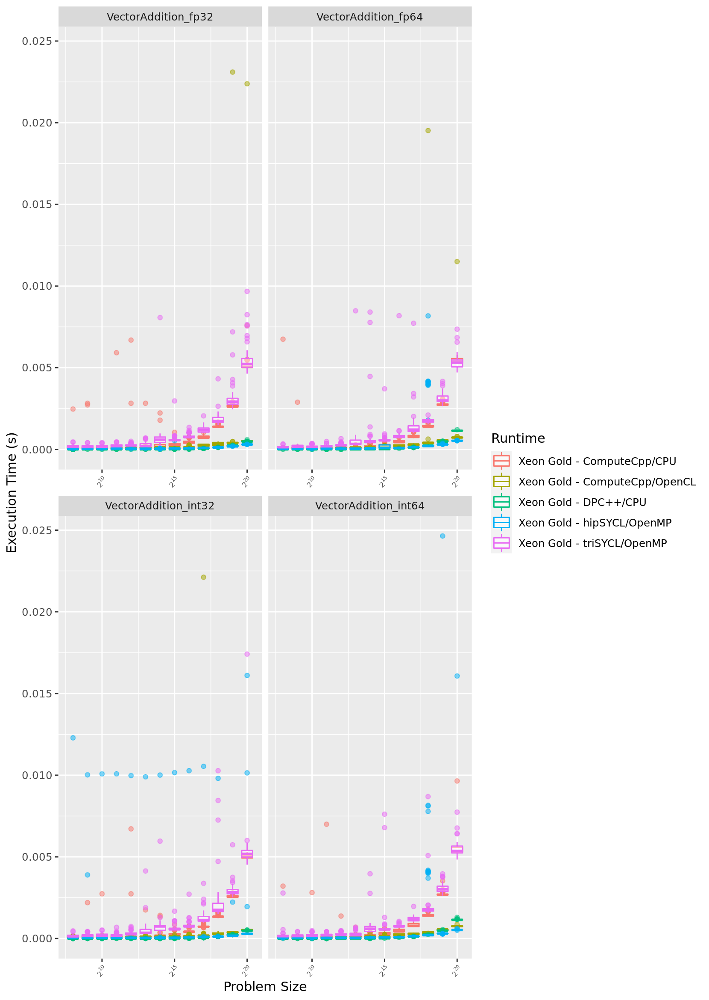

In [533]:
%%R -i vec -i colour_scale -w 8.3 -h 11.7 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')
library('scales')

names(vec) <- make.names(names(vec), unique = FALSE, allow_ = TRUE)


p1 <- ggplot(vec, aes(x=problem.size, y=run.time.sample, colour=Runtime, group = interaction(problem.size, Runtime))) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Problem Size", y="Execution Time (s)") + geom_boxplot(position="identity",alpha=0.5) + colour_scale + facet_wrap( ~ Benchmark.name, strip.position = "top", scales = "free_x") + scale_x_log10("Problem Size", breaks = trans_breaks("log2", function(x) 2^x), labels = trans_format("log2", math_format(2^.x)))
print(p1)


And under a log-transform on the y-axis:

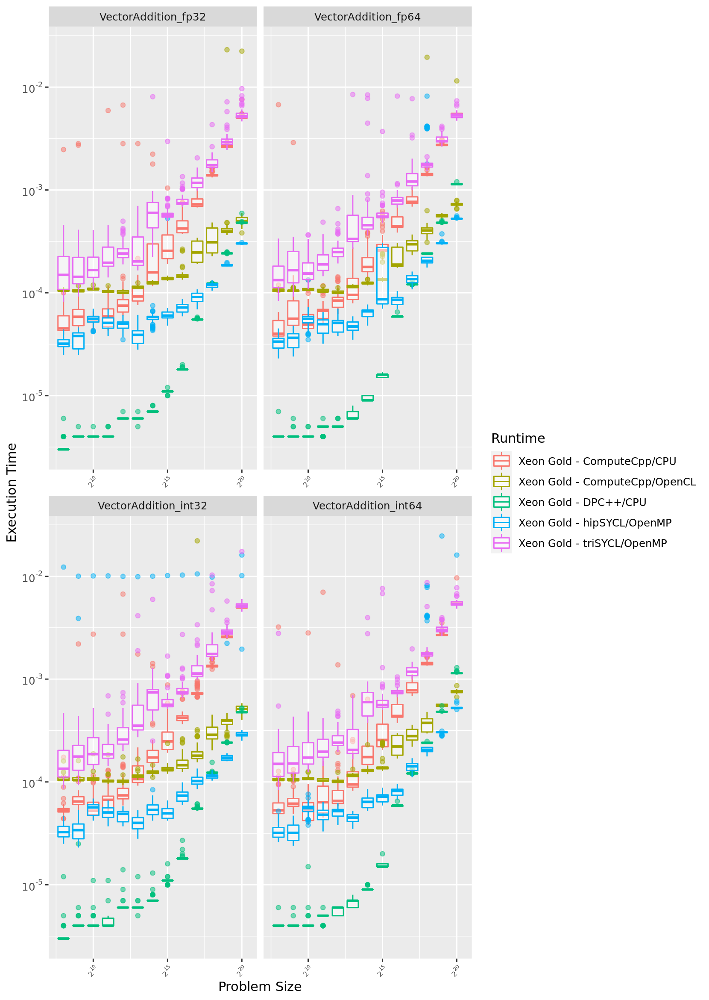

In [535]:
%%R -i vec -i colour_scale -w 8.3 -h 11.7 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')
library('scales')

names(vec) <- make.names(names(vec), unique = FALSE, allow_ = TRUE)


p1 <- ggplot(vec, aes(x=problem.size, y=run.time.sample, colour=Runtime, group = interaction(problem.size, Runtime))) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Problem Size", y="Execution Time (s)") + geom_boxplot(position="identity",alpha=0.5) + colour_scale + facet_wrap( ~ Benchmark.name, strip.position = "top", scales = "free_x") + scale_x_log10("Problem Size", breaks = trans_breaks("log2", function(x) 2^x), labels = trans_format("log2", math_format(2^.x))) + scale_y_log10("Execution Time", breaks = trans_breaks("log10", function(x) 10^x), labels = trans_format("log10", math_format(10^.x)))
print(p1)


Let's try again with more runtime data... that may clear up any trends -- too speculative with just 50 repeats. Run the following script to collect the results --and feel free to change the `--num-runs` in the run suite to whatever you'd prefer. The following data was generated with 1000 repeats.

In [ ]:
! ./run_vec_add_tests.sh

In [549]:
import pandas

vec = pandas.read_csv('./vec_add_tests_ComputeCPP-cpu.csv',comment='#')
vec = pandas.merge(vec, pandas.read_csv('./vec_add_tests_dpc++-cpu.csv',comment='#'),how='outer')
vec = pandas.merge(vec, pandas.read_csv('./vec_add_tests_hipsycl-cpu.csv',comment='#'),how='outer')
vec = pandas.merge(vec, pandas.read_csv('./vec_add_tests_trisycl-cpu.csv',comment='#'),how='outer')
vec = pandas.merge(vec, pandas.read_csv('./vec_add_tests_ComputeCPP-opencl.csv',comment='#'),how='outer')

print("using sample size of:",len(list(map(float,vec['run-time-samples'][0].split()))),"elements per data-point")    

using sample size of: 1000 elements per data-point


Restructure dataframe to split up the `run-time-samples` into separate `run-time-sample` by duplicating each row with a unique sample -- this is for `R` to do the heavy-lifting by generating the box-and-whisker plots and summary statistics.

In [550]:
from tqdm import tqdm


outdat = pandas.DataFrame()

for index, row in tqdm(vec.iterrows(),total=vec.shape[0]):
    samples = row['run-time-samples']
    x = samples.split(' ')
    for y in x:
        tmprow = row
        tmprow['run-time-sample'] = float(y)
        outdat = outdat.append(tmprow)
    
outdat = outdat.drop(columns=['run-time-samples'])

vec = outdat

100%|██████████| 260/260 [2:34:48<00:00, 35.73s/it]  


In [551]:
vec

,Benchmark name,Verification,device-name,kernel-time-mean,kernel-time-median,kernel-time-min,kernel-time-samples,kernel-time-stddev,kernel-time-throughput,local-size,problem-size,run-time-mean,run-time-median,run-time-min,run-time-sample,run-time-stddev,run-time-throughput,sycl-implementation,throughput-metric
0,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000127,0.000049,0.000034,0.000034,0.000586,NaN,ComputeCpp,NaN
0,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000127,0.000049,0.000034,0.000034,0.000586,NaN,ComputeCpp,NaN
0,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000127,0.000049,0.000034,0.000034,0.000586,NaN,ComputeCpp,NaN
0,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000127,0.000049,0.000034,0.000034,0.000586,NaN,ComputeCpp,NaN
0,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000127,0.000049,0.000034,0.000034,0.000586,NaN,ComputeCpp,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259,VectorAddition_fp64,PASS,Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1048576.0,0.001072,0.000912,0.000821,0.014303,0.001418,NaN,ComputeCpp,NaN
259,VectorAddition_fp64,PASS,Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1048576.0,0.001072,0.000912,0.000821,0.015256,0.001418,NaN,ComputeCpp,NaN
259,VectorAddition_fp64,PASS,Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1048576.0,0.001072,0.000912,0.000821,0.015294,0.001418,NaN,ComputeCpp,NaN
259,VectorAddition_fp64,PASS,Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1048576.0,0.001072,0.000912,0.000821,0.016073,0.001418,NaN,ComputeCpp,NaN


We also add the `Runtime` variable which is named according to the `sycl-implementation` and `device-name`. This is needed because all CPU backends cannot query the device name.

In [552]:
def clear_up_runtime (row):
    if row['device-name'] == "Device 66af" and row['sycl-implementation'] == "hipSYCL":
        return "Vega 20 - hipSYCL/ROCm" # (gfx906)
    elif row['device-name'] == "Tesla P100-PCIE-12GB" and row['sycl-implementation'] == "hipSYCL":
        return "Tesla P100 - hipSYCL/CUDA"
    elif row['device-name'] == "hipCPU OpenMP host device" and row['sycl-implementation'] == "hipSYCL":
        return "Xeon Gold - hipSYCL/OpenMP"    
    elif row['device-name'] == "Tesla P100-PCIE-12GB" and row['sycl-implementation'] == "LLVM CUDA (Codeplay)":
        return "Tesla P100 - DPC++/CUDA"
    elif row['device-name'] == "SYCL host device" and row['sycl-implementation'] == 'LLVM (Intel DPC++)':
        return "Xeon Gold - DPC++/CPU"

    
    #todo: generate and check this one:
    elif row['device-name'] == "Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz" and row['sycl-implementation'] == 'LLVM (Intel DPC++)':
        return "Xeon Gold - DPC++/OpenCL"
    
    
    elif row['device-name'] == "Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz" and row['sycl-implementation'] == 'ComputeCpp':
        return "Xeon Gold - ComputeCpp/OpenCL"
    elif row['device-name'] == "Host Device" and row['sycl-implementation'] == 'ComputeCpp':
        return "Xeon Gold - ComputeCpp/CPU"
    elif row['device-name'] == 'unknown' and row['sycl-implementation'] == 'triSYCL':
        return "Xeon Gold - triSYCL/OpenMP"
    else:
        print(device)
    
vec['Runtime'] = vec.apply (lambda row: clear_up_runtime(row), axis=1)

Convert these runtimes to factors.

In [553]:
%%R -i vec -o vec

vec$Runtime <- as.factor(vec$Runtime)

Permanently assign colour to each runtime -- to avoid confusion and colour reuse when plots are broken down into types of accelerator.

In [554]:
%%R -i vec -o colour_scale

# While viridis is a great colour palette, we need high contrast between neighouring elements --like the rainbow palette-- but still need to be colour-blind friendly.
#library('viridisLite')
#colours <- viridisLite::viridis(length(unique(all_res$Runtime)))

#library(RColorBrewer)
#colours <- brewer.pal(length(unique(all_res$Runtime)),'Dark2')

library(scales)
colours <- hue_pal()(length(unique(vec$Runtime)))

names(colours) <- levels(vec$Runtime)
colour_scale <- scale_colour_manual(name = "Runtime",values = colours)

In [555]:
vec

,Benchmark name,Verification,device-name,kernel-time-mean,kernel-time-median,kernel-time-min,kernel-time-samples,kernel-time-stddev,kernel-time-throughput,local-size,problem-size,run-time-mean,run-time-median,run-time-min,run-time-sample,run-time-stddev,run-time-throughput,sycl-implementation,throughput-metric,Runtime
1,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000127,0.000049,0.000034,0.000034,0.000586,NaN,ComputeCpp,NaN,Xeon Gold - ComputeCpp/CPU
2,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000127,0.000049,0.000034,0.000034,0.000586,NaN,ComputeCpp,NaN,Xeon Gold - ComputeCpp/CPU
3,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000127,0.000049,0.000034,0.000034,0.000586,NaN,ComputeCpp,NaN,Xeon Gold - ComputeCpp/CPU
4,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000127,0.000049,0.000034,0.000034,0.000586,NaN,ComputeCpp,NaN,Xeon Gold - ComputeCpp/CPU
5,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000127,0.000049,0.000034,0.000034,0.000586,NaN,ComputeCpp,NaN,Xeon Gold - ComputeCpp/CPU
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259996,VectorAddition_fp64,PASS,Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1048576.0,0.001072,0.000912,0.000821,0.014303,0.001418,NaN,ComputeCpp,NaN,Xeon Gold - ComputeCpp/OpenCL
259997,VectorAddition_fp64,PASS,Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1048576.0,0.001072,0.000912,0.000821,0.015256,0.001418,NaN,ComputeCpp,NaN,Xeon Gold - ComputeCpp/OpenCL
259998,VectorAddition_fp64,PASS,Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1048576.0,0.001072,0.000912,0.000821,0.015294,0.001418,NaN,ComputeCpp,NaN,Xeon Gold - ComputeCpp/OpenCL
259999,VectorAddition_fp64,PASS,Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz,NaN,NaN,NaN,NaN,NaN,NaN,256.0,1048576.0,0.001072,0.000912,0.000821,0.016073,0.001418,NaN,ComputeCpp,NaN,Xeon Gold - ComputeCpp/OpenCL


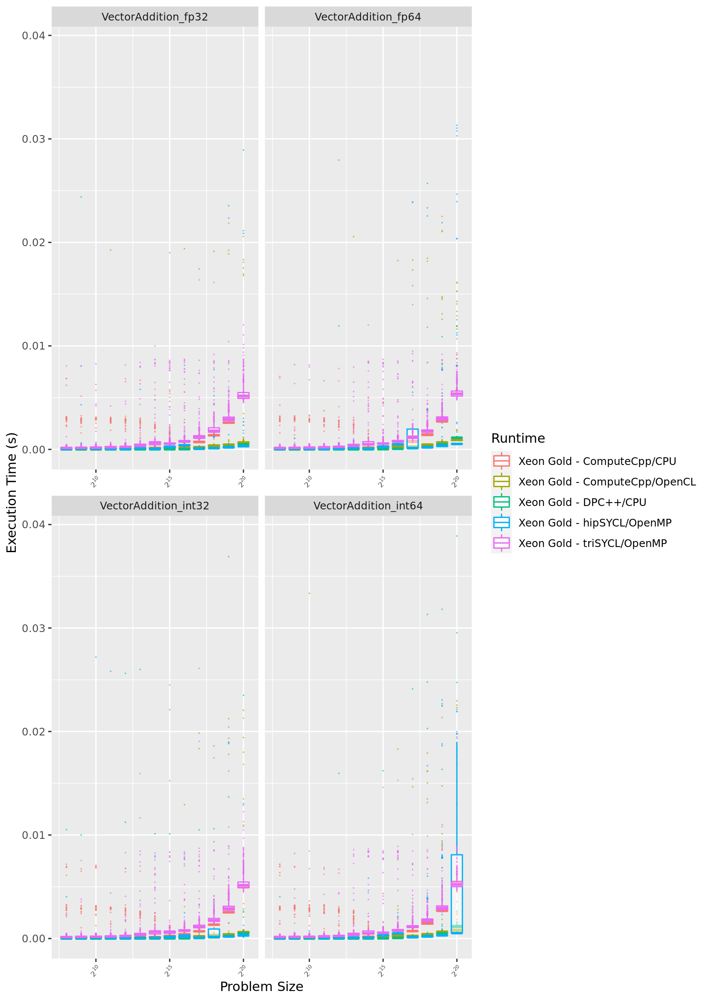

In [558]:
%%R -i vec -i colour_scale -w 8.3 -h 11.7 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')
library('scales')

names(vec) <- make.names(names(vec), unique = FALSE, allow_ = TRUE)


p1 <- ggplot(vec, aes(x=problem.size, y=run.time.sample, colour=Runtime, group = interaction(problem.size, Runtime))) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Problem Size", y="Execution Time (s)") + geom_boxplot(position="identity",alpha=0.5,outlier.size = 0.01) + colour_scale + facet_wrap( ~ Benchmark.name, strip.position = "top", scales = "free_x") + scale_x_log10("Problem Size", breaks = trans_breaks("log2", function(x) 2^x), labels = trans_format("log2", math_format(2^.x)))
print(p1)


And under a log-transform on the y-axis:

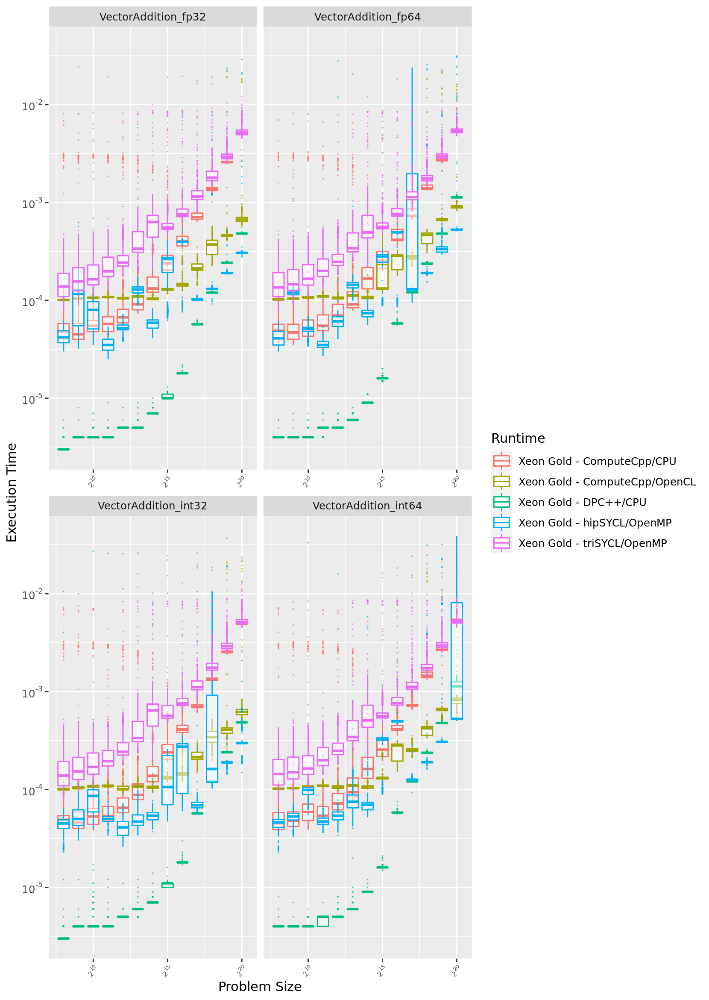

In [559]:
%%R -i vec -i colour_scale -w 8.3 -h 11.7 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')
library('scales')

names(vec) <- make.names(names(vec), unique = FALSE, allow_ = TRUE)


p1 <- ggplot(vec, aes(x=problem.size, y=run.time.sample, colour=Runtime, group = interaction(problem.size, Runtime))) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Problem Size", y="Execution Time (s)") + geom_boxplot(position="identity",alpha=0.5, outlier.size = 0.01) + colour_scale + facet_wrap( ~ Benchmark.name, strip.position = "top", scales = "free_x") + scale_x_log10("Problem Size", breaks = trans_breaks("log2", function(x) 2^x), labels = trans_format("log2", math_format(2^.x))) + scale_y_log10("Execution Time", breaks = trans_breaks("log10", function(x) 10^x), labels = trans_format("log10", math_format(10^.x)))
print(p1)


## Vec-Add over a wider range of Problem Sizes

Repeats (`--run-runs`) were set to 250 and the problem sizes incrementally increasing over the range of 2^8 to 2^30, to examine the longer term effects, such as viewing how performance tapers off between SYCL backend and implementation.


Generated with the following script:

In [ ]:
! ./run_vec_add_big_tests.sh

In [607]:
import pandas

vec = pandas.read_csv('./vec_add_big_tests_ComputeCPP-cpu.csv',comment='#')
vec = pandas.merge(vec, pandas.read_csv('./vec_add_big_tests_dpc++-cpu.csv',comment='#'),how='outer')
vec = pandas.merge(vec, pandas.read_csv('./vec_add_big_tests_hipsycl-cpu.csv',comment='#'),how='outer')
vec = pandas.merge(vec, pandas.read_csv('./vec_add_big_tests_trisycl-cpu.csv',comment='#'),how='outer')
vec = pandas.merge(vec, pandas.read_csv('./vec_add_big_tests_ComputeCPP-opencl.csv',comment='#'),how='outer')

print("using sample size of:",len(list(map(float,vec['run-time-samples'][0].split()))),"elements per data-point")    

using sample size of: 250 elements per data-point


Restructure dataframe to split up the `run-time-samples` into separate `run-time-sample` by duplicating each row with a unique sample -- this is for `R` to do the heavy-lifting by generating the box-and-whisker plots and summary statistics.

In [608]:
from tqdm import tqdm


outdat = pandas.DataFrame()

for index, row in tqdm(vec.iterrows(),total=vec.shape[0]):
    samples = row['run-time-samples']
    x = samples.split(' ')
    for y in x:
        tmprow = row
        tmprow['run-time-sample'] = float(y)
        outdat = outdat.append(tmprow)
    
outdat = outdat.drop(columns=['run-time-samples'])

vec = outdat

100%|██████████| 452/452 [34:00<00:00,  4.51s/it]


In [609]:
vec

,Benchmark name,Verification,device-name,kernel-time-mean,kernel-time-median,kernel-time-min,kernel-time-samples,kernel-time-stddev,kernel-time-throughput,local-size,problem-size,run-time-mean,run-time-median,run-time-min,run-time-sample,run-time-stddev,run-time-throughput,sycl-implementation,throughput-metric
0,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000159,0.000051,0.000035,0.000035,0.000746,NaN,ComputeCpp,NaN
0,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000159,0.000051,0.000035,0.000035,0.000746,NaN,ComputeCpp,NaN
0,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000159,0.000051,0.000035,0.000036,0.000746,NaN,ComputeCpp,NaN
0,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000159,0.000051,0.000035,0.000037,0.000746,NaN,ComputeCpp,NaN
0,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000159,0.000051,0.000035,0.000037,0.000746,NaN,ComputeCpp,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
451,VectorAddition_fp64,PASS,Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz,NaN,NaN,NaN,NaN,NaN,NaN,256.0,536870912.0,0.378730,0.336295,0.262811,0.571703,0.100618,NaN,ComputeCpp,NaN
451,VectorAddition_fp64,PASS,Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz,NaN,NaN,NaN,NaN,NaN,NaN,256.0,536870912.0,0.378730,0.336295,0.262811,0.574669,0.100618,NaN,ComputeCpp,NaN
451,VectorAddition_fp64,PASS,Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz,NaN,NaN,NaN,NaN,NaN,NaN,256.0,536870912.0,0.378730,0.336295,0.262811,0.785879,0.100618,NaN,ComputeCpp,NaN
451,VectorAddition_fp64,PASS,Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz,NaN,NaN,NaN,NaN,NaN,NaN,256.0,536870912.0,0.378730,0.336295,0.262811,0.968766,0.100618,NaN,ComputeCpp,NaN


We also add the `Runtime` variable which is named according to the `sycl-implementation` and `device-name`. This is needed because all CPU backends cannot query the device name.

In [610]:
def clear_up_runtime (row):
    if row['device-name'] == "Device 66af" and row['sycl-implementation'] == "hipSYCL":
        return "Vega 20 - hipSYCL/ROCm" # (gfx906)
    elif row['device-name'] == "Tesla P100-PCIE-12GB" and row['sycl-implementation'] == "hipSYCL":
        return "Tesla P100 - hipSYCL/CUDA"
    elif row['device-name'] == "hipCPU OpenMP host device" and row['sycl-implementation'] == "hipSYCL":
        return "Xeon Gold - hipSYCL/OpenMP"    
    elif row['device-name'] == "Tesla P100-PCIE-12GB" and row['sycl-implementation'] == "LLVM CUDA (Codeplay)":
        return "Tesla P100 - DPC++/CUDA"
    elif row['device-name'] == "SYCL host device" and row['sycl-implementation'] == 'LLVM (Intel DPC++)':
        return "Xeon Gold - DPC++/CPU"

    
    #todo: generate and check this one:
    elif row['device-name'] == "Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz" and row['sycl-implementation'] == 'LLVM (Intel DPC++)':
        return "Xeon Gold - DPC++/OpenCL"
    
    
    elif row['device-name'] == "Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz" and row['sycl-implementation'] == 'ComputeCpp':
        return "Xeon Gold - ComputeCpp/OpenCL"
    elif row['device-name'] == "Host Device" and row['sycl-implementation'] == 'ComputeCpp':
        return "Xeon Gold - ComputeCpp/CPU"
    elif row['device-name'] == 'unknown' and row['sycl-implementation'] == 'triSYCL':
        return "Xeon Gold - triSYCL/OpenMP"
    else:
        print(device)
    
vec['Runtime'] = vec.apply (lambda row: clear_up_runtime(row), axis=1)

Convert these runtimes to factors.

In [611]:
%%R -i vec -o vec

vec$Runtime <- as.factor(vec$Runtime)

Permanently assign colour to each runtime -- to avoid confusion and colour reuse when plots are broken down into types of accelerator.

In [612]:
%%R -i vec -o colour_scale

# While viridis is a great colour palette, we need high contrast between neighouring elements --like the rainbow palette-- but still need to be colour-blind friendly.
#library('viridisLite')
#colours <- viridisLite::viridis(length(unique(all_res$Runtime)))

#library(RColorBrewer)
#colours <- brewer.pal(length(unique(all_res$Runtime)),'Dark2')

library(scales)
colours <- hue_pal()(length(unique(vec$Runtime)))

names(colours) <- levels(vec$Runtime)
colour_scale <- scale_colour_manual(name = "Runtime",values = colours)

In [613]:
vec

,Benchmark name,Verification,device-name,kernel-time-mean,kernel-time-median,kernel-time-min,kernel-time-samples,kernel-time-stddev,kernel-time-throughput,local-size,problem-size,run-time-mean,run-time-median,run-time-min,run-time-sample,run-time-stddev,run-time-throughput,sycl-implementation,throughput-metric,Runtime
1,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000159,0.000051,0.000035,0.000035,0.000746,NaN,ComputeCpp,NaN,Xeon Gold - ComputeCpp/CPU
2,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000159,0.000051,0.000035,0.000035,0.000746,NaN,ComputeCpp,NaN,Xeon Gold - ComputeCpp/CPU
3,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000159,0.000051,0.000035,0.000036,0.000746,NaN,ComputeCpp,NaN,Xeon Gold - ComputeCpp/CPU
4,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000159,0.000051,0.000035,0.000037,0.000746,NaN,ComputeCpp,NaN,Xeon Gold - ComputeCpp/CPU
5,VectorAddition_int32,PASS,Host Device,NaN,NaN,NaN,NaN,NaN,NaN,256.0,256.0,0.000159,0.000051,0.000035,0.000037,0.000746,NaN,ComputeCpp,NaN,Xeon Gold - ComputeCpp/CPU
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112996,VectorAddition_fp64,PASS,Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz,NaN,NaN,NaN,NaN,NaN,NaN,256.0,536870912.0,0.378730,0.336295,0.262811,0.571703,0.100618,NaN,ComputeCpp,NaN,Xeon Gold - ComputeCpp/OpenCL
112997,VectorAddition_fp64,PASS,Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz,NaN,NaN,NaN,NaN,NaN,NaN,256.0,536870912.0,0.378730,0.336295,0.262811,0.574669,0.100618,NaN,ComputeCpp,NaN,Xeon Gold - ComputeCpp/OpenCL
112998,VectorAddition_fp64,PASS,Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz,NaN,NaN,NaN,NaN,NaN,NaN,256.0,536870912.0,0.378730,0.336295,0.262811,0.785879,0.100618,NaN,ComputeCpp,NaN,Xeon Gold - ComputeCpp/OpenCL
112999,VectorAddition_fp64,PASS,Intel(R) Xeon(R) Gold 6134 CPU @ 3.20GHz,NaN,NaN,NaN,NaN,NaN,NaN,256.0,536870912.0,0.378730,0.336295,0.262811,0.968766,0.100618,NaN,ComputeCpp,NaN,Xeon Gold - ComputeCpp/OpenCL


In [614]:
x = vec[(vec['Runtime'] == "Xeon Gold - ComputeCpp/OpenCL")]
x = x[x["problem-size"] == 256]
x = x[x['Benchmark name'] == "VectorAddition_int32"]
len(x) #why was the OpenCL version running the wrong test?

250

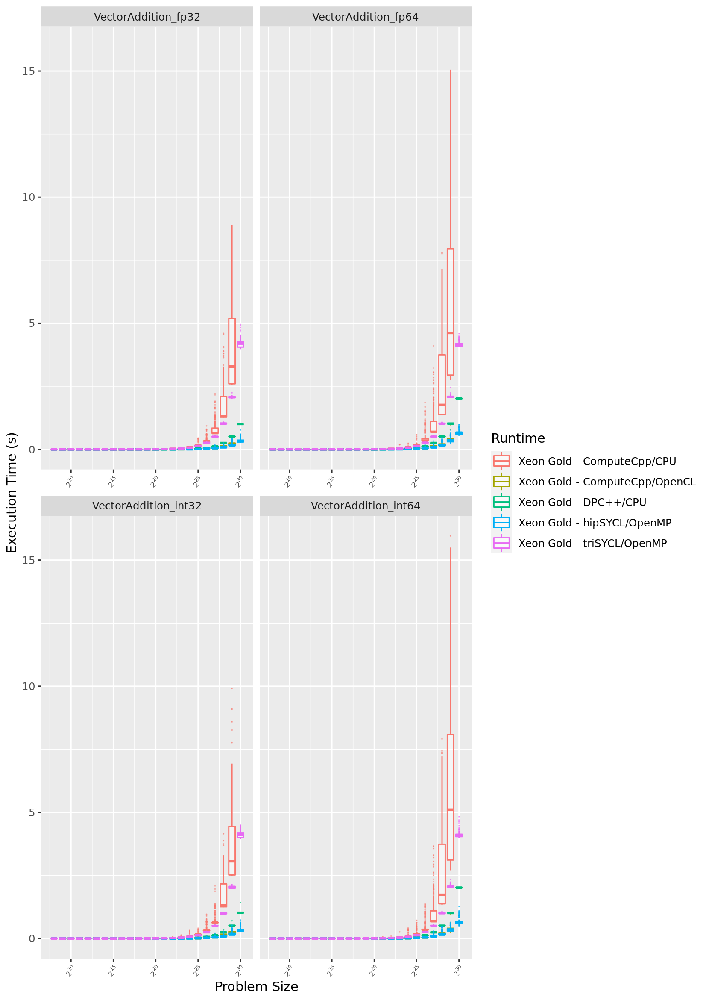

In [615]:
%%R -i vec -i colour_scale -w 8.3 -h 11.7 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')
library('scales')

names(vec) <- make.names(names(vec), unique = FALSE, allow_ = TRUE)


p1 <- ggplot(vec, aes(x=problem.size, y=run.time.sample, colour=Runtime, group = interaction(problem.size, Runtime))) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Problem Size", y="Execution Time (s)") + geom_boxplot(position="identity",alpha=0.5,outlier.size = 0.01) + colour_scale + facet_wrap( ~ Benchmark.name, strip.position = "top", scales = "free_x") + scale_x_log10("Problem Size", breaks = trans_breaks("log2", function(x) 2^x), labels = trans_format("log2", math_format(2^.x)))
print(p1)


And under a log-transform on the y-axis:

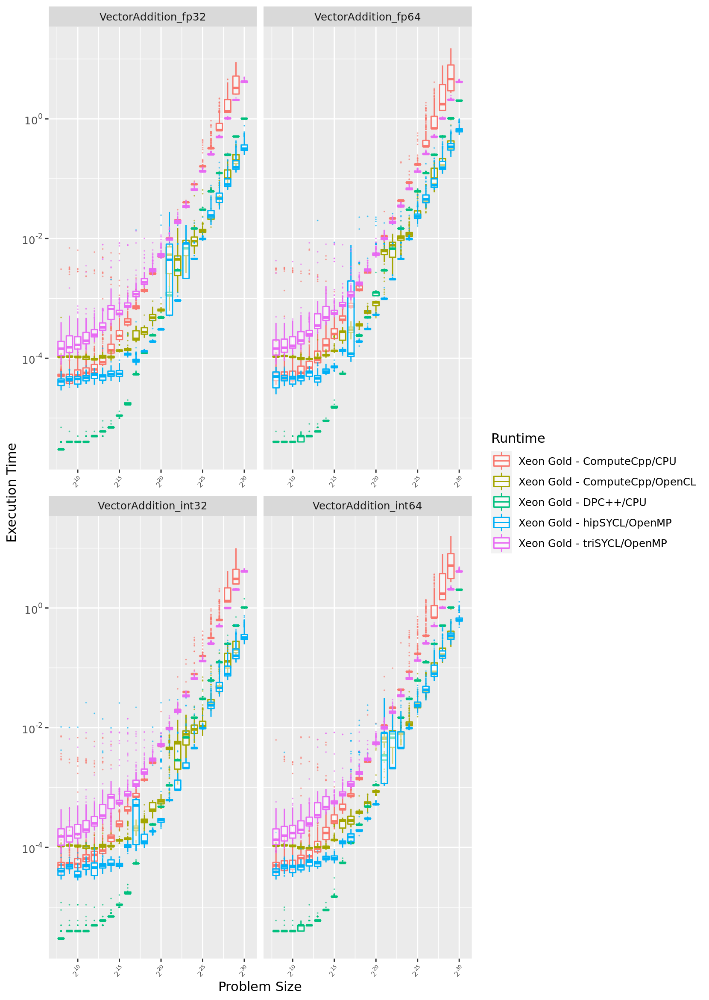

In [616]:
%%R -i vec -i colour_scale -w 8.3 -h 11.7 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')
library('scales')

names(vec) <- make.names(names(vec), unique = FALSE, allow_ = TRUE)


p1 <- ggplot(vec, aes(x=problem.size, y=run.time.sample, colour=Runtime, group = interaction(problem.size, Runtime))) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Problem Size", y="Execution Time (s)") + geom_boxplot(position="identity",alpha=0.5, outlier.size = 0.01) + colour_scale + facet_wrap( ~ Benchmark.name, strip.position = "top", scales = "free_x") + scale_x_log10("Problem Size", breaks = trans_breaks("log2", function(x) 2^x), labels = trans_format("log2", math_format(2^.x))) + scale_y_log10("Execution Time", breaks = trans_breaks("log10", function(x) 10^x), labels = trans_format("log10", math_format(10^.x)))
print(p1)


**Note** rerun these tests when the system is idle.

# Local Work-groups

This outlines the experiment used to see the effect of local-workgroup sizes on different architectures. In particular, are the largest possible even division of tasks by the number of cores the most suited to CPU architectures reguardless of backend? This would mitigate the overhead in the backend languages scheduling policy. What about GPU backends -- does the optimal local workgroup size vary between backends despite using exactly the same architecture?

Unfortunately, the Vector Addition benchmark is in the BKP SYCL Computational Construct and thus does not support setting local workgroup sizes. Instead we add a new version of Vector Addition `vec_add_wgp` with this functionality.


To generate this data on hipSYCL with OpenMP:

In [121]:
#the default/baseline sycl bkp -- where no workgroups are specified
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add --size=1073741824 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
#the serial baseline version -- uses no parallelism
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_serial --size=1073741824 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
#wgp kernels with the OpenMP Number of threads statically set from the command line -- we should know more about the parallelism available in the application than the runtime.
#This set-num-threads should be no greater than the physical cores available in the system.
! OMP_NUM_THREADS=1 LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=1073741824 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! OMP_NUM_THREADS=2 LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=536870912 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! OMP_NUM_THREADS=4 LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=268435456 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! OMP_NUM_THREADS=8 LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=134217728 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! OMP_NUM_THREADS=16 LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=67108864 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! OMP_NUM_THREADS=32 LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=33554432 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
#wgp kernels without overriding the core utilization in OpenMP.
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=32 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=64 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=128 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=256 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=512 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=1024 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=2048 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=4096 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=8192 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=16384 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=32768 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=65536 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=131072 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=262144 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=524288 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=1048576 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=2097152 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=4194304 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=8388608 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=16777216 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=33554432 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=67108864 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=134217728 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=268435456 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=536870912 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-hipsycl-cpu/vec_add_wgp --size=1073741824 --local=1073741824 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"

Problem size=1073741824 # Work Groups=33554432 of 32 big
Problem size=1073741824 # Work Groups=33554432 of 32 big
Problem size=1073741824 # Work Groups=33554432 of 32 big
Problem size=1073741824 # Work Groups=33554432 of 32 big
Problem size=1073741824 # Work Groups=33554432 of 32 big
^C


To generate this data on triSYCL with OpenMP:

In [121]:
#the default/baseline sycl bkp -- where no workgroups are specified
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add --size=1073741824 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
#the serial baseline version -- uses no parallelism
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_serial --size=1073741824 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
#wgp kernels with the OpenMP Number of threads statically set from the command line -- we should know more about the parallelism available in the application than the runtime.
#This set-num-threads should be no greater than the physical cores available in the system.
! OMP_NUM_THREADS=1 LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=1073741824 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! OMP_NUM_THREADS=2 LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=536870912 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! OMP_NUM_THREADS=4 LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=268435456 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! OMP_NUM_THREADS=8 LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=134217728 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! OMP_NUM_THREADS=16 LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=67108864 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! OMP_NUM_THREADS=32 LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=33554432 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
#wgp kernels without overriding the core utilization in OpenMP.
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=32 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=64 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=128 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=256 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=512 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=1024 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=2048 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=4096 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=8192 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=16384 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=32768 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=65536 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=131072 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=262144 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=524288 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=1048576 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=2097152 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=4194304 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=8388608 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=16777216 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=33554432 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=67108864 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=134217728 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=268435456 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=536870912 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib ./new-build-trisycl-cpu/vec_add_wgp --size=1073741824 --local=1073741824 --num-runs=100 --no-verification --output="./local_workgroup_overheads_with_sycl_implementations.csv"

Problem size=1073741824 # Work Groups=33554432 of 32 big
Problem size=1073741824 # Work Groups=33554432 of 32 big
Problem size=1073741824 # Work Groups=33554432 of 32 big
Problem size=1073741824 # Work Groups=33554432 of 32 big
Problem size=1073741824 # Work Groups=33554432 of 32 big
^C


In [158]:
import pandas
vec = pandas.read_csv('./local_workgroup_overheads_with_sycl_implementations.csv', comment='#')

#Rearrange and clean the data
from tqdm import tqdm
outdat = pandas.DataFrame()

for index, row in tqdm(vec.iterrows(),total=vec.shape[0]):
    samples = row['run-time-samples']
    x = samples.split(' ')
    for y in x:
        tmprow = row
        tmprow['run-time-sample'] = float(y)
        outdat = outdat.append(tmprow)
    
outdat = outdat.drop(columns=['run-time-samples'])
vec = outdat

100%|██████████| 34/34 [00:36<00:00,  1.07s/it]


In [159]:
#import pandas
#vec = pandas.read_csv('./split_test.csv',comment='#')
#vec['local-size'].unique()
def clear_up_runtime (row):
    return str(row['sycl-implementation'])
    
vec['runtime'] = vec.apply (lambda row: clear_up_runtime(row), axis=1)

vec = vec.drop(columns=['Verification'])


In [160]:
vec

,Benchmark name,device-name,kernel-time-mean,kernel-time-median,kernel-time-min,kernel-time-samples,kernel-time-stddev,kernel-time-throughput,local-size,problem-size,run-time-mean,run-time-median,run-time-min,run-time-sample,run-time-stddev,run-time-throughput,sycl-implementation,throughput-metric,runtime
0,VectorAddition_int32,hipCPU OpenMP host device,NaN,NaN,NaN,NaN,NaN,NaN,1.073742e+09,1.073742e+09,1.028220,1.003808,0.999748,0.999748,0.084924,NaN,hipSYCL-serial,NaN,hipSYCL-serial
0,VectorAddition_int32,hipCPU OpenMP host device,NaN,NaN,NaN,NaN,NaN,NaN,1.073742e+09,1.073742e+09,1.028220,1.003808,0.999748,0.999770,0.084924,NaN,hipSYCL-serial,NaN,hipSYCL-serial
0,VectorAddition_int32,hipCPU OpenMP host device,NaN,NaN,NaN,NaN,NaN,NaN,1.073742e+09,1.073742e+09,1.028220,1.003808,0.999748,0.999804,0.084924,NaN,hipSYCL-serial,NaN,hipSYCL-serial
0,VectorAddition_int32,hipCPU OpenMP host device,NaN,NaN,NaN,NaN,NaN,NaN,1.073742e+09,1.073742e+09,1.028220,1.003808,0.999748,0.999807,0.084924,NaN,hipSYCL-serial,NaN,hipSYCL-serial
0,VectorAddition_int32,hipCPU OpenMP host device,NaN,NaN,NaN,NaN,NaN,NaN,1.073742e+09,1.073742e+09,1.028220,1.003808,0.999748,0.999823,0.084924,NaN,hipSYCL-serial,NaN,hipSYCL-serial
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33,VectorAddition_int32,hipCPU OpenMP host device,NaN,NaN,NaN,NaN,NaN,NaN,1.677722e+07,1.073742e+09,0.343338,0.321656,0.232281,0.485182,0.063682,NaN,hipSYCL-openmp,NaN,hipSYCL-openmp
33,VectorAddition_int32,hipCPU OpenMP host device,NaN,NaN,NaN,NaN,NaN,NaN,1.677722e+07,1.073742e+09,0.343338,0.321656,0.232281,0.519882,0.063682,NaN,hipSYCL-openmp,NaN,hipSYCL-openmp
33,VectorAddition_int32,hipCPU OpenMP host device,NaN,NaN,NaN,NaN,NaN,NaN,1.677722e+07,1.073742e+09,0.343338,0.321656,0.232281,0.525771,0.063682,NaN,hipSYCL-openmp,NaN,hipSYCL-openmp
33,VectorAddition_int32,hipCPU OpenMP host device,NaN,NaN,NaN,NaN,NaN,NaN,1.677722e+07,1.073742e+09,0.343338,0.321656,0.232281,0.529801,0.063682,NaN,hipSYCL-openmp,NaN,hipSYCL-openmp


In [161]:
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


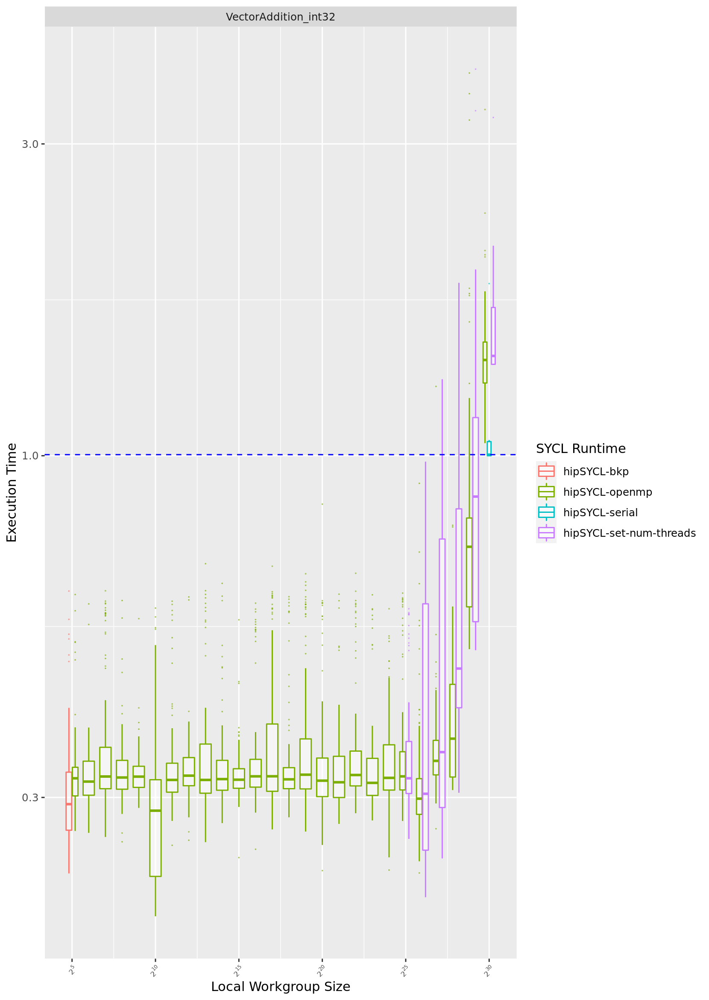

In [162]:
%%R -i vec -w 8.3 -h 11.7 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')
library('scales')

names(vec) <- make.names(names(vec), unique = FALSE, allow_ = TRUE)

p1 <- ggplot(vec, aes(x=local.size, y=run.time.sample, colour=sycl.implementation, group = interaction(local.size, sycl.implementation))) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Local Size", y="Execution Time (s)") + geom_boxplot(position="dodge2",alpha=0.5,outlier.size = 0.01) + facet_wrap( ~ Benchmark.name, strip.position = "top", scales = "free_x") + scale_x_log10("Local Workgroup Size", breaks = trans_breaks("log2", function(x) 2^x), labels = trans_format("log2", math_format(2^.x))) + scale_y_log10("Execution Time") + geom_hline(yintercept=median(subset(vec, sycl.implementation == "hipSYCL-serial")$run.time.sample), linetype="dashed", color = "blue")
ggsave('hipsycl-openmp-workgroup-size-performance.pdf', p1, device="pdf",width=8.3, height=11.7, units="in",dpi=320)

print(p1)

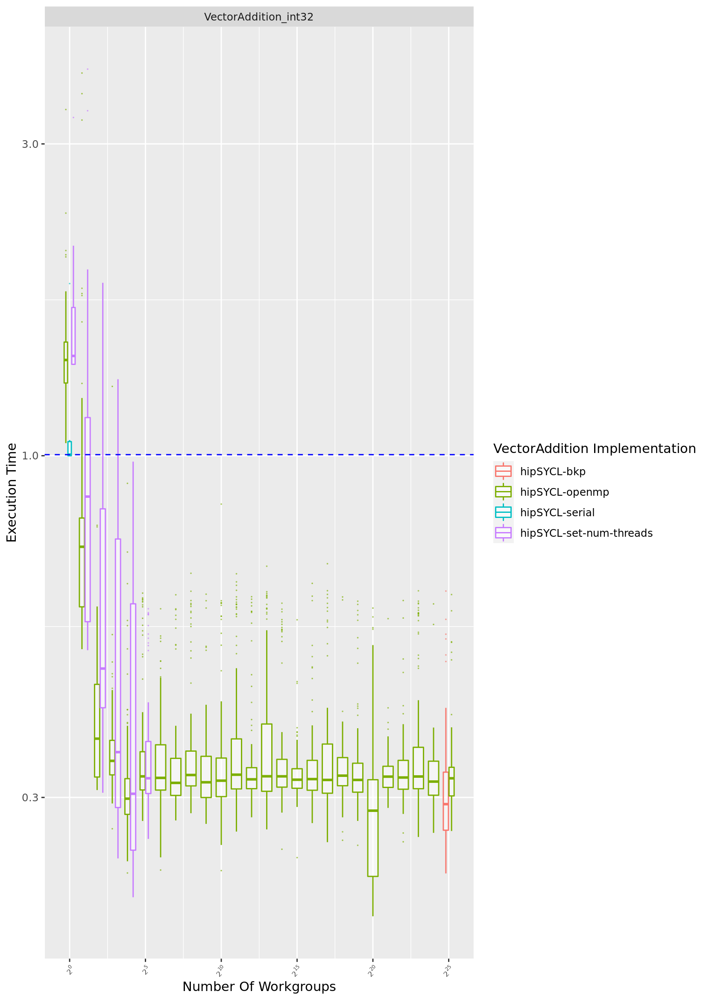

In [163]:
%%R -i vec -w 8.3 -h 11.7 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')
library('scales')

names(vec) <- make.names(names(vec), unique = FALSE, allow_ = TRUE)

vec$num.workgroups = as.integer(vec$problem.size / vec$local.size)

p1 <- ggplot(vec, aes(x=num.workgroups, y=run.time.sample, colour=sycl.implementation, group = interaction(local.size, sycl.implementation))) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "VectorAddition Implementation", x="Number of Workgroups", y="Execution Time (s)") + geom_boxplot(position="dodge2",alpha=0.5,outlier.size = 0.01) + facet_wrap( ~ Benchmark.name, strip.position = "top", scales = "free_x") + scale_x_log10("Number Of Workgroups", breaks = trans_breaks("log2", function(x) 2^x), labels = trans_format("log2", math_format(2^.x))) + scale_y_log10("Execution Time") + geom_hline(yintercept=median(subset(vec, sycl.implementation == "hipSYCL-serial")$run.time.sample), linetype="dashed", color = "blue")

ggsave('hipsycl-openmp-and-using-workgroups.pdf', p1, device="pdf",width=8.3, height=11.7, units="in",dpi=320)
print(p1)

#### triSYCL - with OpenMP

In [130]:
import pandas
vec = pandas.read_csv('./trisycl.csv', comment='#')

#Rearrange and clean the data
from tqdm import tqdm
outdat = pandas.DataFrame()

for index, row in tqdm(vec.iterrows(),total=vec.shape[0]):
    samples = row['run-time-samples']
    x = samples.split(' ')
    for y in x:
        tmprow = row
        tmprow['run-time-sample'] = float(y)
        outdat = outdat.append(tmprow)
    
outdat = outdat.drop(columns=['run-time-samples'])
vec = outdat

def clear_up_runtime (row):
    return str(row['sycl-implementation'])
    
vec['runtime'] = vec.apply (lambda row: clear_up_runtime(row), axis=1)

vec = vec.drop(columns=['Verification'])

100%|██████████| 8/8 [00:00<00:00, 16.43it/s]


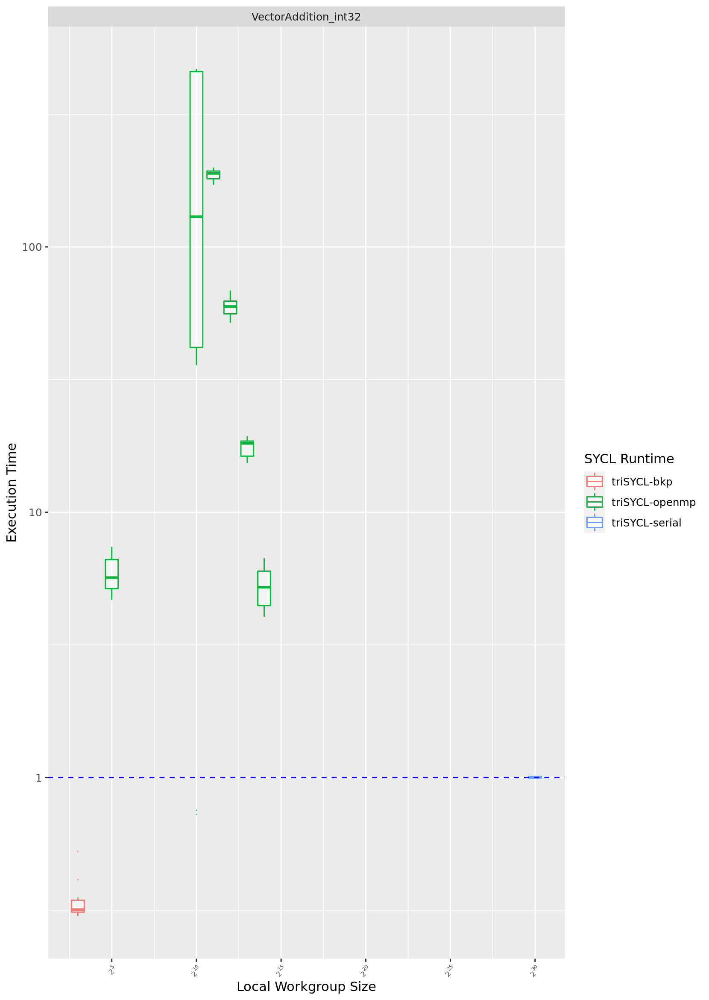

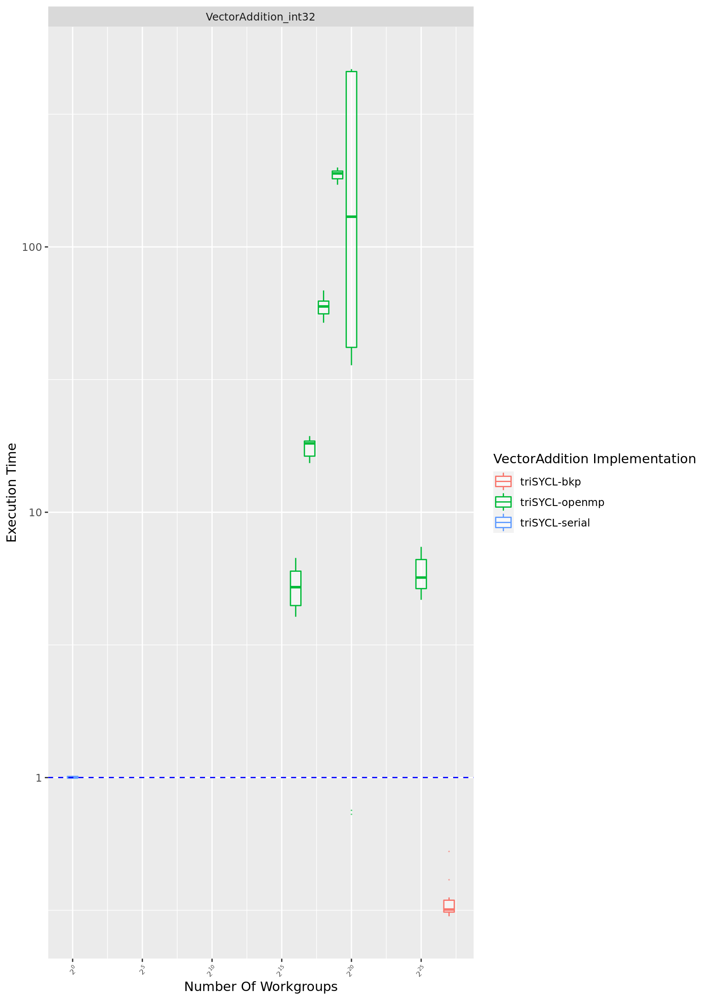

In [156]:
%%R -i vec -w 8.3 -h 11.7 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')
library('scales')

names(vec) <- make.names(names(vec), unique = FALSE, allow_ = TRUE)

p1 <- ggplot(vec, aes(x=local.size, y=run.time.sample, colour=sycl.implementation, group = interaction(local.size, sycl.implementation))) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Local Size", y="Execution Time (s)") + geom_boxplot(position="dodge2",alpha=0.5,outlier.size = 0.01) + facet_wrap( ~ Benchmark.name, strip.position = "top", scales = "free_x") + scale_x_log10("Local Workgroup Size", breaks = trans_breaks("log2", function(x) 2^x), labels = trans_format("log2", math_format(2^.x))) + scale_y_log10("Execution Time") + geom_hline(yintercept=median(subset(vec, sycl.implementation == "triSYCL-serial")$run.time.sample), linetype="dashed", color = "blue")
ggsave('trisycl-openmp-workgroup-size-performance.pdf', p1, device="pdf",width=8.3, height=11.7, units="in",dpi=320)
print(p1)

vec$num.workgroups = as.integer(vec$problem.size / vec$local.size)

p2 <- ggplot(vec, aes(x=num.workgroups, y=run.time.sample, colour=sycl.implementation, group = interaction(local.size, sycl.implementation))) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "VectorAddition Implementation", x="Number of Workgroups", y="Execution Time (s)") + geom_boxplot(position="dodge2",alpha=0.5,outlier.size = 0.01) + facet_wrap( ~ Benchmark.name, strip.position = "top", scales = "free_x") + scale_x_log10("Number Of Workgroups", breaks = trans_breaks("log2", function(x) 2^x), labels = trans_format("log2", math_format(2^.x))) + scale_y_log10("Execution Time") + geom_hline(yintercept=median(subset(vec, sycl.implementation == "triSYCL-serial")$run.time.sample), linetype="dashed", color = "blue")
ggsave('trisycl-openmp-and-using-workgroups.pdf', p2, device="pdf",width=8.3, height=11.7, units="in",dpi=320)

print(p2)

# WGP

In [172]:
import pandas
vec = pandas.read_csv('./vec_add_wgp_hipsycl-cpu.csv', comment='#')

#Rearrange and clean the data
from tqdm import tqdm
outdat = pandas.DataFrame()

for index, row in tqdm(vec.iterrows(),total=vec.shape[0]):
    samples = row['run-time-samples']
    x = samples.split(' ')
    for y in x:
        tmprow = row
        tmprow['run-time-sample'] = float(y)
        outdat = outdat.append(tmprow)
    
outdat = outdat.drop(columns=['run-time-samples'])
vec = outdat

def clear_up_runtime (row):
    return str(row['sycl-implementation'])
    
vec['runtime'] = vec.apply (lambda row: clear_up_runtime(row), axis=1)

vec = vec.drop(columns=['Verification'])

100%|██████████| 8/8 [00:03<00:00,  2.49it/s]


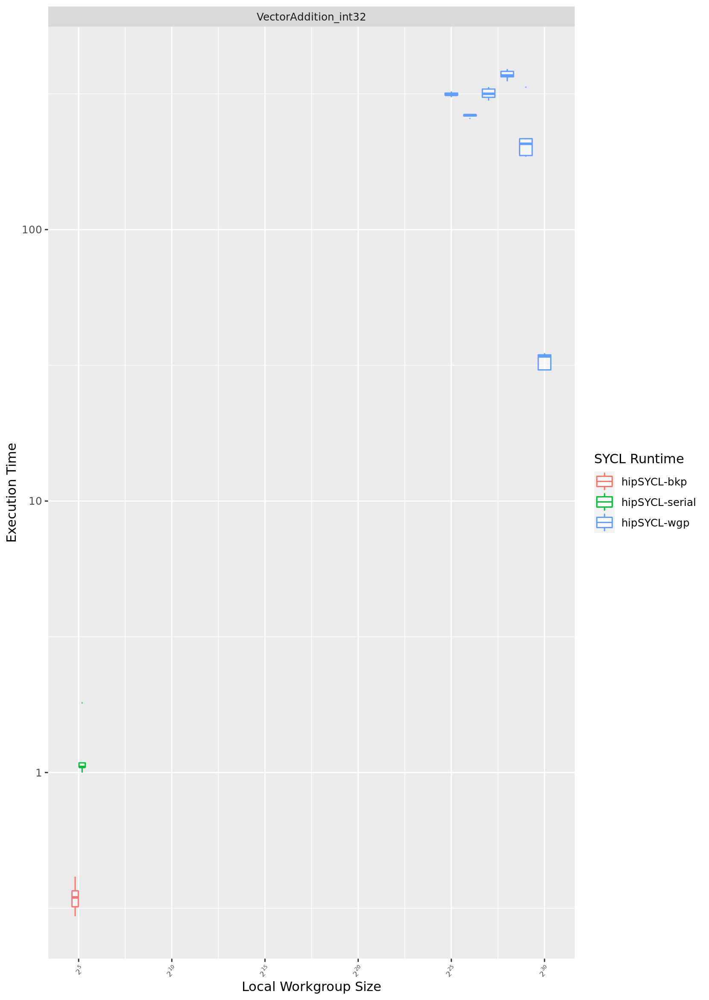

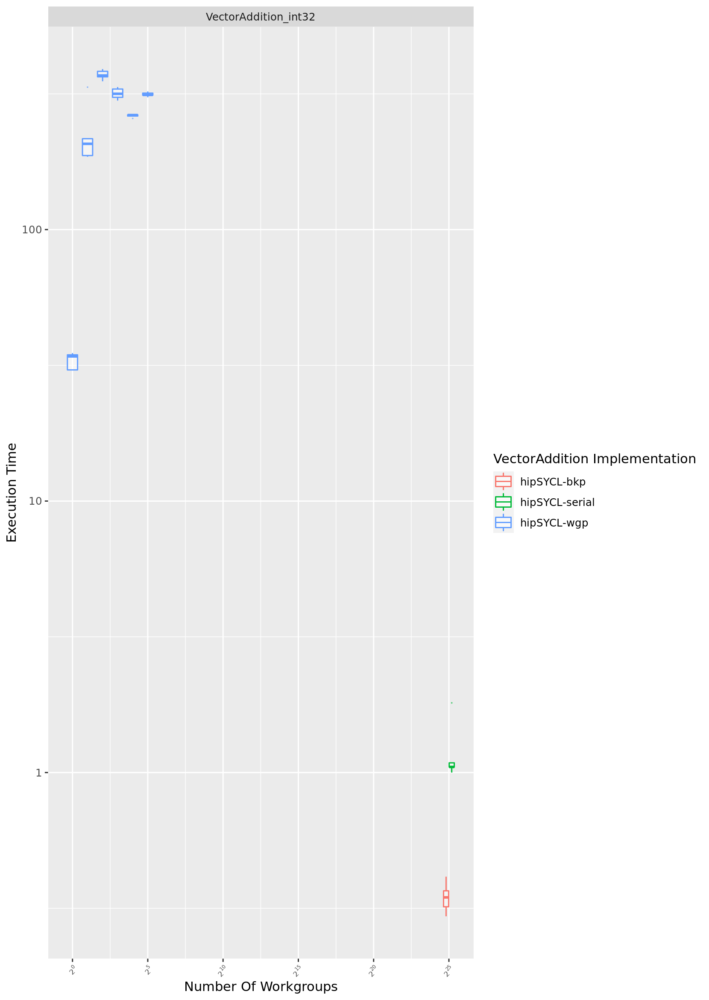

In [174]:
%%R -i vec -w 8.3 -h 11.7 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')
library('scales')

names(vec) <- make.names(names(vec), unique = FALSE, allow_ = TRUE)

p1 <- ggplot(vec, aes(x=local.size, y=run.time.sample, colour=sycl.implementation, group = interaction(local.size, sycl.implementation))) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Local Size", y="Execution Time (s)") + geom_boxplot(position="dodge2",alpha=0.5,outlier.size = 0.01) + facet_wrap( ~ Benchmark.name, strip.position = "top", scales = "free_x") + scale_x_log10("Local Workgroup Size", breaks = trans_breaks("log2", function(x) 2^x), labels = trans_format("log2", math_format(2^.x))) + scale_y_log10("Execution Time") + expand_limits(y = 0) + geom_hline(yintercept=median(subset(vec, sycl.implementation == "triSYCL-serial")$run.time.sample), linetype="dashed", color = "blue")
ggsave('trisycl-openmp-workgroup-size-performance.pdf', p1, device="pdf",width=8.3, height=11.7, units="in",dpi=320)
print(p1)

vec$num.workgroups = as.integer(vec$problem.size / vec$local.size)

p2 <- ggplot(vec, aes(x=num.workgroups, y=run.time.sample, colour=sycl.implementation, group = interaction(local.size, sycl.implementation))) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "VectorAddition Implementation", x="Number of Workgroups", y="Execution Time (s)") + geom_boxplot(position="dodge2",alpha=0.5,outlier.size = 0.01) + facet_wrap( ~ Benchmark.name, strip.position = "top", scales = "free_x") + scale_x_log10("Number Of Workgroups", breaks = trans_breaks("log2", function(x) 2^x), labels = trans_format("log2", math_format(2^.x))) + scale_y_log10("Execution Time") + expand_limits(y = 0) + geom_hline(yintercept=median(subset(vec, sycl.implementation == "triSYCL-serial")$run.time.sample), linetype="dashed", color = "blue")
ggsave('trisycl-openmp-and-using-workgroups.pdf', p2, device="pdf",width=8.3, height=11.7, units="in",dpi=320)

print(p2)

Memory access patterns on the CPU architecture can be traced via cache access and miss rates. We use `perf` as part of the `linux-tools-generic` package.

In [ ]:
! LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/opt/hipSYCL/llvm/lib perf stat -B -e cache-references,cache-misses ./matmul_bkp --size=1024 --num-runs=100

# Matrix Multiplication



In [110]:
import pandas
#matmul = pandas.read_csv('./results/sycl-matmul-implementations-cache-miss-and-execution-times-of-cpu-based-sycl-on-xeon-gold-6134.csv', comment='#')
matmul = pandas.read_csv('./results/sycl-matmul-implementations-cache-miss-and-execution-times-sycl-on-xeon-gold-6134-and-p100.csv', comment='#')

In [111]:
matmul.loc[matmul['Local Size'] == '-','Local Size'] = 1
matmul["Local Size"] = pandas.to_numeric(matmul["Local Size"])
#remove entries without runtimes -- corresponds to tests that won't run or take too long to measure
matmul = matmul.dropna()


from tqdm import tqdm
outdat = pandas.DataFrame()

for index, row in tqdm(matmul.iterrows(),total=matmul.shape[0]):
    samples = row['Runtimes']
    try:
        x = samples.split(' ')
        for y in x:
            tmprow = row
            tmprow['Runtime'] = float(y)
            outdat = outdat.append(tmprow)
    except:
        print(samples)
    
outdat = outdat.drop(columns=['Runtimes'])
matmul = outdat
matmul

100%|██████████| 122/122 [01:05<00:00,  1.87it/s]


,Cache Miss Count,Cache Reference Count,Implementation and Backend,Local Size,Median Runtime,Missed % of all Cache References,Number Of Heavyweight Threads,Runtime,Total Application Execution Time (for 100 runs),Version
0,2387602.0,1.076362e+11,hipSYCL OpenMP,1.0,4.647662,0.002,1,4.645459,465.295673,Serial
0,2387602.0,1.076362e+11,hipSYCL OpenMP,1.0,4.647662,0.002,1,4.645638,465.295673,Serial
0,2387602.0,1.076362e+11,hipSYCL OpenMP,1.0,4.647662,0.002,1,4.646228,465.295673,Serial
0,2387602.0,1.076362e+11,hipSYCL OpenMP,1.0,4.647662,0.002,1,4.646532,465.295673,Serial
0,2387602.0,1.076362e+11,hipSYCL OpenMP,1.0,4.647662,0.002,1,4.646670,465.295673,Serial
...,...,...,...,...,...,...,...,...,...,...
186,45978777.0,7.063508e+07,hipSYCL ROCm,32.0,0.003401,65.093,32,0.003459,1.428545,WGP
186,45978777.0,7.063508e+07,hipSYCL ROCm,32.0,0.003401,65.093,32,0.003462,1.428545,WGP
186,45978777.0,7.063508e+07,hipSYCL ROCm,32.0,0.003401,65.093,32,0.003464,1.428545,WGP
186,45978777.0,7.063508e+07,hipSYCL ROCm,32.0,0.003401,65.093,32,0.003466,1.428545,WGP


In [112]:
df = matmul
df = df.replace('ComputeCPP OpenCL-Gold','ComputeCPP OpenCL - Gold')
df = df.replace('ComputeCPP pthreads','ComputeCPP pthreads - Gold')
df = df.replace('DPC++ CUDA','DPC++ CUDA - P100')
df = df.replace('DPC++ pthreads','DPC++ pthreads - Gold')
df = df.replace('hipSYCL CUDA','hipSYCL CUDA - P100')
df = df.replace('hipSYCL OpenMP','hipSYCL OpenMP - Gold')
df = df.replace('hipSYCL ROCm','hipSYCL ROCm - gfx906')
df = df.replace('triSYCL OpenMP','triSYCL OpenMP - Gold')
matmul = df


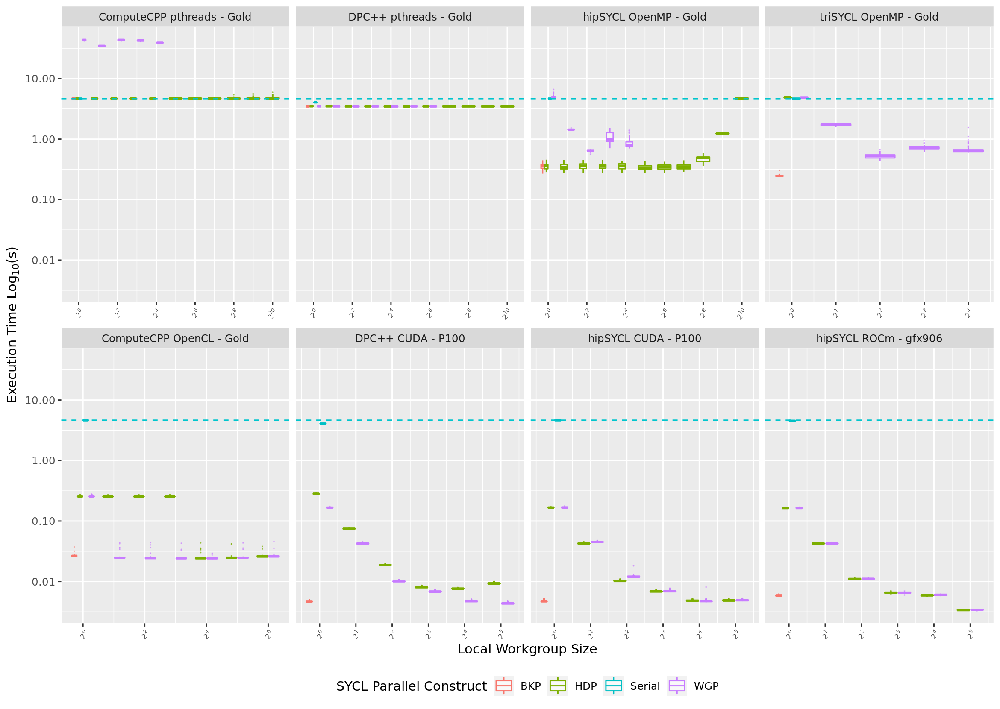

In [388]:
%%R -i matmul -w 11.7 -h 8.3 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')
library('scales')
library('ggpattern')

names(matmul) <- make.names(names(matmul), unique = FALSE, allow_ = TRUE)

#print(matmul$Implementation.and.Backend)
matmul$Implementation.and.Backend <- factor(matmul$Implementation.and.Backend, levels = c("ComputeCPP pthreads - Gold", "DPC++ pthreads - Gold", "hipSYCL OpenMP - Gold", "triSYCL OpenMP - Gold",  "ComputeCPP OpenCL - Gold", "DPC++ CUDA - P100","hipSYCL CUDA - P100", "hipSYCL ROCm - gfx906"))

#print(matmul$Version <- as.factor(matmul$Version))
#matmul$Local.Size=as.numeric(levels(matmul$Local.Size))[matmul$Local.Size]
#colour=Implementation.and.Backend, fill=Version, group = interaction(Local.Size, Implementation.and.Backend,Version)
#p1 <- ggplot(matmul, aes(x=Local.Size, y=Runtime,group=interaction(Local.Size,Implementation.and.Backend,Version))) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Local Size", y="Execution Time (s)") + ggpattern::geom_boxplot_pattern(aes(pattern=Version,fill=Version,color=Version),pattern_spacing=0.02, position="dodge2",alpha=0.5,outlier.size = 0.01) + scale_x_log10("Local Workgroup Size", breaks = trans_breaks("log2", function(x) 2^x), labels = trans_format("log2", math_format(2^.x))) + scale_y_log10("Log(Execution Time[s])") + expand_limits(y = 0) + geom_hline(yintercept=median(subset(matmul, version == "Serial")$Runtime), linetype="dashed", color = "blue")

#p <- ggplot(mpg, aes(class, hwy)) +
#  geom_boxplot_pattern(
#    aes(
#      pattern      = class,
#      pattern_fill = class
#    ),
#    pattern_spacing = 0.03
#  ) +
#  theme_bw(18) +
#  labs(title = "ggpattern::geom_boxplot_pattern()") +
#  theme(legend.position = 'none') +
#  coord_fixed(1/8)
#print(p)
#ggsave('trisycl-openmp-workgroup-size-performance.pdf', p1, device="pdf",width=8.3, height=11.7, units="in",dpi=320)
p1 <- ggplot(matmul, aes(x=Local.Size, y=Runtime,colour=Version,group=interaction(Local.Size,Version))) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6),legend.position="bottom") + expand_limits(y = 0) + labs(colour = "SYCL Parallel Construct", x="Local Size", y="Execution Time (s)") + geom_boxplot(position="dodge2",alpha=0.5,outlier.size = 0.01) + scale_x_log10("Local Workgroup Size", breaks = trans_breaks("log2", function(x) 2^x), labels = trans_format("log2", math_format(2^.x))) + scale_y_log10(TeX("Execution Time $\\Log_{10}$(s)")) + expand_limits(y = 0) + facet_wrap( ~ Implementation.and.Backend, strip.position = "top", scales = "free_x", nrow=2) +
    geom_hline(yintercept=median(subset(matmul, Version == "Serial")$Runtime), linetype="dashed", color = "turquoise3")

#print(median(subset(matmul, Version == "Serial")$Runtime))
ggsave('matmul-local-performance.pdf', p1, device="pdf",width=11.7, height=8.3, units="in",dpi=320)

print(p1)


Alternatively, the number of workgroups -- inverse to local workgroup size.

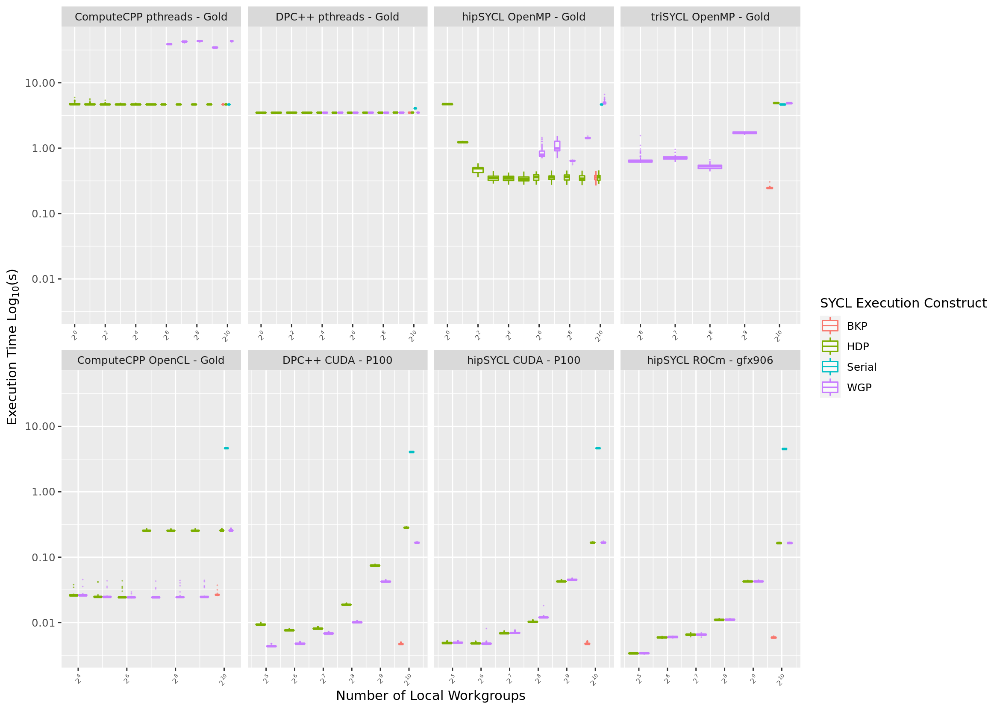

In [93]:
%%R -i matmul -w 11.7 -h 8.3 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')
library('scales')
library('ggpattern')

names(matmul) <- make.names(names(matmul), unique = FALSE, allow_ = TRUE)
matmul$Implementation.and.Backend <- factor(matmul$Implementation.and.Backend, levels = c("ComputeCPP pthreads - Gold", "DPC++ pthreads - Gold", "hipSYCL OpenMP - Gold", "triSYCL OpenMP - Gold",  "ComputeCPP OpenCL - Gold", "DPC++ CUDA - P100","hipSYCL CUDA - P100", "hipSYCL ROCm - gfx906"))
matmul$Number.of.Workgroups = as.integer(1024/matmul$Local.Size)
p2 <- ggplot(matmul, aes(x=Number.of.Workgroups, y=Runtime,colour=Version,group=interaction(Local.Size,Version))) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Execution Construct", x="Local Size", y="Execution Time (s)") + geom_boxplot(position="dodge2",alpha=0.5,outlier.size = 0.01) + scale_x_log10("Number of Local Workgroups", breaks = trans_breaks("log2", function(x) 2^x), labels = trans_format("log2", math_format(2^.x))) + scale_y_log10(TeX("Execution Time $\\Log_{10}$(s)")) + expand_limits(y = 0) + facet_wrap( ~ Implementation.and.Backend, strip.position = "top", scales = "free_x", nrow=2)    
ggsave('matmul-number-of-workgroups-performance.pdf', p2, device="pdf",width=8.3, height=11.7, units="in",dpi=320)

print(p2)

Percentage of Missed Cache References:

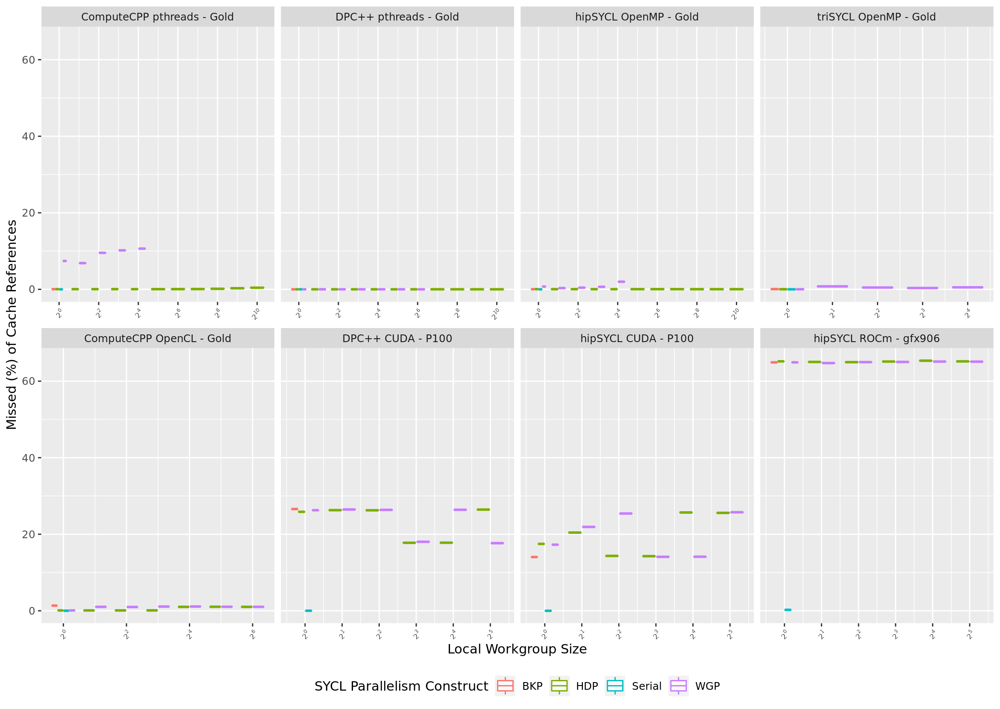

In [385]:
%%R -i matmul -w 11.7 -h 8.3 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')
library('scales')
library('ggpattern')
names(matmul) <- make.names(names(matmul), unique = FALSE, allow_ = TRUE)
matmul$Implementation.and.Backend <- factor(matmul$Implementation.and.Backend, levels = c("ComputeCPP pthreads - Gold", "DPC++ pthreads - Gold", "hipSYCL OpenMP - Gold", "triSYCL OpenMP - Gold",  "ComputeCPP OpenCL - Gold", "DPC++ CUDA - P100","hipSYCL CUDA - P100", "hipSYCL ROCm - gfx906"))

p1 <- ggplot(matmul, aes(x=Local.Size, y=Missed...of.all.Cache.References,colour=Version,group=interaction(Local.Size,Version))) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6),legend.position="bottom") + expand_limits(y = 0) + labs(colour = "SYCL Parallelism Construct", x="Local Size", y="Missed (%) of Cache References") + geom_boxplot(position="dodge2",alpha=0.5,outlier.size = 0.01) + scale_x_log10("Local Workgroup Size", breaks = trans_breaks("log2", function(x) 2^x), labels = trans_format("log2", math_format(2^.x))) + expand_limits(y = 0) + facet_wrap( ~ Implementation.and.Backend, strip.position = "top", scales = "free_x", nrow=2) + geom_hline(yintercept=median(subset(matmul, version == "Serial")$Runtime), linetype="dashed", color = "blue")
ggsave('matmul-local-cache-miss.pdf', p1, device="pdf",width=8.3, height=11.7, units="in",dpi=320)
print(p1)


Absolute Number of Cache References -- for 100 repeats/samples:

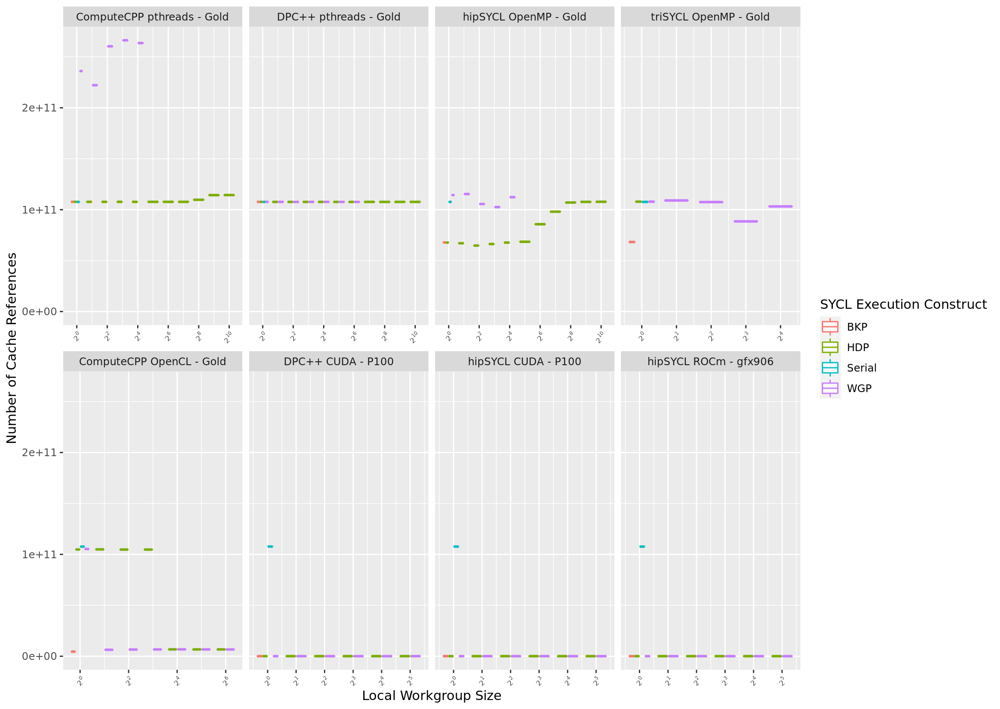

In [101]:
%%R -i matmul -w 11.7 -h 8.3 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')
library('scales')
library('ggpattern')
names(matmul) <- make.names(names(matmul), unique = FALSE, allow_ = TRUE)
matmul$Implementation.and.Backend <- factor(matmul$Implementation.and.Backend, levels = c("ComputeCPP pthreads - Gold", "DPC++ pthreads - Gold", "hipSYCL OpenMP - Gold", "triSYCL OpenMP - Gold",  "ComputeCPP OpenCL - Gold", "DPC++ CUDA - P100","hipSYCL CUDA - P100", "hipSYCL ROCm - gfx906"))

p1 <- ggplot(matmul, aes(x=Local.Size, y=Cache.Reference.Count,colour=Version,group=interaction(Local.Size,Version))) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Execution Construct", x="Local Size", y="Number of Cache References") + geom_boxplot(position="dodge2",alpha=0.5,outlier.size = 0.01) + scale_x_log10("Local Workgroup Size", breaks = trans_breaks("log2", function(x) 2^x), labels = trans_format("log2", math_format(2^.x))) + expand_limits(y = 0) + facet_wrap( ~ Implementation.and.Backend, strip.position = "top", scales = "free_x", nrow=2) + geom_hline(yintercept=median(subset(matmul, version == "Serial")$Runtime), linetype="dashed", color = "blue")
ggsave('matmul-local-total-cache-references.pdf', p1, device="pdf",width=8.3, height=11.7, units="in",dpi=320)
print(p1)


Absolute Number of Cache Misses -- for 100 repeats/samples:

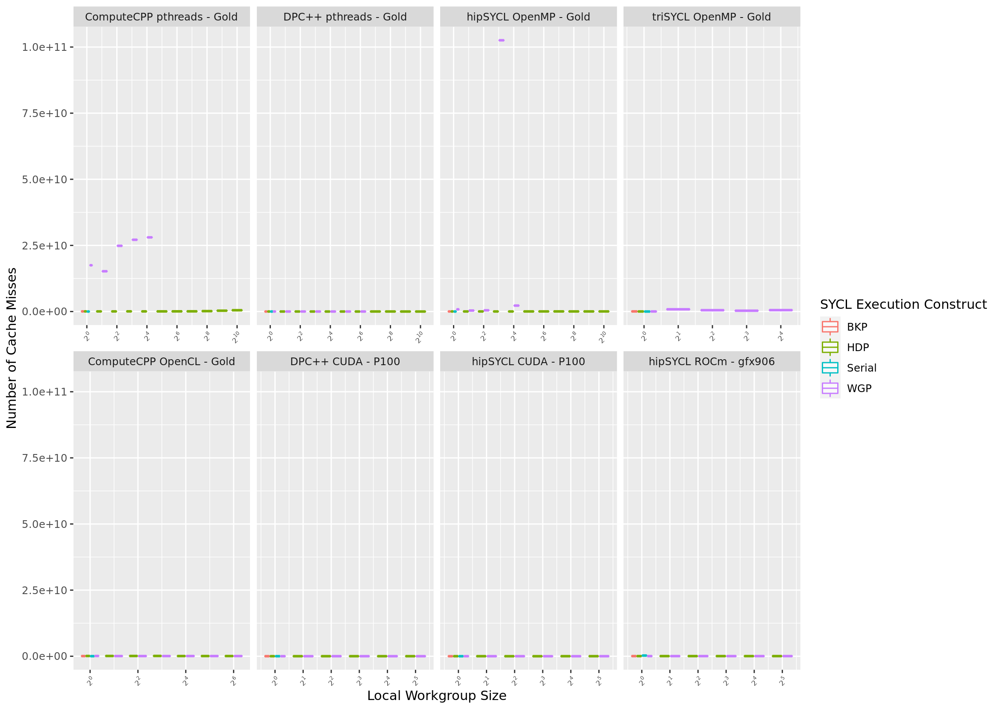

In [102]:
%%R -i matmul -w 11.7 -h 8.3 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')
library('scales')
library('ggpattern')
names(matmul) <- make.names(names(matmul), unique = FALSE, allow_ = TRUE)
matmul$Implementation.and.Backend <- factor(matmul$Implementation.and.Backend, levels = c("ComputeCPP pthreads - Gold", "DPC++ pthreads - Gold", "hipSYCL OpenMP - Gold", "triSYCL OpenMP - Gold",  "ComputeCPP OpenCL - Gold", "DPC++ CUDA - P100","hipSYCL CUDA - P100", "hipSYCL ROCm - gfx906"))

p1 <- ggplot(matmul, aes(x=Local.Size, y=Cache.Miss.Count,colour=Version,group=interaction(Local.Size,Version))) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Execution Construct", x="Local Size", y="Number of Cache Misses") + geom_boxplot(position="dodge2",alpha=0.5,outlier.size = 0.01) + scale_x_log10("Local Workgroup Size", breaks = trans_breaks("log2", function(x) 2^x), labels = trans_format("log2", math_format(2^.x))) + expand_limits(y = 0) + facet_wrap( ~ Implementation.and.Backend, strip.position = "top", scales = "free_x", nrow=2) + geom_hline(yintercept=median(subset(matmul, version == "Serial")$Runtime), linetype="dashed", color = "blue")
ggsave('matmul-local-total-cache-miss.pdf', p1, device="pdf",width=8.3, height=11.7, units="in",dpi=320)
print(p1)


Percentage of Missed Cache References for just the CPU:

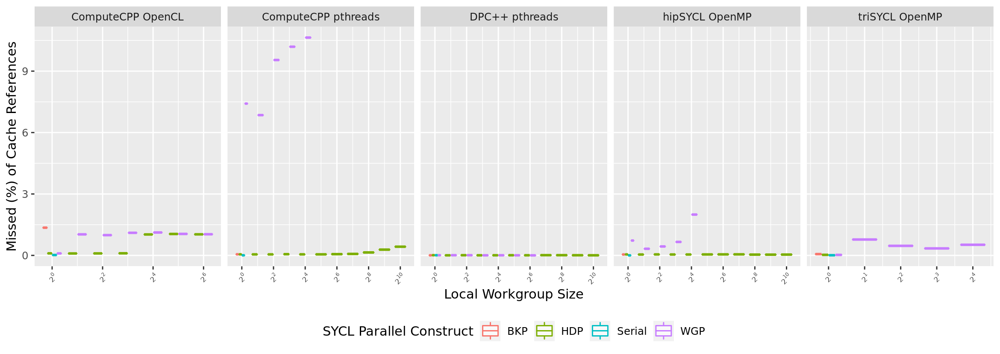

In [423]:
%%R -i matmul -w 11.7 -h 4.15 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')
library('scales')
library('ggpattern')
names(matmul) <- make.names(names(matmul), unique = FALSE, allow_ = TRUE)
matmul$Implementation.and.Backend <- factor(matmul$Implementation.and.Backend, levels = c("ComputeCPP pthreads - Gold", "DPC++ pthreads - Gold", "hipSYCL OpenMP - Gold", "triSYCL OpenMP - Gold",  "ComputeCPP OpenCL - Gold", "DPC++ CUDA - P100","hipSYCL CUDA - P100", "hipSYCL ROCm - gfx906"))

matmul <- subset(matmul,Implementation.and.Backend!="DPC++ CUDA - P100" & Implementation.and.Backend!="hipSYCL CUDA - P100" & Implementation.and.Backend!="hipSYCL ROCm - gfx906")

#having "Gold" in the names of the backend is redundant -- this is only showing the CPU device for cache misses!
matmul$Implementation.and.Backend <- sub(" - Gold$", "", matmul$Implementation.and.Backend)

p1 <- ggplot(matmul, aes(x=Local.Size, y=Missed...of.all.Cache.References,colour=Version,group=interaction(Local.Size,Version))) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6),legend.position="bottom") + expand_limits(y = 0) + labs(colour = "SYCL Parallel Construct", x="Local Size", y="Missed (%) of Cache References") + geom_boxplot(position="dodge2",alpha=0.5,outlier.size = 0.01) + scale_x_log10("Local Workgroup Size", breaks = trans_breaks("log2", function(x) 2^x), labels = trans_format("log2", math_format(2^.x))) + expand_limits(y = 0) + facet_wrap( ~ Implementation.and.Backend, strip.position = "top", scales = "free_x", nrow=1) + geom_hline(yintercept=median(subset(matmul, version == "Serial")$Runtime), linetype="dashed", color = "blue")
ggsave('matmul-cpu-local-cache-miss.pdf', p1, device="pdf",width=11.7, height=4.15, units="in",dpi=320)
print(p1)


# SYCL-Bench Figures


In [363]:
wgp_fp['Benchmark name'] = wgp_fp['Benchmark name'].str.replace("_NDRange","")
hdp['Benchmark name'] = hdp['Benchmark name'].str.replace("_Hierarchical","")
hdp['Benchmark name'] = hdp['Benchmark name'].str.replace("_HierarchicalParallelFor","")
task['Benchmark name'] = task['Benchmark name'].str.replace("_SingleTask","")
sync['Benchmark name'] = sync['Benchmark name'].str.replace("_NDRange","")


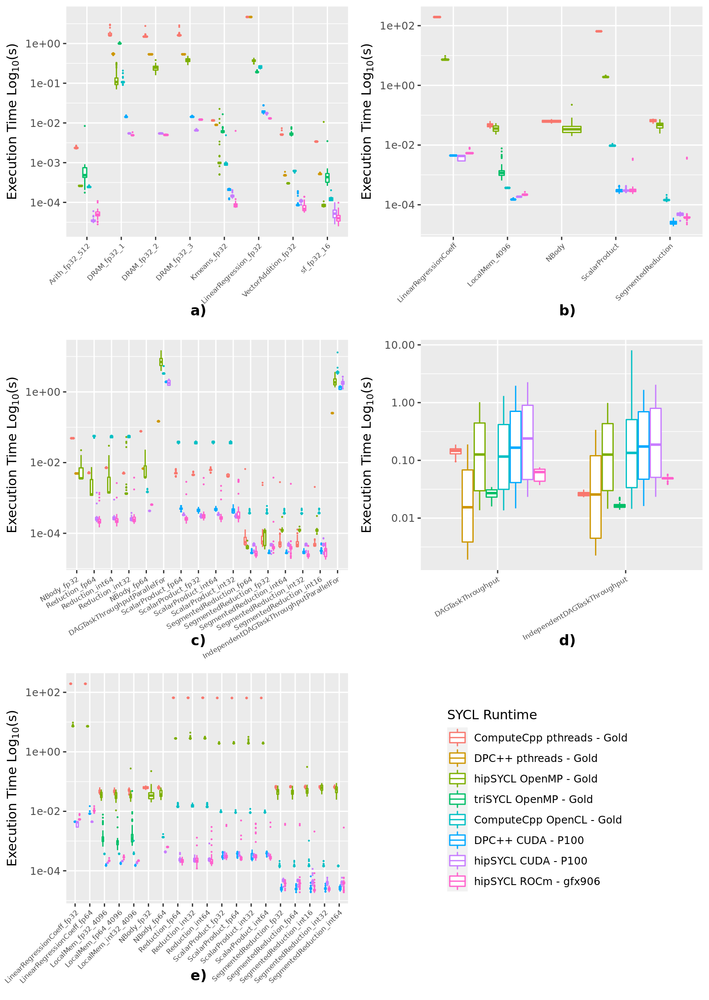

In [383]:
%%R -i bkp_fp32 -i wgp_fp -i hdp -i task -i sync -i colour_scale -h 11.7 -w 8.3 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(bkp_fp32) <- make.names(names(bkp_fp32), unique = FALSE, allow_ = TRUE)
p1 <- ggplot(bkp_fp32, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark Name", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale
#ggsave('bkp-float.pdf', p1, device="pdf",width=11.7, height=8.3, units="in",dpi=320)

names(wgp_fp) <- make.names(names(wgp_fp), unique = FALSE, allow_ = TRUE)
wgp_fp$data.type.width <- reorder(wgp_fp$data.type.width, as.numeric(wgp_fp$data.type.width))
wgp_fp$Benchmark.name <- gsub("_NDRange", "", wgp_fp$Benchmark.name)
wgp_fp <- subset(wgp_fp, data.type.width=="32")
levels(wgp_fp$data.type.width) <- paste("fp",levels(wgp_fp$data.type.width),sep='')
p2 <- ggplot(wgp_fp, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale

names(hdp) <- make.names(names(hdp), unique = FALSE, allow_ = TRUE)
p3 <- ggplot(hdp, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 30, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale + scale_x_discrete(limits = rev(unique(hdp$Benchmark.name)))

names(task) <- make.names(names(task), unique = FALSE, allow_ = TRUE)
p4 <- ggplot(task, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 30, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="SYCL-Bench Application", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale

names(sync) <- make.names(names(sync), unique = FALSE, allow_ = TRUE)
p5 <- ggplot(sync, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1, size = 6)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="SYCL-Bench Application", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale

library('cowplot')
pg <- plot_grid(p1 + theme(legend.position="none", axis.title.x=element_blank()),
                p2 + theme(legend.position="none", axis.title.x=element_blank()),
                p3 + theme(legend.position="none", axis.title.x=element_blank()),
                p4 + theme(legend.position="none", axis.title.x=element_blank()),
                p5 + theme(legend.position="none", axis.title.x=element_blank()),
                align = 'vh', hjust = -2, ncol = 2)

pg <- pg + draw_plot_label(label=c("a)", "b)", "c)", "d)","e)"),
                           x=c(0.28,0.8,0.28,0.8,0.28),
                           y=c(0.69,0.69,0.36,0.36,0.025),
                           hjust=.5, vjust=.5, size=12)

#bottom legend
legend <- get_legend(p1 + guides(color = guide_legend(ncol = 1,title="SYCL Runtime")) + theme(legend.position = "right"))
#bp <- plot_grid(pg, legend, rel_heights = c(1, .1),nrow=2)

pg <- pg + draw_grob(legend, 0.75, -0.3, 0, 1)
print(pg)
ggsave('sycl-bench-res.pdf', pg, device="pdf",height=11.7, width=8.3, units="in",dpi=320)


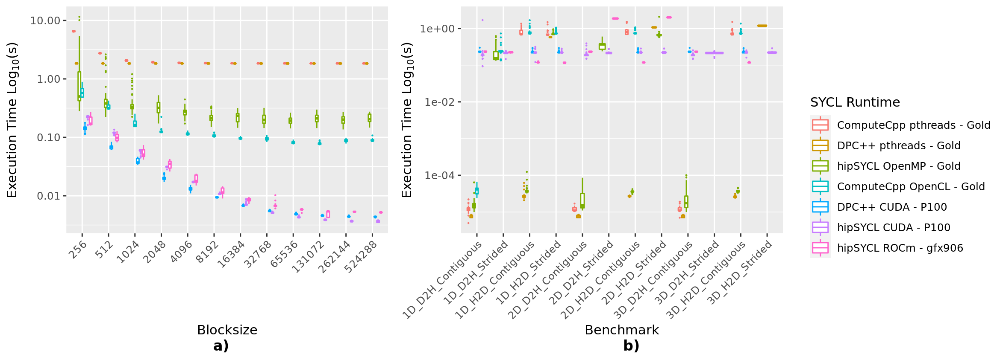

In [422]:
%%R -i bkp_bandw -i bkp_block512 -i colour_scale -w 11.7 -h 4.15 --units in -r 200

outlier_size = 0.10

library('ggplot2')
library('latex2exp')

names(bkp_block512) <- make.names(names(bkp_block512), unique = FALSE, allow_ = TRUE)
bkp_block512$blocksize <- reorder(bkp_block512$blocksize, as.numeric(bkp_block512$blocksize))
p0 <- ggplot(bkp_block512, aes(x=blocksize, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Blocksize", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale

names(bkp_bandw) <- make.names(names(bkp_bandw), unique = FALSE, allow_ = TRUE)
p1 <- ggplot(bkp_bandw, aes(x=Benchmark.name, y=run.time.sample, colour=Runtime)) + theme(axis.text.x = element_text(angle = 45, hjust = 1)) + expand_limits(y = 0) + labs(colour = "SYCL Runtime", x="Benchmark", y=TeX("Execution Time $\\Log_{10}$(s)")) + scale_y_continuous(trans='log10') + geom_boxplot(outlier.size = outlier_size) + colour_scale


library('cowplot')
pg <- plot_grid(p0 + theme(legend.position="none"),
                p1 + theme(legend.position="none",plot.margin=unit(c(0,0,0.5,0),"cm")),
                align = 'vh', hjust = -3, ncol = 2)
pg <-pg + draw_plot_label(label=c("a)", "b)"),
                      x=c(0.28,0.8),
                      y=c(0.025,0.025),
                      hjust=.5, vjust=.5, size=12)
#bottom legend
legend <- get_legend(p1 + guides(color = guide_legend(ncol = 1,title="SYCL Runtime")) + theme(legend.position = "right"))
bg <- plot_grid(pg, legend, rel_widths = c(0.75, .2),ncol=2)

#pg <- pg + draw_grob(legend, 0.75, -0.3, 0, 1)
#print(pg)
print(bg)
ggsave('microbench.pdf', bg, device="pdf",width=11.7, height=4.15, units="in",dpi=320)
